In [1]:
import glob
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from rdkit import Chem, DataStructs
from rdkit.Chem import AllChem
from rdkit.Chem.Scaffolds import MurckoScaffold
from rdkit import RDLogger

RDLogger.DisableLog("rdApp.*")

%matplotlib inline
sns.set_theme(style="whitegrid")
from pathlib import Path

In [2]:
def load_fold(prefix, fold, split_type, smiles_col="Standard_SMILES"):
    train = pd.read_csv(f"{prefix}_{fold}_train_{split_type}.csv")
    test  = pd.read_csv(f"{prefix}_{fold}_test_{split_type}.csv")

    train["Mol"] = train[smiles_col].apply(Chem.MolFromSmiles)
    test["Mol"]  = test[smiles_col].apply(Chem.MolFromSmiles)

    train = train[train["Mol"].notnull()]
    test  = test[test["Mol"].notnull()]

    return train, test


def max_train_similarity(train_df, test_df, radius=2, nbits=2048):
    train_fps = [
        AllChem.GetMorganFingerprintAsBitVect(m, radius, nBits=nbits)
        for m in train_df["Mol"]
    ]
    test_fps = [
        AllChem.GetMorganFingerprintAsBitVect(m, radius, nBits=nbits)
        for m in test_df["Mol"]
    ]

    return [
        max(DataStructs.BulkTanimotoSimilarity(tfp, train_fps))
        for tfp in test_fps
    ]



In [3]:
prefix = "../data-processed/popc_chol-biogen/P_app/popc_chol-biogen-P_app_lgfe"
splits = ["random", "butina", "scaffold"]
folds = range(1, 6)

#### Butina/Scaffold Cluster/Groups within each outer fold (Sanity Check)

In [4]:

def plot_group_sizes(train_df, test_df, group_col, title):
    # Count cluster sizes
    train_sizes = train_df[group_col].value_counts()
    test_sizes  = test_df[group_col].value_counts()

    # Select top 50 clusters (by size)
    top_n = 50
    train_top = train_sizes.sort_values(ascending=False).head(top_n).values
    test_top  = test_sizes.sort_values(ascending=False).head(top_n).values
    
    ## Pad if necessary
    # min_len = min(len(train_top), len(test_top))
    # train_top = train_top[:min_len]
    # test_top  = test_top[:min_len]

    # train_top = train_sizes.sort_values(ascending=False).values
    # test_top  = test_sizes.sort_values(ascending=False).values


    fig, axs = plt.subplots(1, 2, figsize=(14, 4))

    # Rank plot
    axs[0].plot(train_top, marker="o", label="Train")
    axs[0].plot(test_top, marker="o", label="Test")
    axs[0].set_title(f"{title} – Top {top_n} Group Sizes")
    # axs[0].set_title(f"{title} – Group Sizes")
    axs[0].set_xlabel("Group rank")
    axs[0].set_ylabel("Count")
    axs[0].legend()

    # Histogram
    bins = range(1, max(train_sizes.max(), test_sizes.max()) + 2)
    axs[1].hist(train_sizes.values, bins=bins, alpha=0.6, label="Train")
    axs[1].hist(test_sizes.values, bins=bins, alpha=0.6, label="Test")
    axs[1].set_title(f"{title} – Group Size Distribution")
    axs[1].set_xlabel("Group size")
    axs[1].set_yscale("log")
    axs[1].set_ylabel("Frequency (log)")
    axs[1].legend()

    plt.tight_layout()
    plt.show()

def plot_similarity(similarities, title, kde=True):
    plt.figure(figsize=(6, 4))

    if kde:
        sns.kdeplot(similarities, bw_adjust=1.2)
        plt.ylabel("Density")
    else:
        plt.hist(similarities, bins=np.linspace(0, 1, 40))
        plt.ylabel("Frequency")

    plt.xlabel("Max train–test Tanimoto similarity")
    plt.title(title)
    plt.tight_layout()
    plt.show()


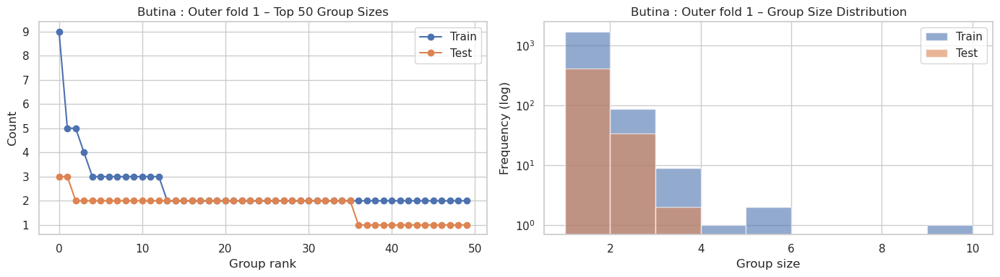

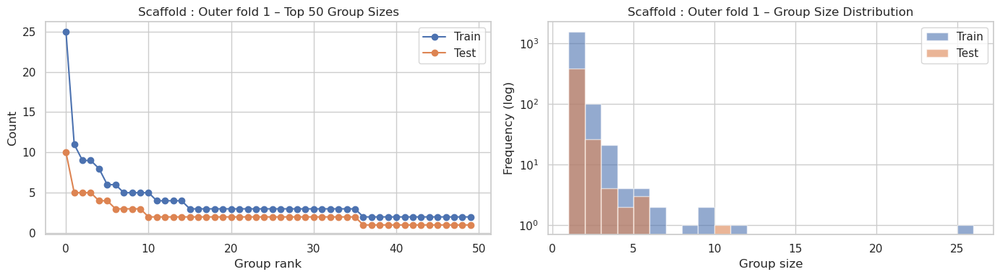

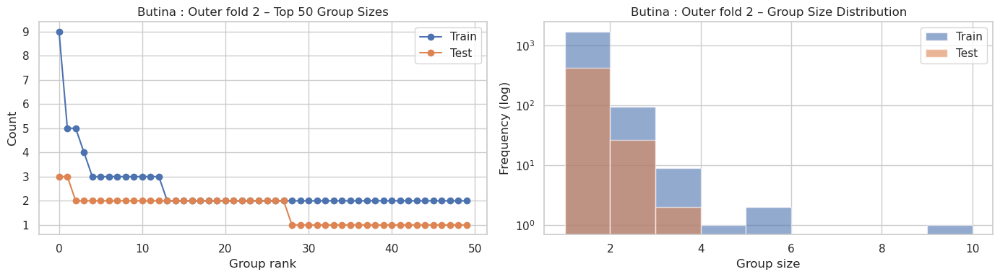

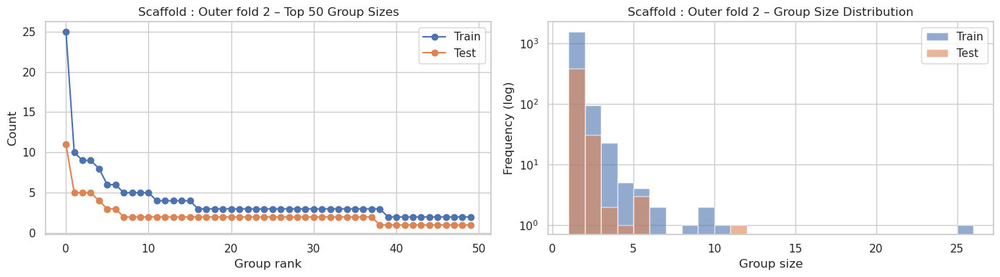

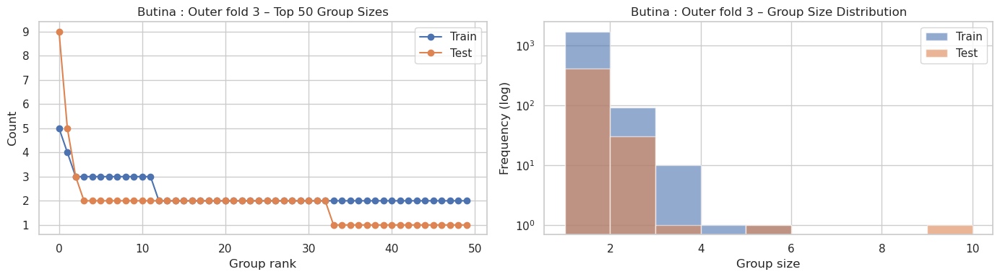

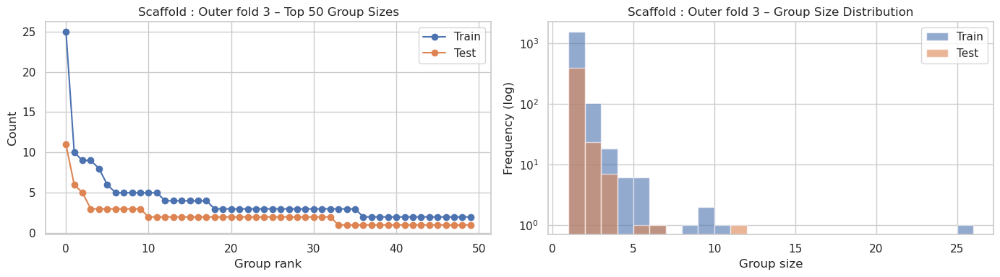

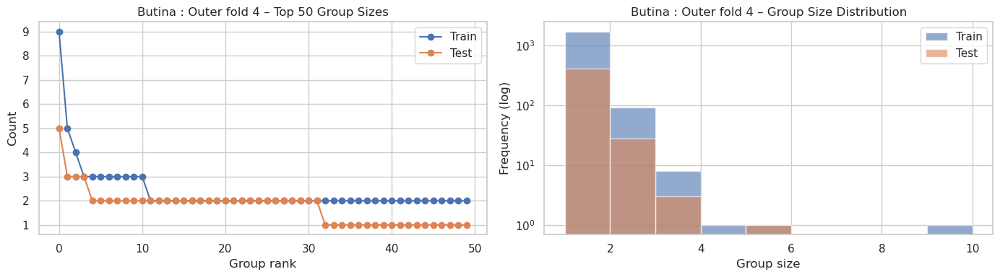

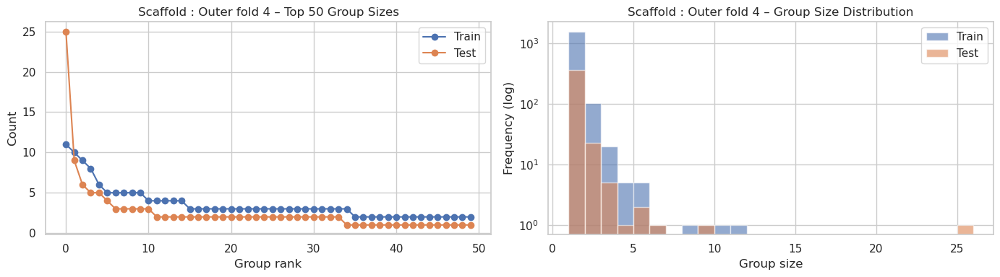

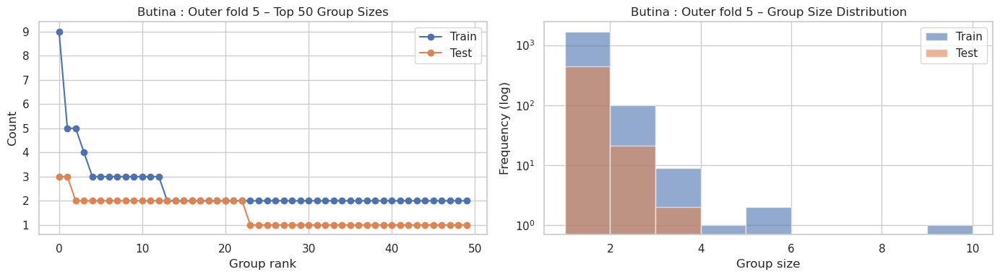

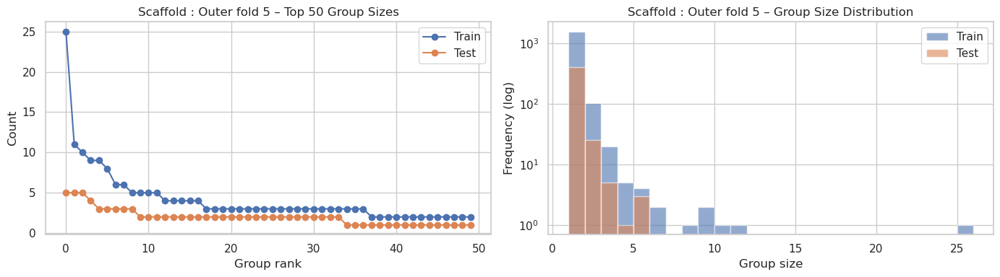

In [13]:
for fold in folds:
    train_b, test_b = load_fold(prefix, fold, "butina")
    plot_group_sizes(train_b, test_b, "Cluster_ID", f"Butina : Outer fold {fold}")

    train_s, test_s = load_fold(prefix, fold, "scaffold")
    plot_group_sizes(train_s, test_s, "Scaffold_ID", f"Scaffold : Outer fold {fold}")

#### Max Tanimoto Similarity between test and train sets across outer folds (Data leakage check in tanimoto similarity)

In [5]:
def plot_similarity_all_folds_by_split(prefix, split_type, folds, independent_test_file=None):
    plt.figure(figsize=(7, 5))

    for fold in folds:
        train, test = load_fold(prefix, fold, split_type)
        # Special case for independent test sets
        if independent_test_file is not None:
            test  = pd.read_csv(str(independent_test_file))
            test["Mol"]  = test["SMILES"].apply(Chem.MolFromSmiles)
            test = test[test["Mol"].notnull()]

        sims = max_train_similarity(train, test)

        hist, bin_edges = np.histogram(sims, bins=40, range=(0,1))
        bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

        plt.plot(
            bin_centers,
            hist,
            lw=2,
            label=f"Fold {fold}"
        )

    plt.title(f"{split_type.capitalize()} split – Max train-test similarity")
    plt.xlabel("Max Tanimoto similarity between train-test sets")
    plt.ylabel("Counts")
    # plt.ylim(0, 5)
    plt.legend(title="Outer folds")
    plt.tight_layout()
    plt.show()


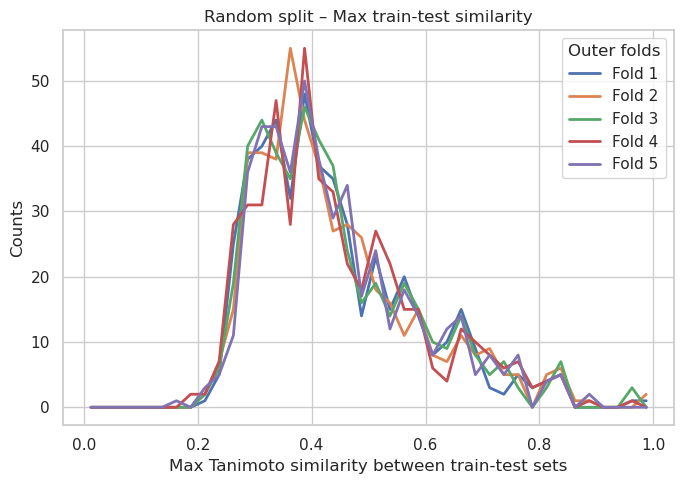

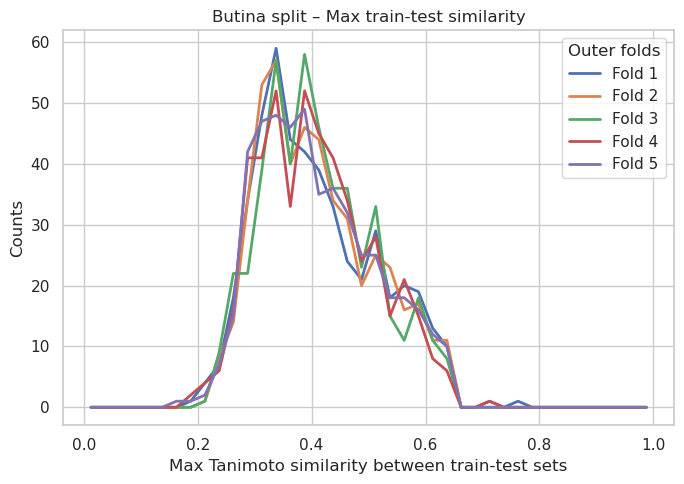

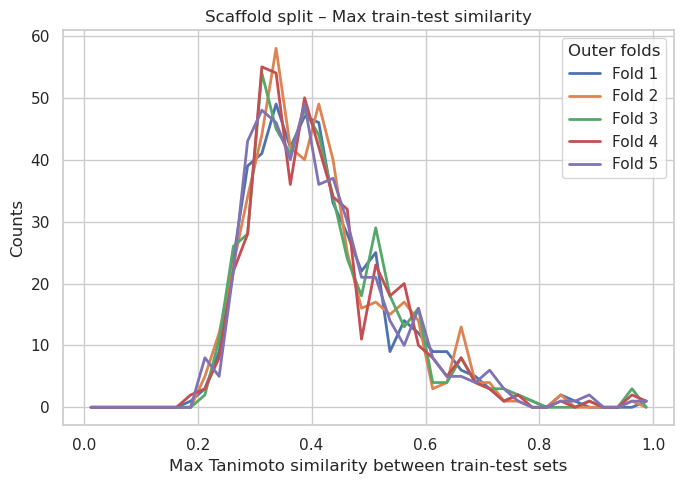

In [15]:
for split in splits:
    plot_similarity_all_folds_by_split(
        prefix=prefix,
        split_type=split,
        folds=folds
    )

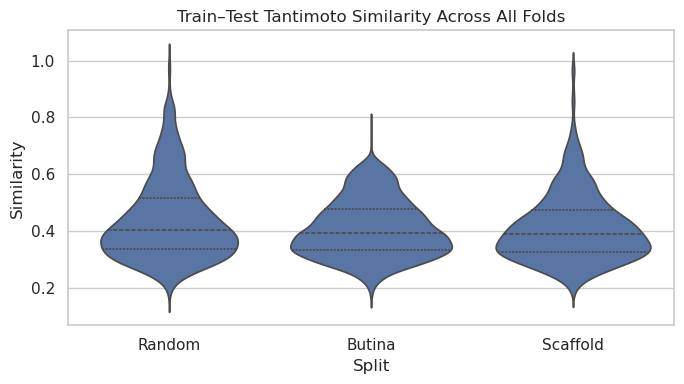

In [6]:
def collect_all_folds(prefix, split_type, folds):
    all_sims = []
    for f in folds:
        train, test = load_fold(prefix, f, split_type)
        all_sims.extend(max_train_similarity(train, test))
    return all_sims


folds = range(1, 6)

data = {
    "Random": collect_all_folds(prefix, "random", folds),
    "Butina": collect_all_folds(prefix, "butina", folds),
    "Scaffold": collect_all_folds(prefix, "scaffold", folds),
}

df = pd.DataFrame([
    (k, v) for k, sims in data.items() for v in sims
], columns=["Split", "Similarity"])

plt.figure(figsize=(7, 4))
sns.violinplot(data=df, x="Split", y="Similarity", inner="quartile")
plt.title("Train–Test Tantimoto Similarity Across All Folds")
plt.tight_layout()
plt.show()


#### How about in LGFE space?

##### Euclidean Distance and Cosine Similarity on full vector (Data leakage check in the LGFE space)

TDLR : It seems almost all the energy profiles have similar shape (potential data leakage oppertunity as model can memorize shape) but the magnitude is what causing the variabilty. On the hindsight, this can be minimized with a leave one cluster(class of permeation) out approach? Open for discussion. Might need community feedback on this.

In [7]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import euclidean_distances, cosine_similarity

In [8]:
def extract_lgfe_matrix(df):
    lgfe_cols = [c for c in df.columns if c.startswith("lgfe_")]
    return df[lgfe_cols].values

def nn_lgfe_similarity(train_csv, test_csv, normalize=True):
    train_df = pd.read_csv(train_csv)
    test_df  = pd.read_csv(test_csv)

    X_train = extract_lgfe_matrix(train_df)
    X_test  = extract_lgfe_matrix(test_df)

    if normalize:
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test  = scaler.transform(X_test)

    # --- Euclidean (min distance) ---
    dists = euclidean_distances(X_test, X_train)
    min_euclid = dists.min(axis=1)

    # --- Cosine (max similarity) ---
    sims = cosine_similarity(X_test, X_train)
    max_cosine = sims.max(axis=1)

    return np.sort(min_euclid), np.sort(max_cosine)

def collect_folds(prefix, split_type, n_folds):
    euclid_folds = []
    cosine_folds = []

    for fold in range(1, n_folds + 1):
        train_csv = f"{prefix}_{fold}_train_{split_type}.csv"
        test_csv  = f"{prefix}_{fold}_test_{split_type}.csv"

        min_e, max_c = nn_lgfe_similarity(train_csv, test_csv)
        euclid_folds.append(min_e)
        cosine_folds.append(max_c)

    return euclid_folds, cosine_folds

def plot_lgfe_with_side_count_line(folds, split_name, mode='euclid', bins=100, outputdir=None):
    """
    Plot LGFE metric with side count line along y-axis.
    
    Parameters:
        folds : list of np.arrays
            Each element is an array of metric values for a fold (sorted test molecules)
        split_name : str
            Name of the data split (for title)
        mode : str
            'euclid' for min Euclidean distance (log y-axis)
            'cosine' for max cosine similarity (y-axis 0-1)
        bins : int
            Number of bins for side count line
    """
    fig = plt.figure(figsize=(8,5))
    gs = fig.add_gridspec(1, 2, width_ratios=[4, 1], wspace=0.05)

    # --- Main plot ---
    ax_main = fig.add_subplot(gs[0])
    colors = plt.cm.tab10.colors
    for i, vals in enumerate(folds):
        color = colors[i % len(colors)]
        ax_main.plot(vals, marker='o', ms=3, lw=1, label=f"Fold {i+1}", color=color)

    if mode == 'euclid':
        ax_main.set_yscale("log")
        ax_main.set_ylabel("Min Euclidean distance (LGFE space)")
    elif mode == 'cosine':
        ax_main.set_ylim(0,1)
        ax_main.set_ylabel("Max Cosine similarity (LGFE space)")
    else:
        raise ValueError("mode must be 'euclid' or 'cosine'")

    ax_main.set_xlabel("Test molecules (sorted)")
    ax_main.legend()

    # --- Side count lines ---
    ax_count = fig.add_subplot(gs[1], sharey=ax_main)
    for i, vals in enumerate(folds):
        color = colors[i % len(colors)]
        counts, bin_edges = np.histogram(vals, bins=bins)
        bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
        ax_count.plot(counts, bin_centers, color=color, lw=2)  # connect bin centers with line

    ax_count.set_xlabel("Count")
    ax_count.yaxis.set_tick_params(labelleft=False)

    plt.suptitle(f"LGFE – {'Min Euclidean Distance' if mode=='euclid' else 'Max Cosine Similarity'} \n{split_name} split")
    # plt.tight_layout()
    if outputdir is not None:
        plt.savefig(f"{outputdir}/lgfe_{mode}_{split_name}.png", dpi=300)
    plt.show()



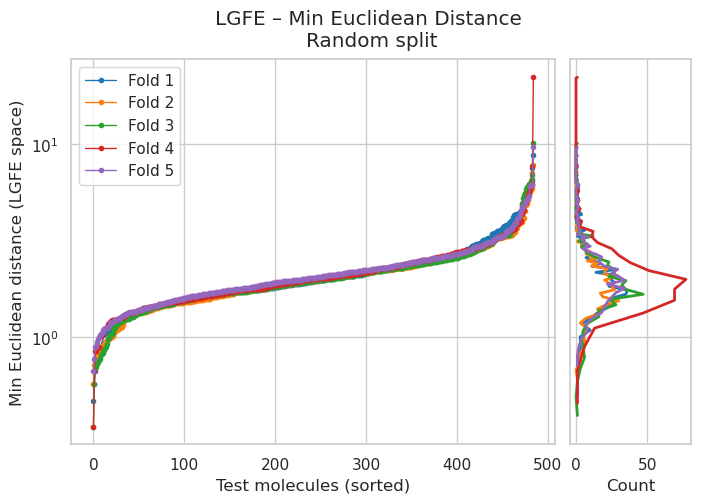

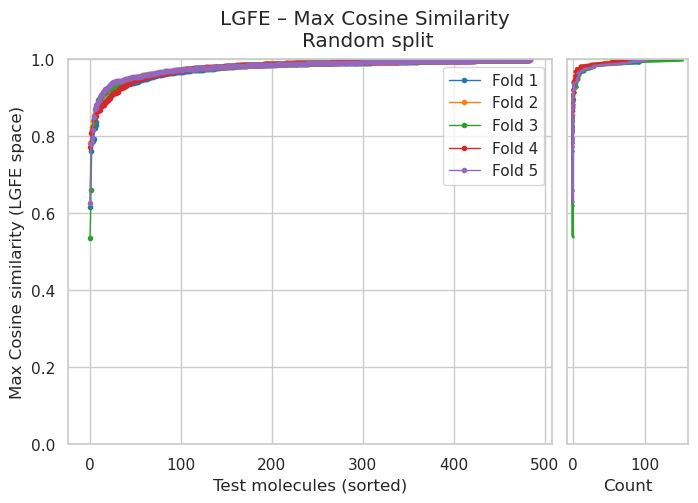

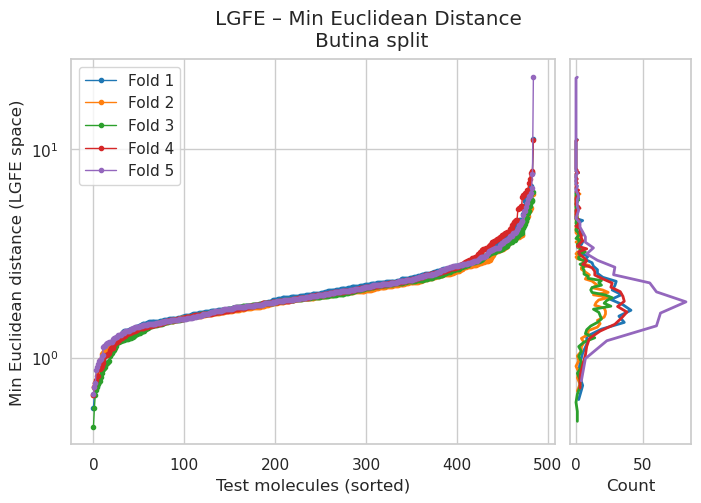

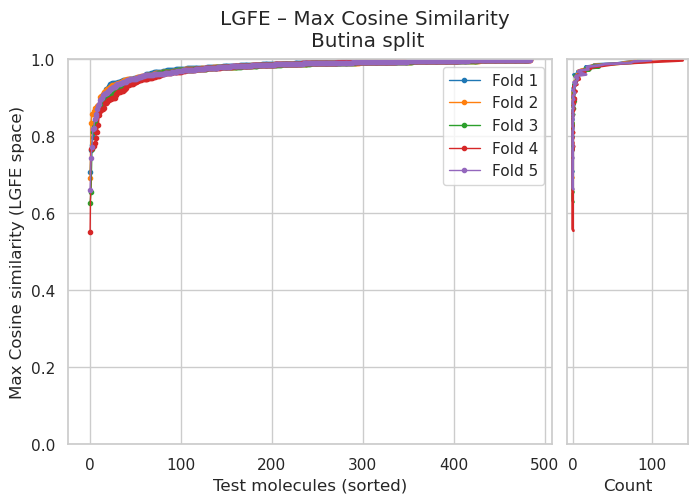

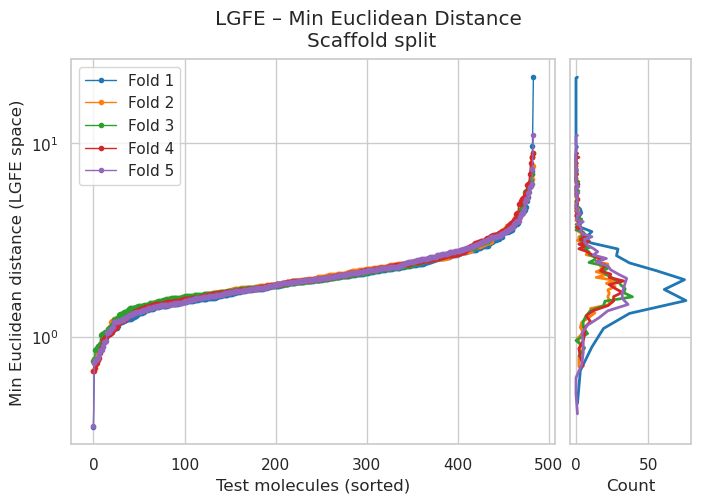

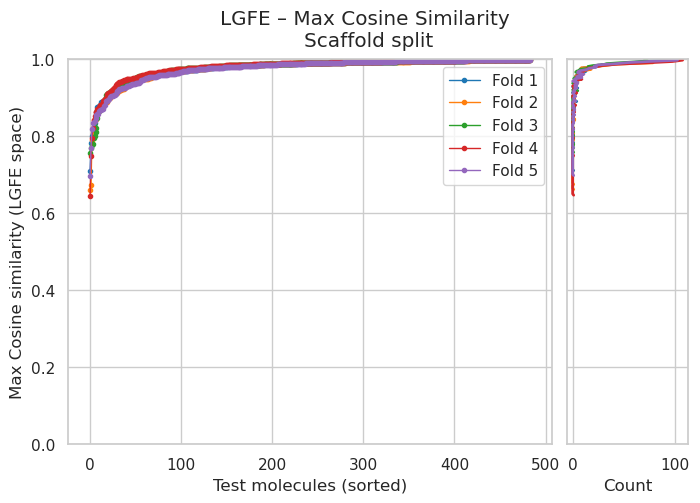

In [ ]:
n_folds = 5

for split in ["random", "butina", "scaffold"]:
    euclid_folds, cosine_folds = collect_folds(prefix, split, n_folds)

    plot_lgfe_with_side_count_line(euclid_folds, split_name=split.capitalize(), mode='euclid')
    plot_lgfe_with_side_count_line(cosine_folds, split_name=split.capitalize(), mode='cosine')

##### How about activity distribution across outer fold (test-train sets)

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# activity_col = "LOG10 MDR1-MDCK Papp_A2B (cm/s)"

def plot_outer_fold_activity_distributions(
    prefix,
    split_type,
    n_folds,
    activity_col="LOG10 MDR1-MDCK Papp_A2B (cm/s)"
):
    """
    For each outer fold:
      - Plot training vs test activity distributions as violin plots
    All folds shown in a single figure.
    """

    train_values = []
    test_values = []

    for fold in range(1, n_folds + 1):
        train_csv = f"{prefix}_{fold}_train_{split_type}.csv"
        test_csv  = f"{prefix}_{fold}_test_{split_type}.csv"

        train_df = pd.read_csv(train_csv)
        test_df  = pd.read_csv(test_csv)

        train_values.append(train_df[activity_col].dropna().values)
        test_values.append(test_df[activity_col].dropna().values)

    fig, ax = plt.subplots(figsize=(1.6 * n_folds, 6))

    positions_train = np.arange(1, n_folds + 1) - 0.15
    positions_test  = np.arange(1, n_folds + 1) + 0.15

    # --- Training violins (filled) ---
    v_train = ax.violinplot(
        train_values,
        positions=positions_train,
        widths=0.25,
        showmeans=False,
        showmedians=True,
        showextrema=False
    )

    for body in v_train['bodies']:
        body.set_facecolor("#1f77b4")
        body.set_edgecolor("black")
        body.set_alpha(0.6)

    # --- Test violins (outlined / lighter) ---
    v_test = ax.violinplot(
        test_values,
        positions=positions_test,
        widths=0.25,
        showmeans=False,
        showmedians=True,
        showextrema=True
    )

    for body in v_test['bodies']:
        body.set_facecolor("none")
        body.set_edgecolor("#d62728")
        body.set_linewidth(2)

    # --- Axis formatting ---
    ax.set_xticks(np.arange(1, n_folds + 1))
    ax.set_xticklabels([f"Fold {i}" for i in range(1, n_folds + 1)])
    ax.set_ylabel(str(activity_col))
    ax.set_xlabel("Outer fold")

    ax.set_title("Training vs Test Activity Distributions per Outer Fold")

    # --- Legend (manual) ---
    train_patch = plt.Line2D([0], [0], color="#1f77b4", lw=8, alpha=0.6)
    test_patch  = plt.Line2D([0], [0], color="#d62728", lw=2)

    ax.legend(
        [train_patch, test_patch],
        ["Train", "Test"],
        frameon=False
    )

    plt.tight_layout()
    plt.show()


random


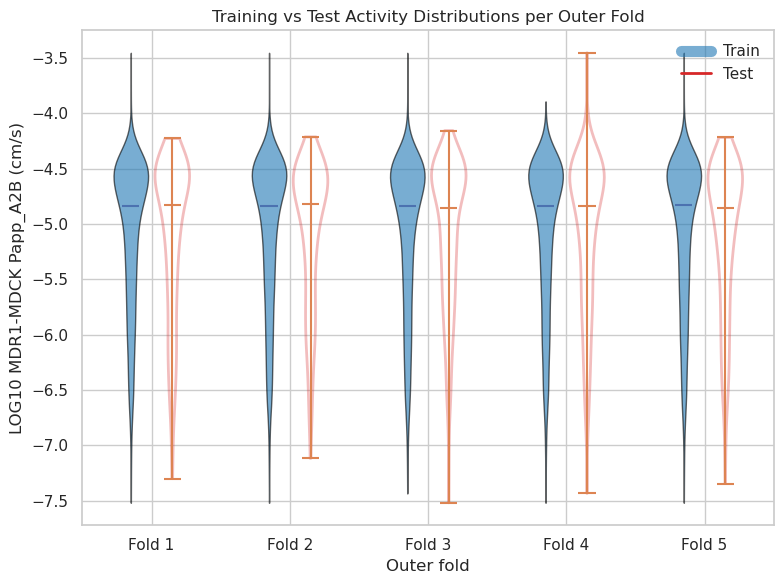

butina


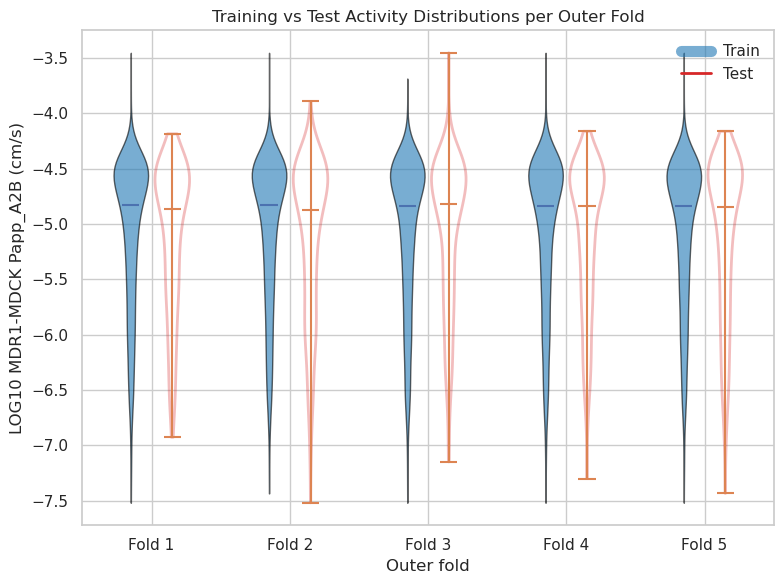

scaffold


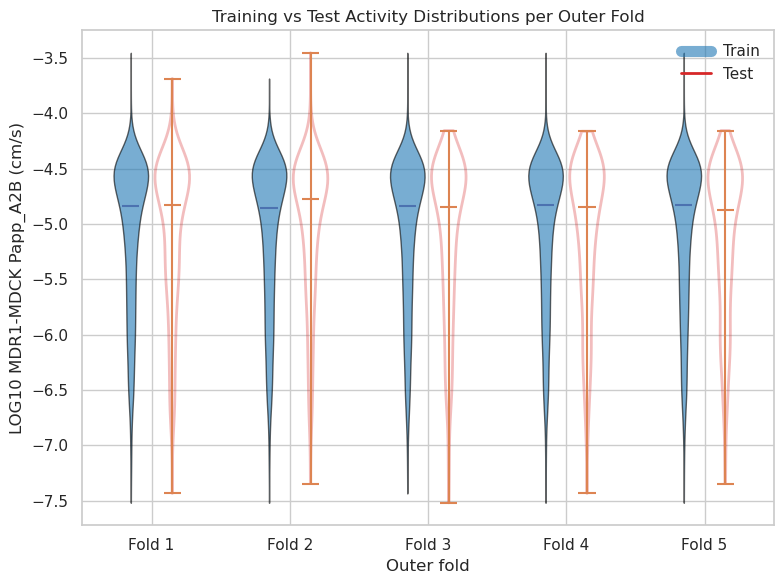

In [11]:
for split in splits:
    print (split)
    plot_outer_fold_activity_distributions(
        prefix=prefix,
        split_type=split,
        n_folds=len(folds)
    )

#### Efflux Ratio Distribution

random


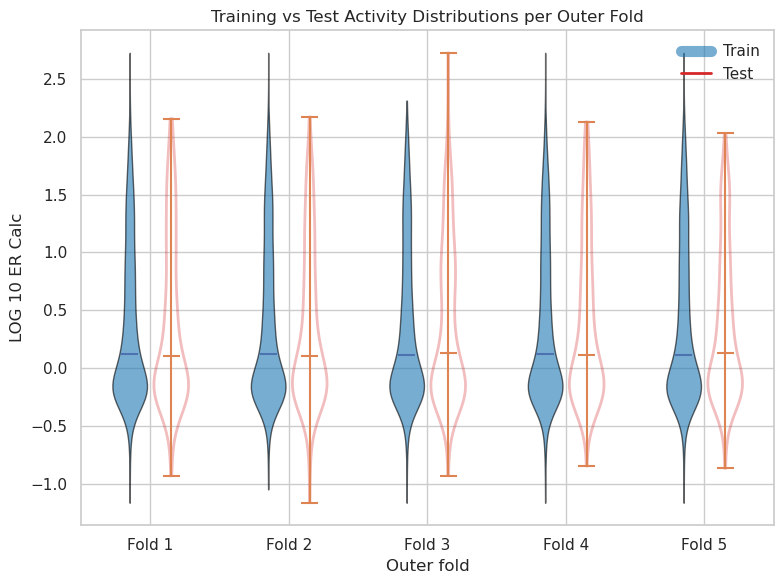

butina


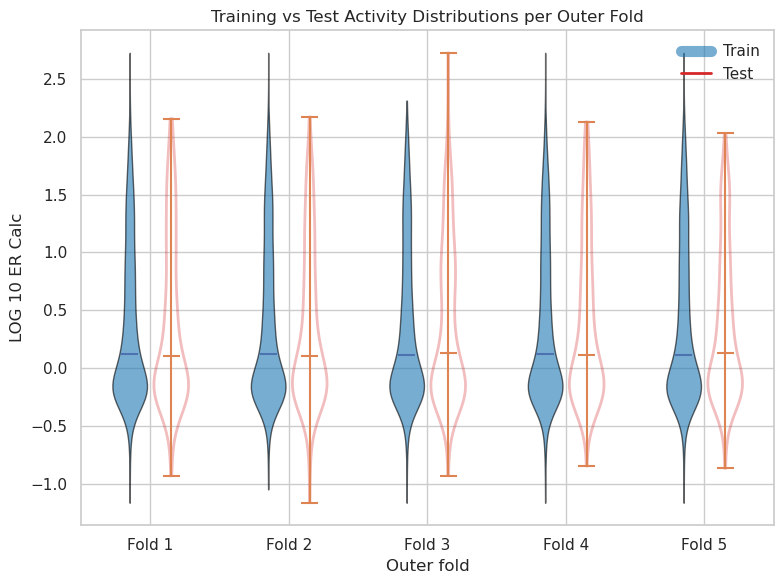

scaffold


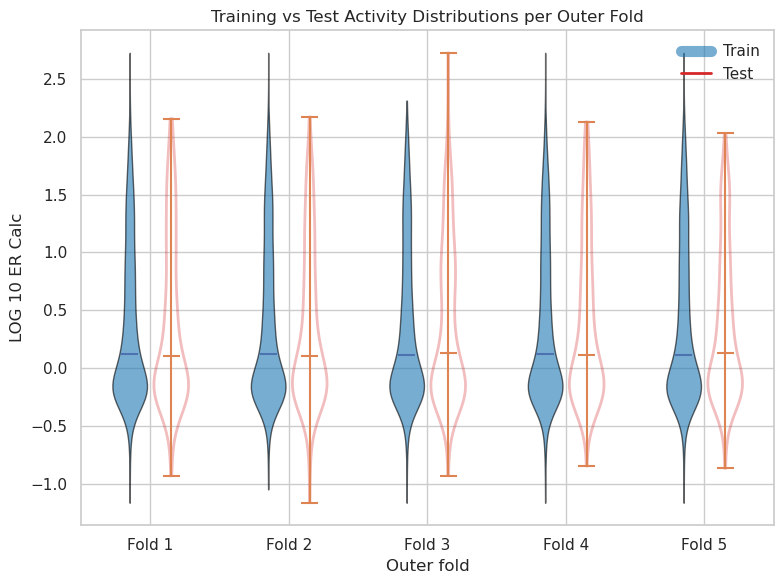

In [12]:
for split in splits:
    print (split)
    plot_outer_fold_activity_distributions(
    prefix="../data-processed/popc_chol-biogen/ER/popc_chol-biogen-ER_lgfe",
    split_type="random",   # or scaffold / butina
    n_folds=5,
    activity_col="LOG 10 ER Calc"
)

In [10]:
def summarize_test_nn_similarity(
    prefix,
    split_type,
    folds,
    output_csv,
    independent_test_file=None,
    smiles_col="Standard_SMILES",
):
    records = []

    for fold in folds:
        # --- Load fold data ---
        train_df, test_df = load_fold(prefix, fold, split_type, smiles_col=smiles_col)

        # --- Optional independent test override ---
        if independent_test_file is not None:
            test_df = pd.read_csv(independent_test_file)
            test_df["Mol"] = test_df[smiles_col].apply(Chem.MolFromSmiles)
            test_df = test_df[test_df["Mol"].notnull()]

        # --- Fingerprint Tanimoto ---
        max_tanimoto = max_train_similarity(train_df, test_df)

        # --- LGFE NN metrics ---
        # Reuse existing function; we need unsorted values → call internally
        X_train = extract_lgfe_matrix(train_df)
        X_test  = extract_lgfe_matrix(test_df)

        dists = euclidean_distances(X_test, X_train)
        min_euclid = dists.min(axis=1)

        sims = cosine_similarity(X_test, X_train)
        max_cosine = sims.max(axis=1)

        if "Parent" in train_df.columns:
            for i, row in test_df.iterrows():
                records.append({
                    "Name": row.get("Name", None),
                    "Molecule": row.get("Molecule", None),
                    "Parent": row.get("Parent", None),
                    "SMILES": row[smiles_col],
                    "outer_fold": fold,
                    "max_similarity_to_train": max_tanimoto[i],
                    "min_euclidean_distance_to_train": min_euclid[i],
                    "max_cosine_similarity_to_train": max_cosine[i],
                })
        else:
            for i, row in test_df.iterrows():
                records.append({
                    "Name": row.get("Name", None),
                    "Molecule": row.get("Molecule", None),
                    "SMILES": row[smiles_col],
                    "outer_fold": fold,
                    "max_similarity_to_train": max_tanimoto[i],
                    "min_euclidean_distance_to_train": min_euclid[i],
                    "max_cosine_similarity_to_train": max_cosine[i],
                })

    out_df = pd.DataFrame(records)
    out_df = out_df.dropna(axis=1,how='all')
    out_df.to_csv(output_csv, index=False)
    return out_df


In [36]:
def summarize_test_nn_similarity(
    prefix,
    split_type,
    folds,
    output_csv,
    independent_test_file=None,
    smiles_col="Standard_SMILES",
):
    records = []

    for fold in folds:
        # --- Load fold data ---
        train_df, test_df = load_fold(prefix, fold, split_type, smiles_col=smiles_col)

        # --- Optional independent test override ---
        if independent_test_file is not None:
            test_df = pd.read_csv(independent_test_file)
            test_df["Mol"] = test_df[smiles_col].apply(Chem.MolFromSmiles)
            test_df = test_df[test_df["Mol"].notnull()]

        # --- Fingerprint Tanimoto ---
        max_tanimoto = max_train_similarity(train_df, test_df)

        # --- LGFE NN metrics ---
        # Reuse existing function; we need unsorted values → call internally
        X_train = extract_lgfe_matrix(train_df)
        X_test  = extract_lgfe_matrix(test_df)

        dists = euclidean_distances(X_test, X_train)
        min_euclid = dists.min(axis=1)

        sims = cosine_similarity(X_test, X_train)
        max_cosine = sims.max(axis=1)

        if "Parent" in train_df.columns:
            for i, row in test_df.iterrows():
                records.append({
                    "Name": row.get("Name", None),
                    "Molecule": row.get("Molecule", None),
                    "Parent": row.get("Parent", None),
                    "SMILES": row[smiles_col],
                    "outer_fold": fold,
                    "max_similarity_to_train": max_tanimoto[i],
                    "min_euclidean_distance_to_train": min_euclid[i],
                    "max_cosine_similarity_to_train": max_cosine[i],
                })
        else:
            for i, row in test_df.iterrows():
                records.append({
                    "Name": row.get("Name", None),
                    "Molecule": row.get("Molecule", None),
                    "SMILES": row[smiles_col],
                    "outer_fold": fold,
                    "max_similarity_to_train": max_tanimoto[i],
                    "min_euclidean_distance_to_train": min_euclid[i],
                    "max_cosine_similarity_to_train": max_cosine[i],
                })

    out_df = pd.DataFrame(records)
    out_df = out_df.dropna(axis=1,how='all')
    out_df.to_csv(output_csv, index=False)

    # Found an outlier in min_euclean distance → remove before returning
    out_df = out_df[out_df["min_euclidean_distance_to_train"] < 100.0]

    return out_df

def plot_similarity_vs_distance(df, outputdir=None):
    """
    Scatter plot: max similarity (Tanimoto) vs min Euclidean distance to training set.
    
    Parameters:
        df (pd.DataFrame): Output from summarize_test_nn_similarity
        save_path (str, optional): File path to save the figure
        title (str, optional): Plot title
    """
    x = df["max_similarity_to_train"]
    y = df["min_euclidean_distance_to_train"]

    plt.figure(figsize=(6,5))
    plt.scatter(x, y, alpha=0.6, s=30, c='black') # edgecolors='w', s=50
    plt.xlabel("Max Tanimoto Similarity to Train")
    plt.ylabel("Min Euclidean Distance to Train")
    plt.title("Max Tanimoto vs Min Euclidean Distance")
    plt.grid(True, linestyle='--', alpha=0.5)
    
    plt.tight_layout()
    if outputdir is not None:
        plt.savefig(f"{outputdir}/similarity_vs_distance.png", dpi=300)
    plt.show()

def load_model_predictions(model_folder, split, source, system):
    dfs = []
    for fname in glob.glob(f"{model_folder}/{system}*{source}*_test_{split}_fold*_predicted.csv"):
        # print (fname)
        fold = int(fname.split("_fold")[1].split("_")[0])
        df = pd.read_csv(fname)
        df["outer_fold"] = fold
        dfs.append(df)

    return pd.concat(dfs, ignore_index=True)

def merge_similarity_and_predictions(sim_df, pred_df):
    merged = sim_df.merge(
        pred_df,
        on=["SMILES", "outer_fold"],
        how="inner"
    )
        # --- Recompute errors (DO NOT trust file columns) ---
    merged["abs_error"] = (merged["True"] - merged["Predicted"]).abs()
    merged["sq_error"]  = (merged["True"] - merged["Predicted"])**2

    assert (merged["abs_error"] >= 0).all(), "Negative absolute error detected!"

    return merged

def similarity_binned_error(df, bins, what2bin):
    summaries = []

    df["sim_bin"] = pd.cut(df[what2bin], bins=bins, include_lowest=True)

    for b, grp in df.groupby("sim_bin"):
        if len(grp) == 0:
            continue

        summaries.append({
            "sim_bin": b,
            "n": len(grp),
            "mean_abs_error": grp["abs_error"].mean(),
            "rmse": np.sqrt(grp["sq_error"].mean()),
            "sem_abs_error": grp["abs_error"].std(ddof=1) / np.sqrt(len(grp)),
        })

    return pd.DataFrame(summaries)

def plot_similarity_vs_error(
    model_folders,
    model_list,
    split,
    nn_similarity_csvs,
    source,
    system,
    what2bin,
):
    results = {}

    for model, folder, sim_csv in zip(model_list, model_folders, nn_similarity_csvs):
        # print (model, folder, sim_csv)
        sim_df = pd.read_csv(sim_csv)
        pred_df = load_model_predictions(folder, split, source, system)

        merged = merge_similarity_and_predictions(sim_df, pred_df)
        # print (merged)
        if what2bin=="max_similarity_to_train":
            bins=np.arange(0.1, 1.01, 0.1)
        elif what2bin=="min_euclidean_distance_to_train":
            bins=np.arange(0.1, 10.1, 1)
            # bins=np.logspace(-1, 1, 10)
        elif what2bin=="max_cosine_similarity_to_train":
            bins=np.arange(0.951, 1.001, 0.001)
            
        summary = similarity_binned_error(merged, bins, what2bin)
        

        results[model] = summary
        # print (results[model])

    return results

def plot_binned_curves(results, metric="mean_abs_error", what2bin=None, outputdir=None):
    plt.figure(figsize=(7,5))

    for model, df in results.items():
        # Bin midpoints for x-axis spacing
        # x = [b.mid for b in df["sim_bin"]]
        x = [str(b) for b in df["sim_bin"]]
        y = df[metric]

        if metric.lower() == "rmse":
            plt.plot(x, y, marker="o", label=model)
        else:
            plt.errorbar(x, y, yerr=df["sem_abs_error"], marker="o", label=model)

    plt.xlabel(f"{what2bin} (binned)")
    plt.ylabel("Mean absolute error [log10]")
    plt.xticks(rotation=90)
    plt.legend()
    plt.ylim(0,1.5)
    plt.tight_layout()
    if outputdir is not None:
        plt.savefig(f"{outputdir}/binned_curves.png", dpi=300)
    ax1 = plt.gca()
    ax2 = ax1.twinx()

    # Use bin counts from the first model as the secondary-axis series
    first_model = next(iter(results))
    n_df = results[first_model]
    x_n = [str(b) for b in n_df["sim_bin"]]

    frac_n = n_df["n"] / n_df["n"].sum()
    ax2.plot(x_n, frac_n, color="black", marker="s", linestyle="-", label="Fraction in bin")
    ax2.set_ylabel("Fraction of total molecules", color="black")
    ax2.tick_params(axis="y", labelcolor="black")
    ax2.set_ylim(0, 1)
    ax2.grid(False)

    # Combine legends from both axes
    h1, l1 = ax1.get_legend_handles_labels()
    h2, l2 = ax2.get_legend_handles_labels()
    ax1.legend(h1 + h2, l1 + l2, loc="best")

    plt.tight_layout()
    plt.show()

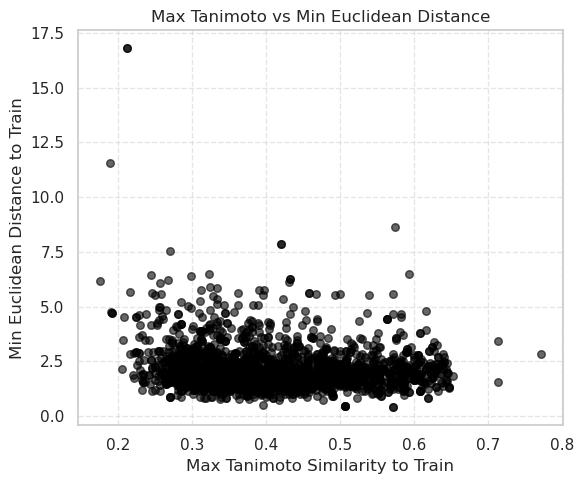

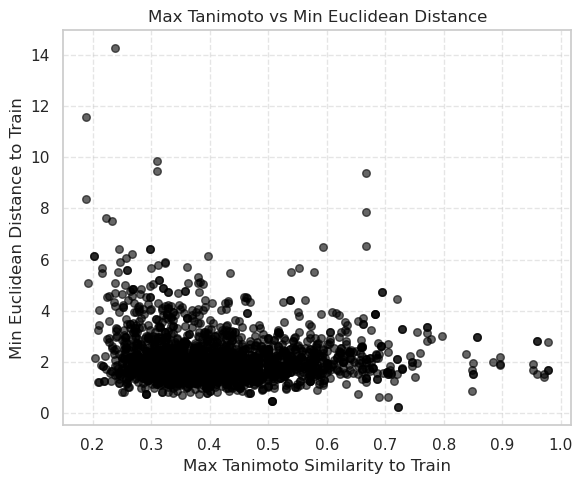

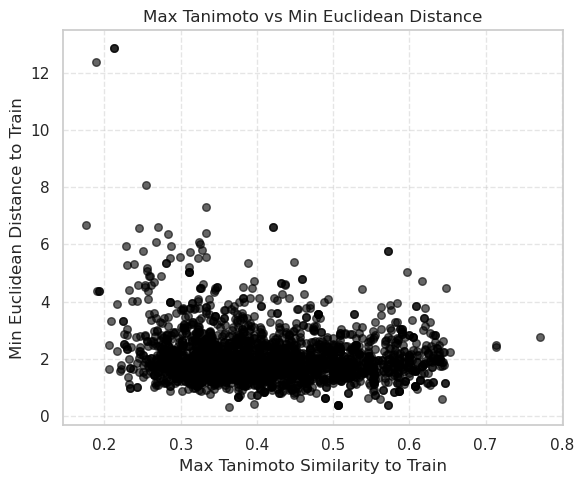

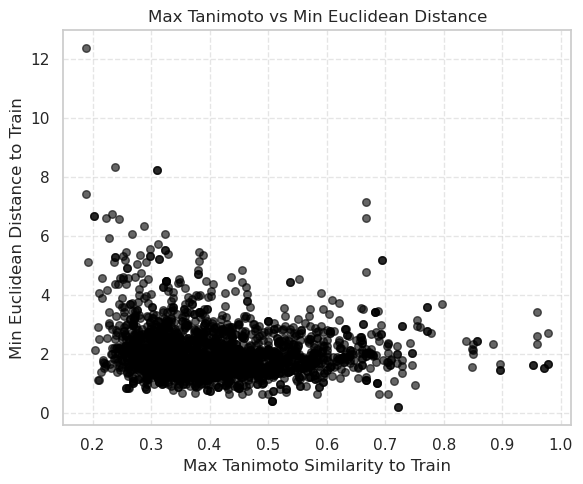

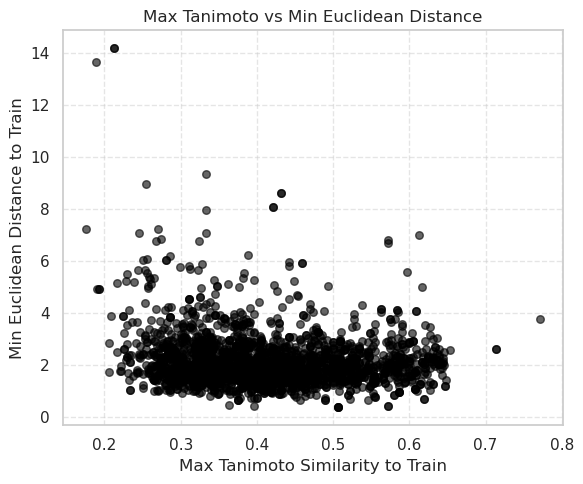

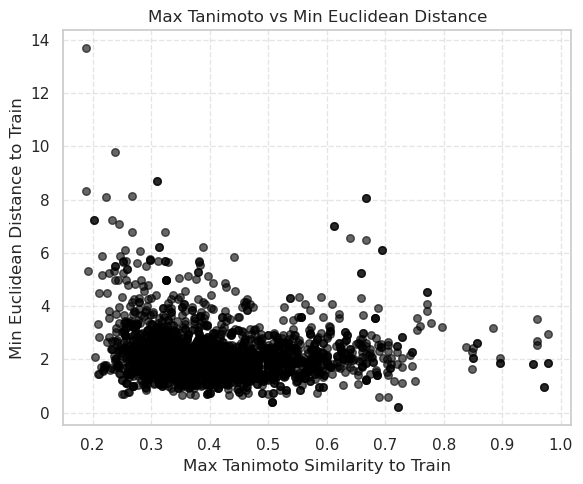

In [19]:
os.makedirs("nn_similarity_summaries", exist_ok=True)
for system in ["popc_chol-biogen", "pampa-biogen", "bbb-biogen"]:
    os.makedirs(f"nn_similarity_summaries/{system}", exist_ok=True)
    for split in ["butina", "scaffold"]:
        df = summarize_test_nn_similarity(
            prefix=f"../data-processed/{system}/P_app/{system}-P_app_lgfe",
            split_type=split,
            folds=folds,
            output_csv=f"nn_similarity_summaries/{system}/{system}_{split}.csv",
            independent_test_file=None,
            smiles_col="SMILES"
        )
        plot_similarity_vs_distance(df)

In [37]:
model_folders = ["../ml-modeling-P_app_lgfe_biogen_base/evaluation/FCNN-1/error", 
                 "../ml-modeling-P_app_lgfe_biogen_base/evaluation/LightGBM/error",
                 "../ml-modeling-P_app_lgfe_biogen_base/evaluation/XGBoost/error"]
model_list = ["FCNN", "LightGBM", "XGBoost"]

Processing popc_chol-biogen - butina split
['nn_similarity_summaries/popc_chol-biogen/popc_chol-biogen_butina.csv', 'nn_similarity_summaries/popc_chol-biogen/popc_chol-biogen_butina.csv', 'nn_similarity_summaries/popc_chol-biogen/popc_chol-biogen_butina.csv']


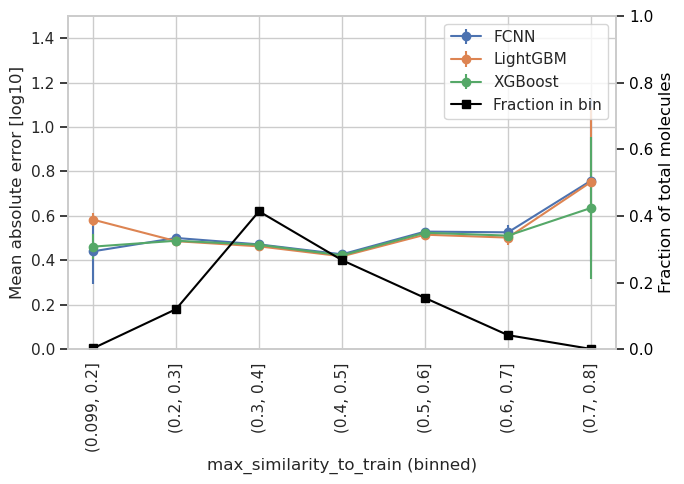

Processing popc_chol-biogen - scaffold split
['nn_similarity_summaries/popc_chol-biogen/popc_chol-biogen_scaffold.csv', 'nn_similarity_summaries/popc_chol-biogen/popc_chol-biogen_scaffold.csv', 'nn_similarity_summaries/popc_chol-biogen/popc_chol-biogen_scaffold.csv']


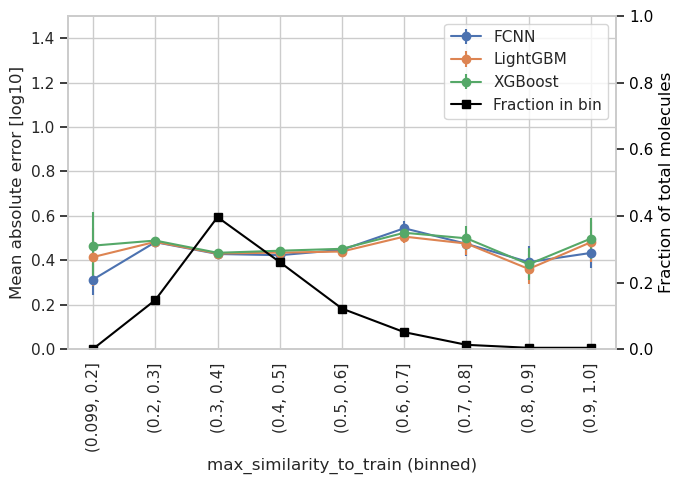

Processing pampa-biogen - butina split
['nn_similarity_summaries/pampa-biogen/pampa-biogen_butina.csv', 'nn_similarity_summaries/pampa-biogen/pampa-biogen_butina.csv', 'nn_similarity_summaries/pampa-biogen/pampa-biogen_butina.csv']


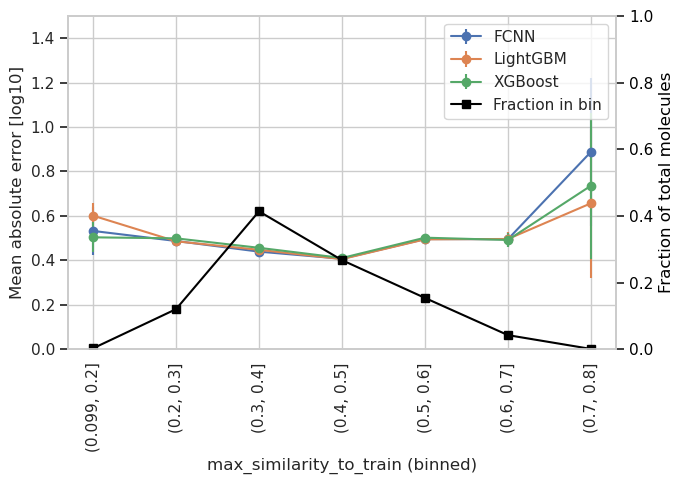

Processing pampa-biogen - scaffold split
['nn_similarity_summaries/pampa-biogen/pampa-biogen_scaffold.csv', 'nn_similarity_summaries/pampa-biogen/pampa-biogen_scaffold.csv', 'nn_similarity_summaries/pampa-biogen/pampa-biogen_scaffold.csv']


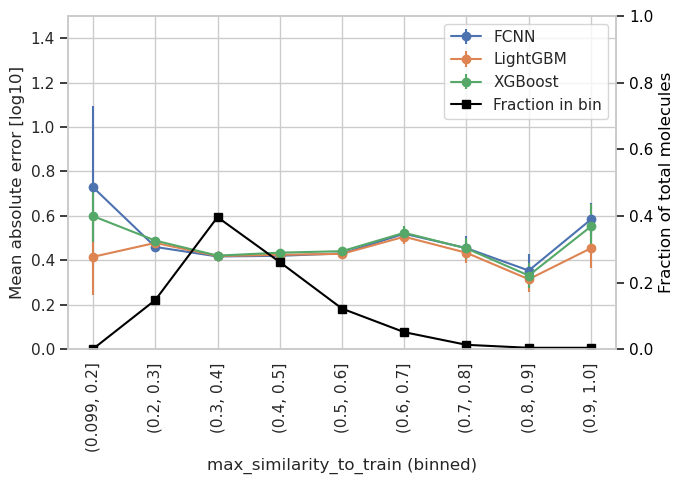

Processing bbb-biogen - butina split
['nn_similarity_summaries/bbb-biogen/bbb-biogen_butina.csv', 'nn_similarity_summaries/bbb-biogen/bbb-biogen_butina.csv', 'nn_similarity_summaries/bbb-biogen/bbb-biogen_butina.csv']


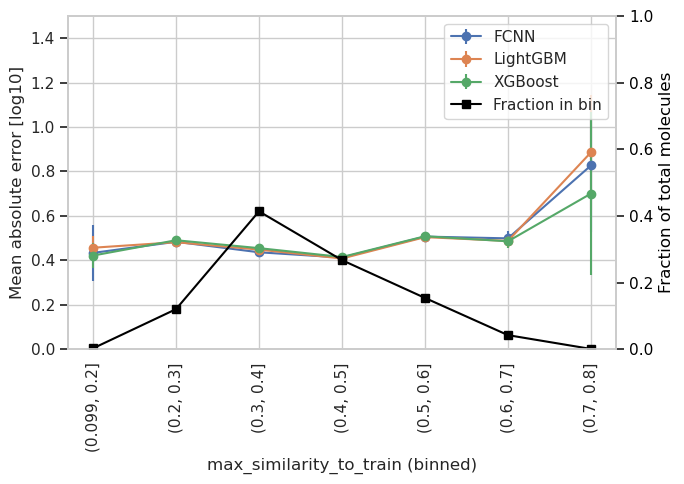

Processing bbb-biogen - scaffold split
['nn_similarity_summaries/bbb-biogen/bbb-biogen_scaffold.csv', 'nn_similarity_summaries/bbb-biogen/bbb-biogen_scaffold.csv', 'nn_similarity_summaries/bbb-biogen/bbb-biogen_scaffold.csv']


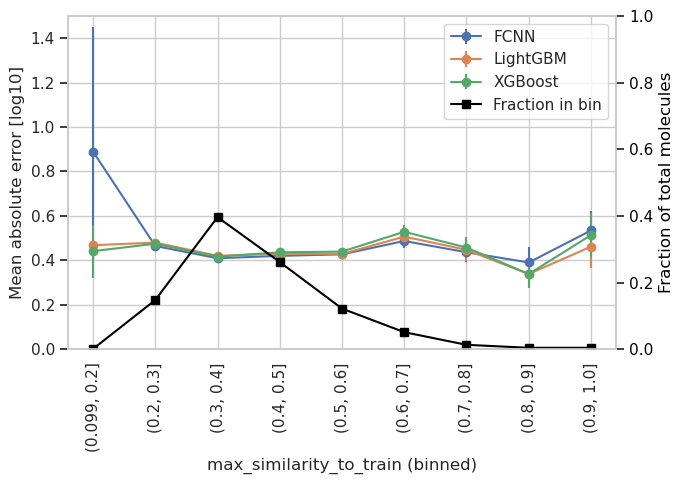

In [38]:
source = "P_app_lgfe"

for system in ["popc_chol-biogen", "pampa-biogen", "bbb-biogen"]:
    
    for split in ["butina", "scaffold"]:

        print(f"Processing {system} - {split} split")

        nn_similarity_csvs = [f"nn_similarity_summaries/{system}/{system}_{split}.csv",
                              f"nn_similarity_summaries/{system}/{system}_{split}.csv",
                              f"nn_similarity_summaries/{system}/{system}_{split}.csv"]
        
        print (nn_similarity_csvs)
                              
        results = plot_similarity_vs_error(model_folders=model_folders, model_list=model_list, split=split, source=source, system=system, nn_similarity_csvs=nn_similarity_csvs, what2bin="max_similarity_to_train")

        plot_binned_curves(results, metric="mean_abs_error", what2bin="max_similarity_to_train")

Processing popc_chol-biogen - butina split


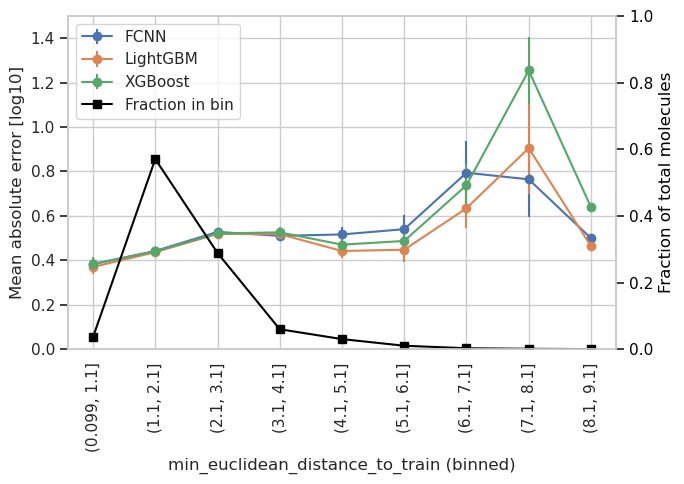

Processing popc_chol-biogen - scaffold split


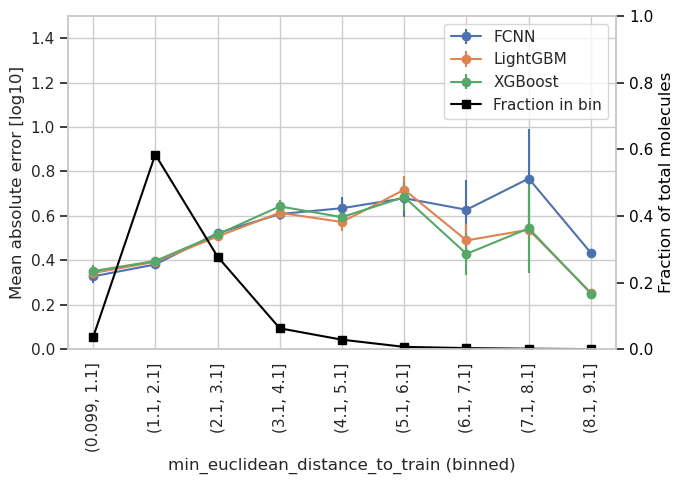

Processing pampa-biogen - butina split


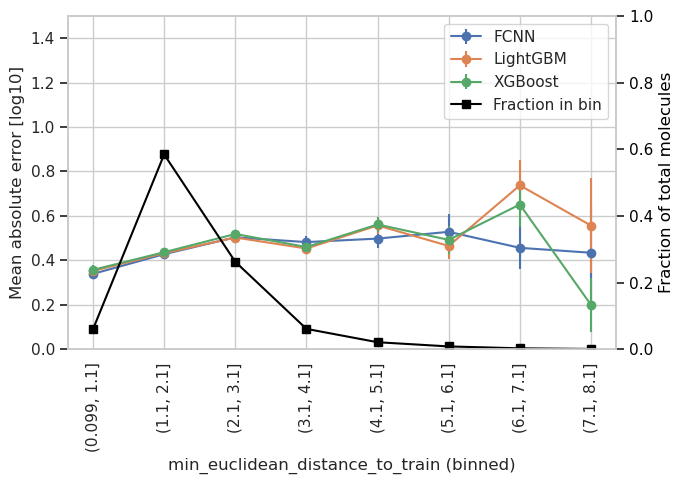

Processing pampa-biogen - scaffold split


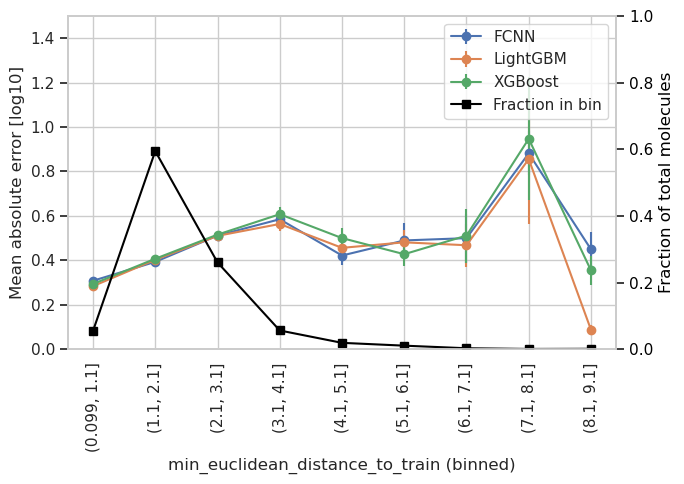

Processing bbb-biogen - butina split


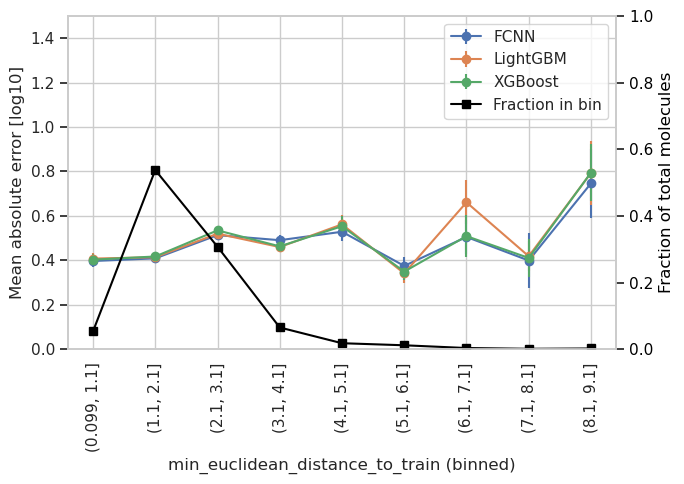

Processing bbb-biogen - scaffold split


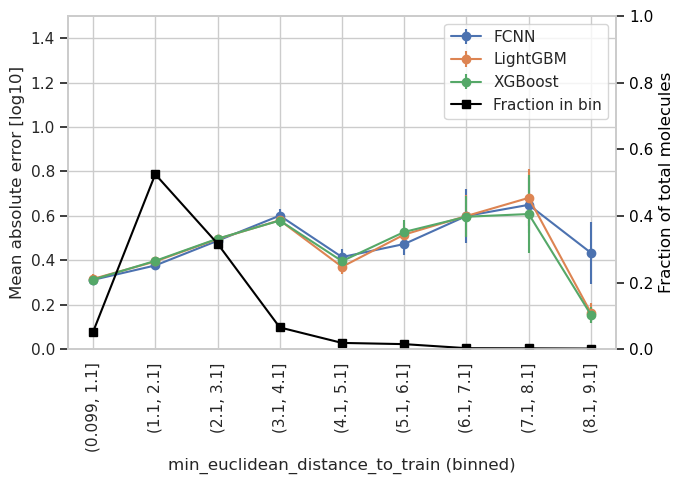

In [39]:
source = "P_app_lgfe"

for system in ["popc_chol-biogen", "pampa-biogen", "bbb-biogen"]:
    
    for split in ["butina", "scaffold"]:

        print (f"Processing {system} - {split} split")

        nn_similarity_csvs = [f"nn_similarity_summaries/{system}/{system}_{split}.csv",
                              f"nn_similarity_summaries/{system}/{system}_{split}.csv",
                              f"nn_similarity_summaries/{system}/{system}_{split}.csv"]
                              
        results = plot_similarity_vs_error(model_folders=model_folders, model_list=model_list, split=split, source=source, system=system, nn_similarity_csvs=nn_similarity_csvs, what2bin="min_euclidean_distance_to_train")

        plot_binned_curves(results, metric="mean_abs_error", what2bin="min_euclidean_distance_to_train")

## ER

popc_chol-biogen butina


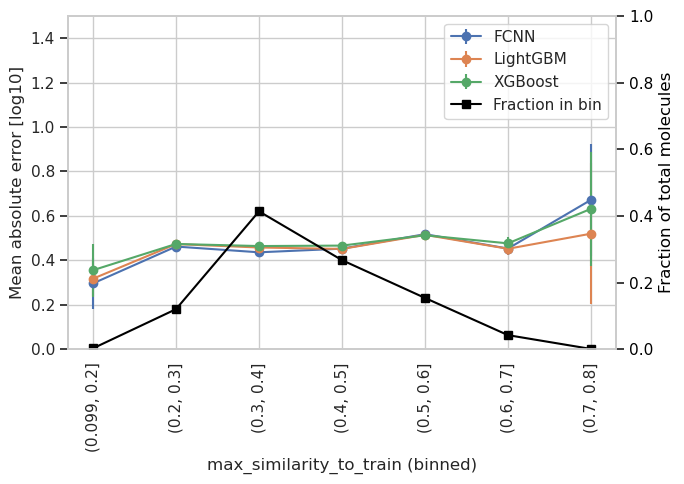

popc_chol-biogen scaffold


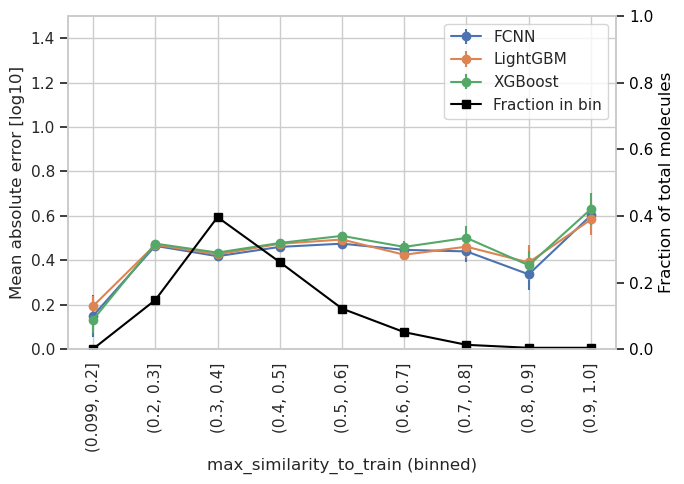

pampa-biogen butina


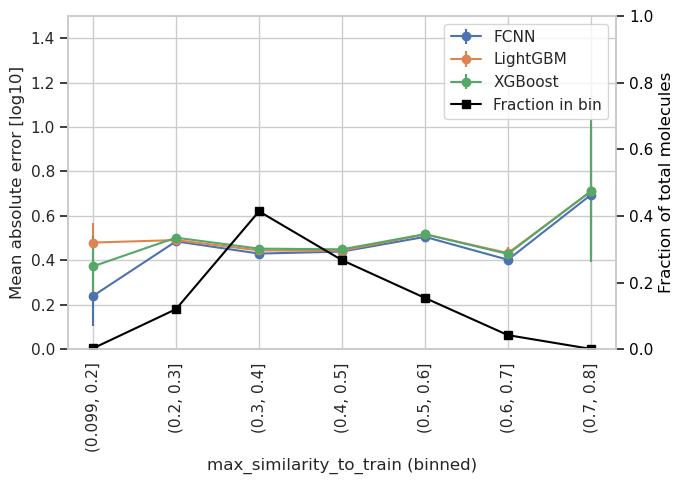

pampa-biogen scaffold


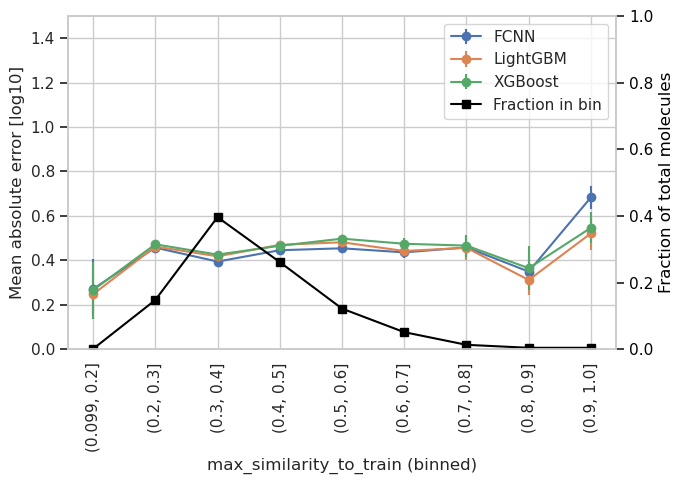

bbb-biogen butina


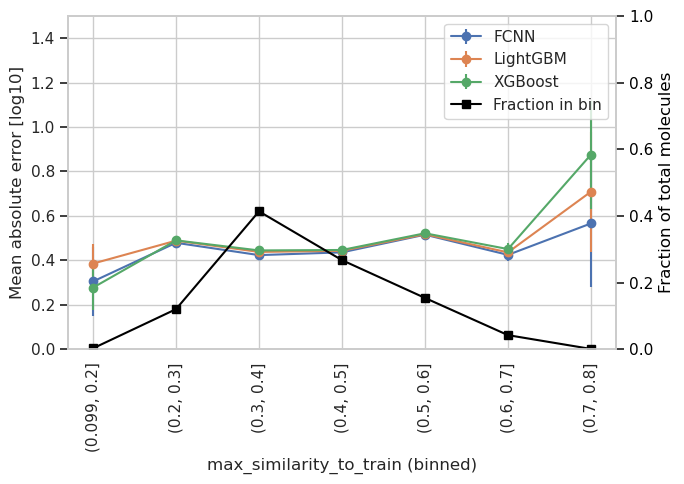

bbb-biogen scaffold


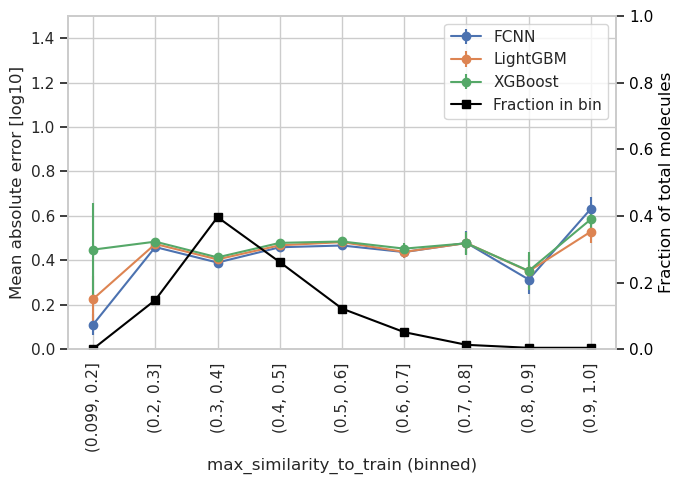

In [40]:
model_folders = ["../ml-modeling-ER_lgfe_biogen_base/evaluation/FCNN-1/error", 
                 "../ml-modeling-ER_lgfe_biogen_base/evaluation/LightGBM/error",
                 "../ml-modeling-ER_lgfe_biogen_base/evaluation/XGBoost/error"]
model_list = ["FCNN", "LightGBM", "XGBoost"]

source = "ER_lgfe"

for system in ["popc_chol-biogen", "pampa-biogen", "bbb-biogen"]:
    
    for split in ["butina", "scaffold"]:

        print (system, split)

        nn_similarity_csvs = [f"nn_similarity_summaries/{system}/{system}_{split}.csv",
                              f"nn_similarity_summaries/{system}/{system}_{split}.csv",
                              f"nn_similarity_summaries/{system}/{system}_{split}.csv"]
                              
        results = plot_similarity_vs_error(model_folders=model_folders, model_list=model_list, split=split, source=source, system=system, nn_similarity_csvs=nn_similarity_csvs, what2bin="max_similarity_to_train")

        plot_binned_curves(results, metric="mean_abs_error", what2bin="max_similarity_to_train")

popc_chol-biogen butina


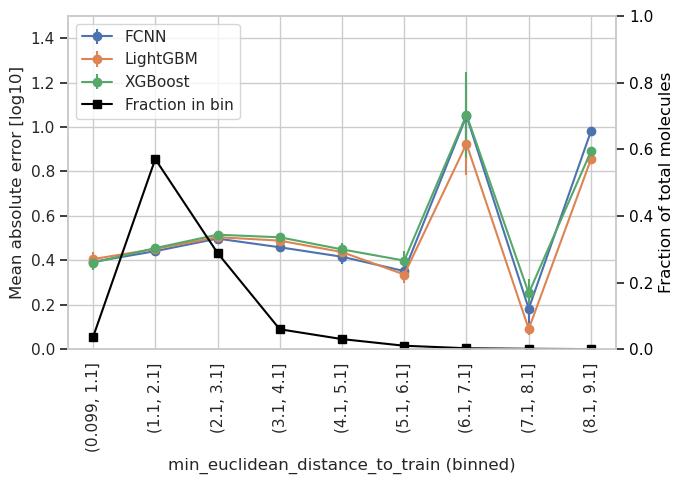

popc_chol-biogen scaffold


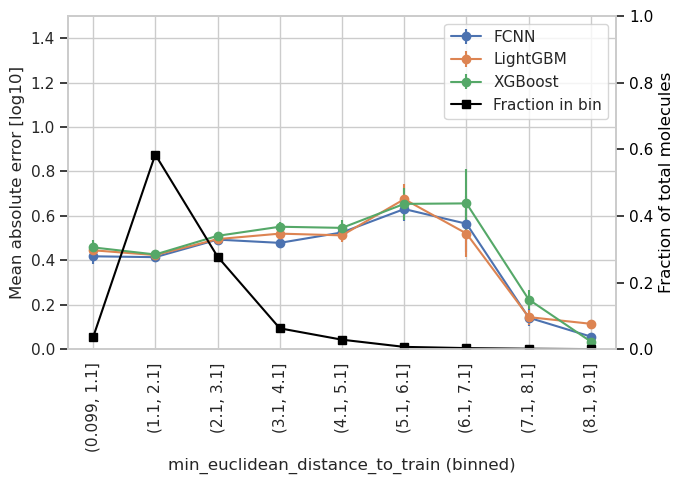

pampa-biogen butina


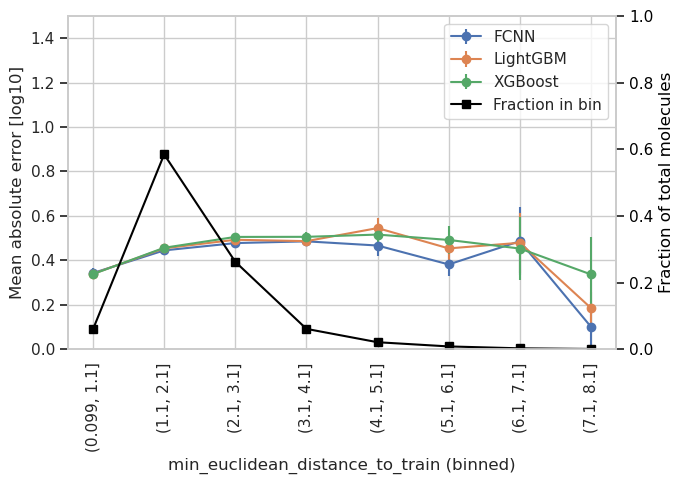

pampa-biogen scaffold


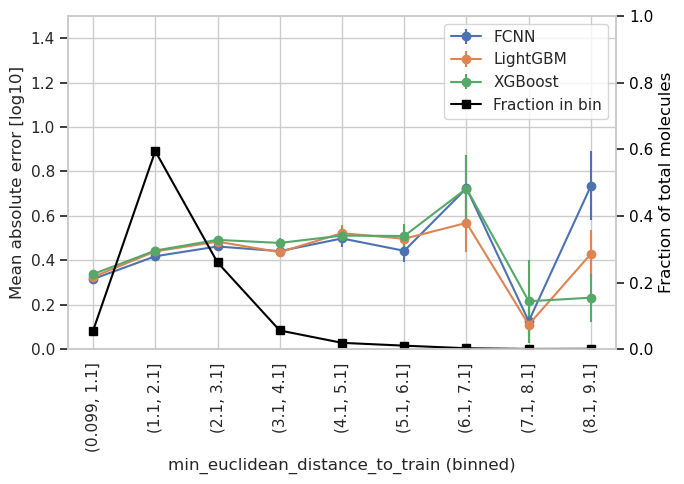

bbb-biogen butina


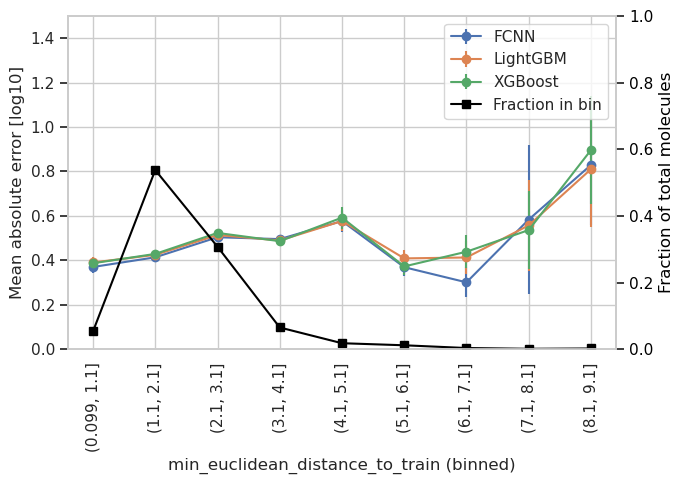

bbb-biogen scaffold


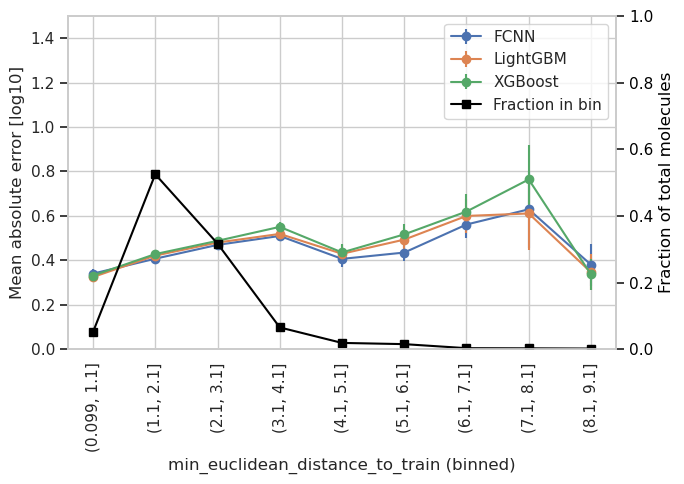

In [41]:
source = "ER_lgfe"

for system in ["popc_chol-biogen", "pampa-biogen", "bbb-biogen"]:
    
    for split in ["butina", "scaffold"]:

        print (system, split)

        nn_similarity_csvs = [f"nn_similarity_summaries/{system}/{system}_{split}.csv",
                              f"nn_similarity_summaries/{system}/{system}_{split}.csv",
                              f"nn_similarity_summaries/{system}/{system}_{split}.csv"]
                              
        results = plot_similarity_vs_error(model_folders=model_folders, model_list=model_list, split=split, source=source, system=system, nn_similarity_csvs=nn_similarity_csvs, what2bin="min_euclidean_distance_to_train")

        plot_binned_curves(results, metric="mean_abs_error", what2bin="min_euclidean_distance_to_train")

## What about explcit protomer profiles

In [11]:
prefix = "../data-processed/popc_chol-biogen/P_app/popc_chol-biogen-P_app-including-protomers_lgfe"
splits = ["random", "butina", "scaffold"]
folds = range(1, 6)

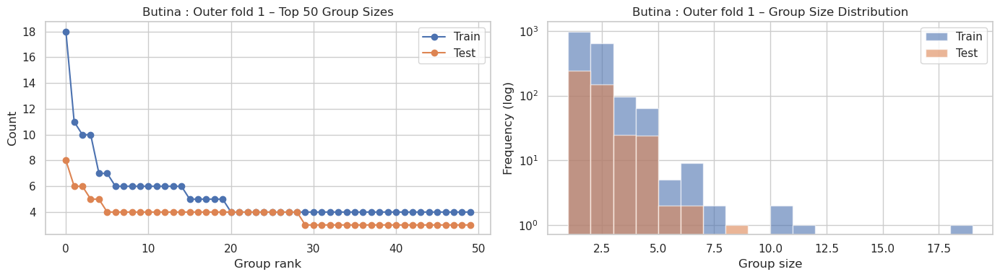

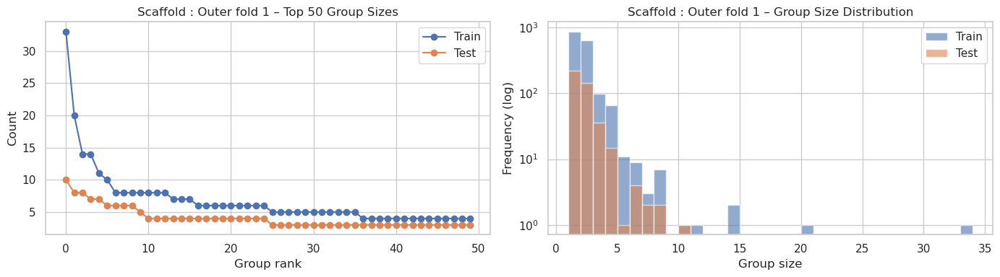

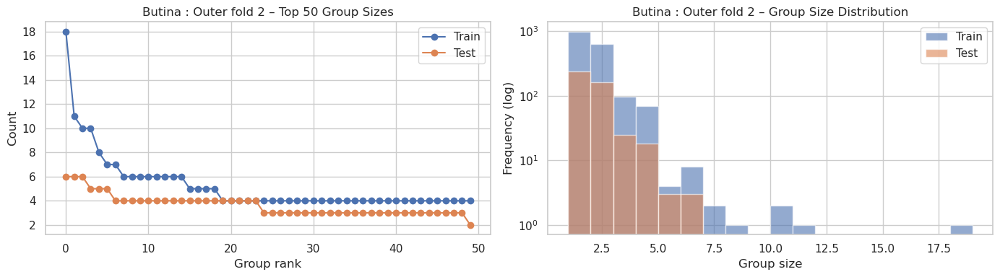

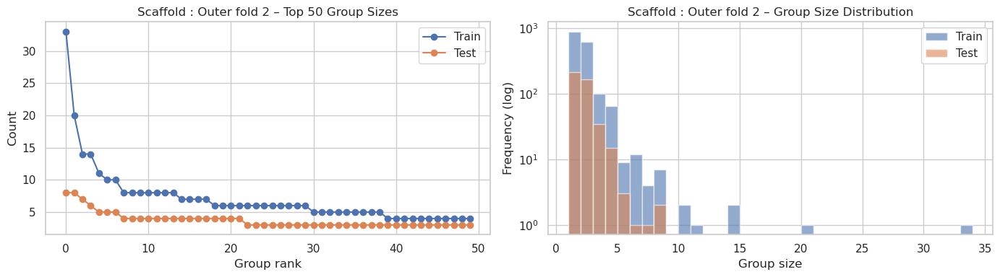

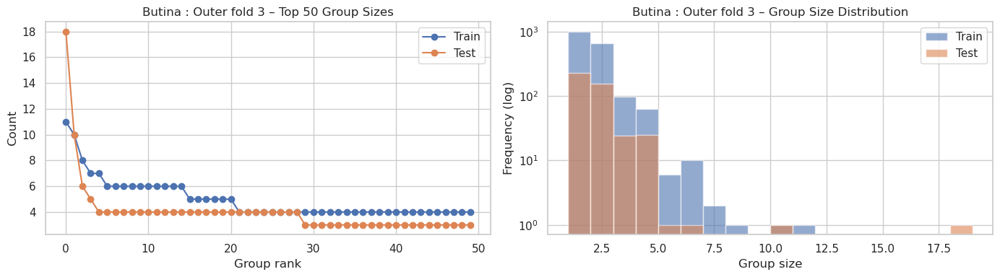

...

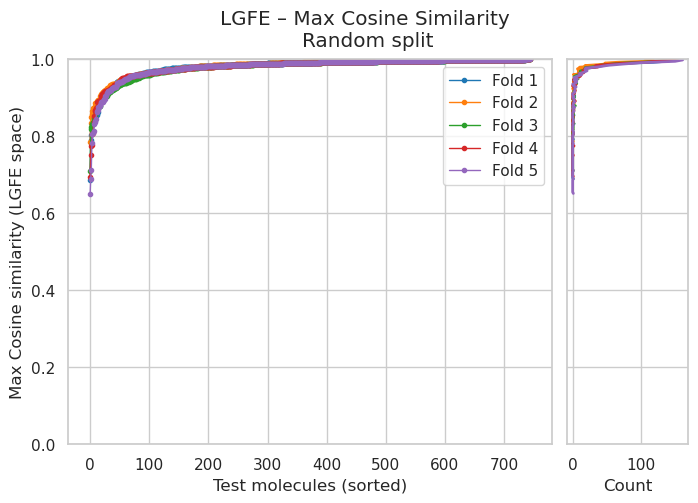

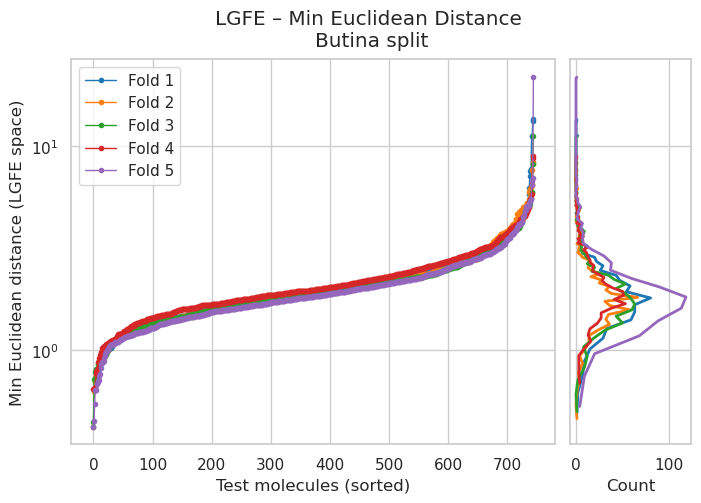

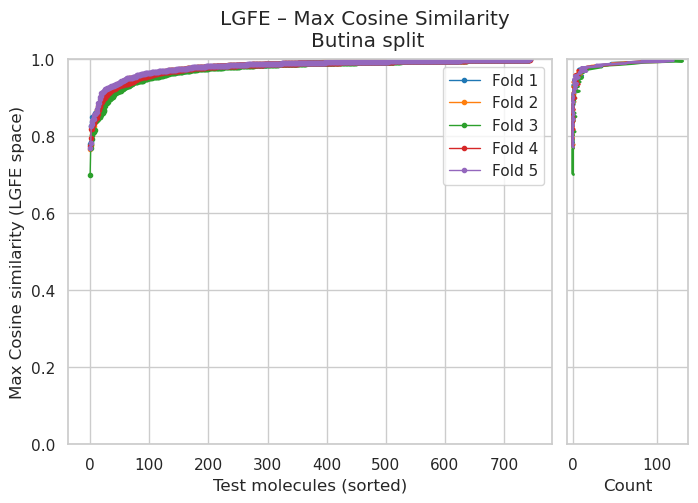

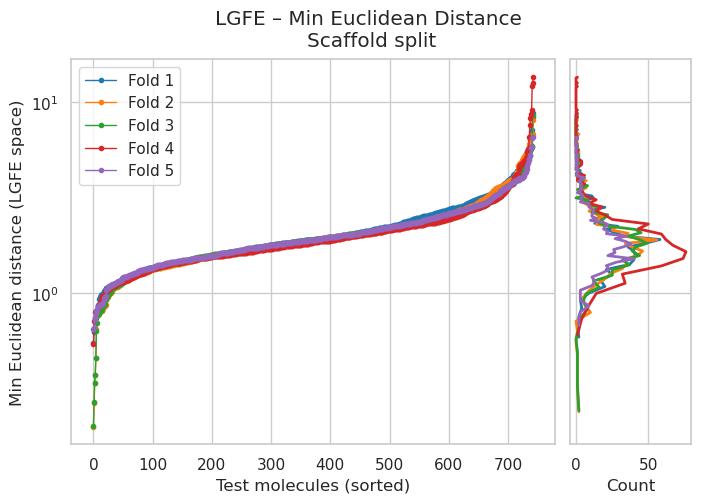

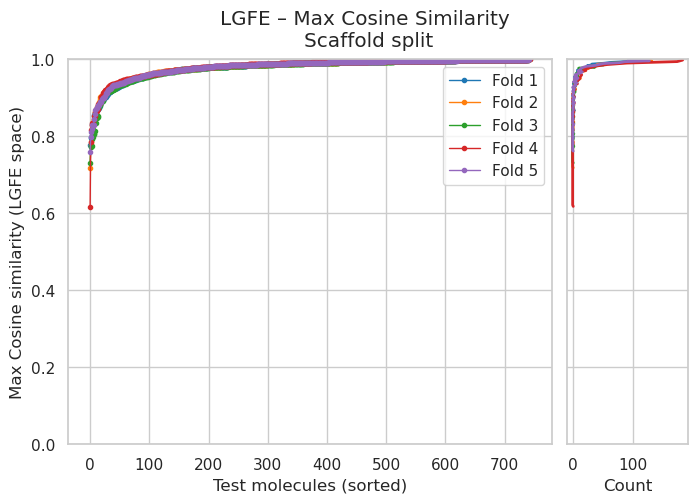

In [24]:
for fold in folds:
    train_b, test_b = load_fold(prefix, fold, "butina")
    plot_group_sizes(train_b, test_b, "Cluster_ID", f"Butina : Outer fold {fold}")

    train_s, test_s = load_fold(prefix, fold, "scaffold")
    plot_group_sizes(train_s, test_s, "Scaffold_ID", f"Scaffold : Outer fold {fold}")

for split in splits:
    plot_similarity_all_folds_by_split(
        prefix=prefix,
        split_type=split,
        folds=folds
    )

n_folds = 5

for split in ["random", "butina", "scaffold"]:
    euclid_folds, cosine_folds = collect_folds(prefix, split, n_folds)

    plot_lgfe_with_side_count_line(euclid_folds, split_name=split.capitalize(), mode='euclid')
    plot_lgfe_with_side_count_line(cosine_folds, split_name=split.capitalize(), mode='cosine')

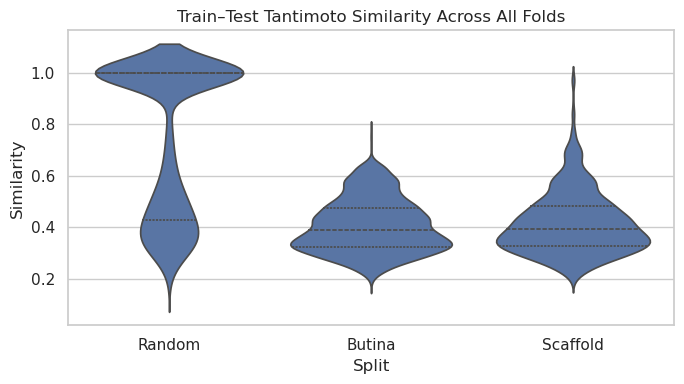

In [25]:
data = {
    "Random": collect_all_folds(prefix, "random", folds),
    "Butina": collect_all_folds(prefix, "butina", folds),
    "Scaffold": collect_all_folds(prefix, "scaffold", folds),
}

df = pd.DataFrame([
    (k, v) for k, sims in data.items() for v in sims
], columns=["Split", "Similarity"])

plt.figure(figsize=(7, 4))
sns.violinplot(data=df, x="Split", y="Similarity", inner="quartile")
plt.title("Train–Test Tantimoto Similarity Across All Folds")
plt.tight_layout()
plt.show()


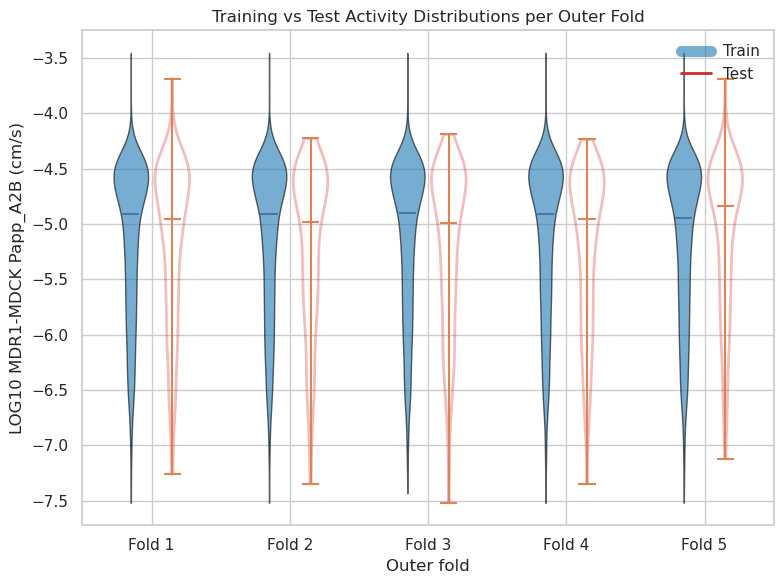

In [26]:
plot_outer_fold_activity_distributions(
    prefix=prefix,
    split_type="random",   # or scaffold / butina
    n_folds=5
)

#### Efflux Ratio Distribution

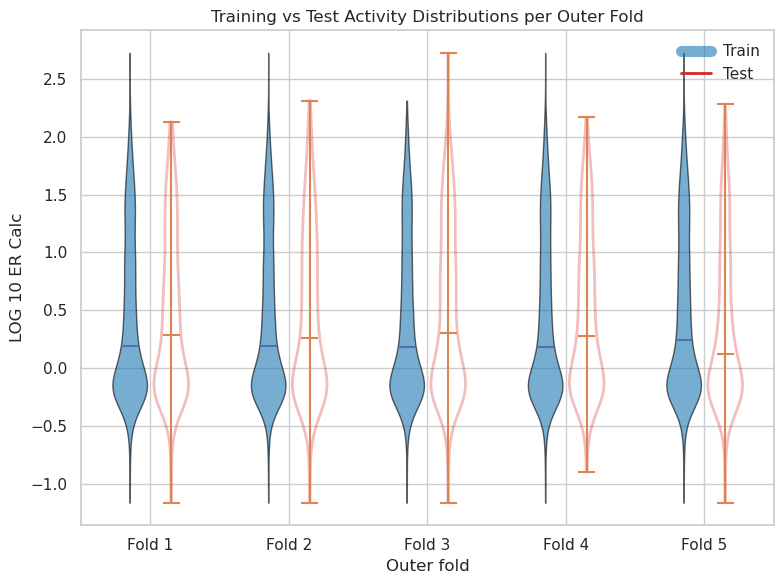

In [27]:
plot_outer_fold_activity_distributions(
    prefix="../data-processed/popc_chol-biogen/ER/popc_chol-biogen-ER-including-protomers_lgfe",
    split_type="random",   # or scaffold / butina
    n_folds=5,
    activity_col="LOG 10 ER Calc"
)

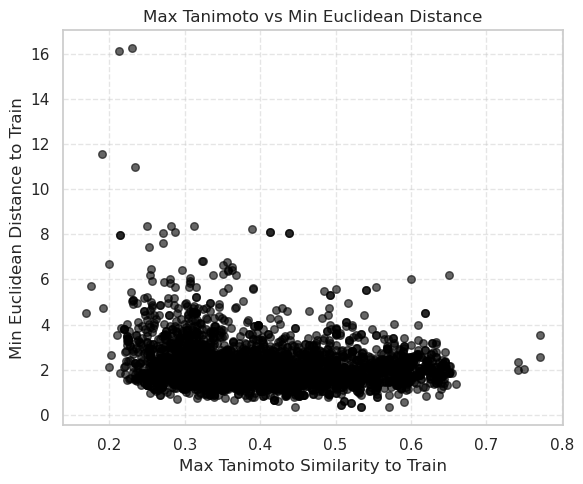

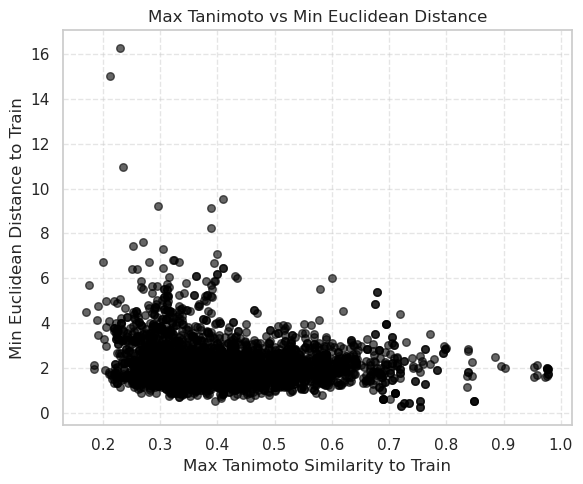

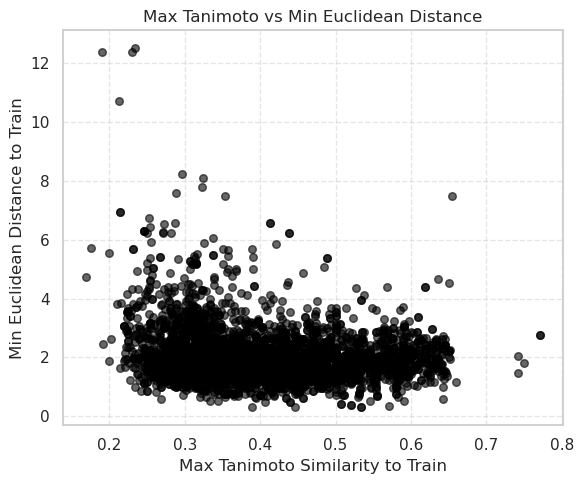

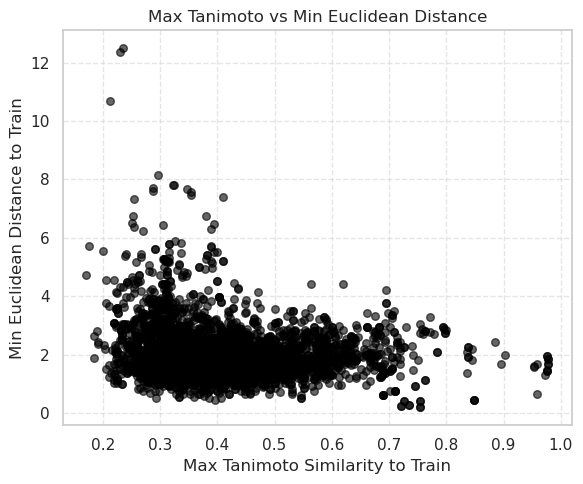

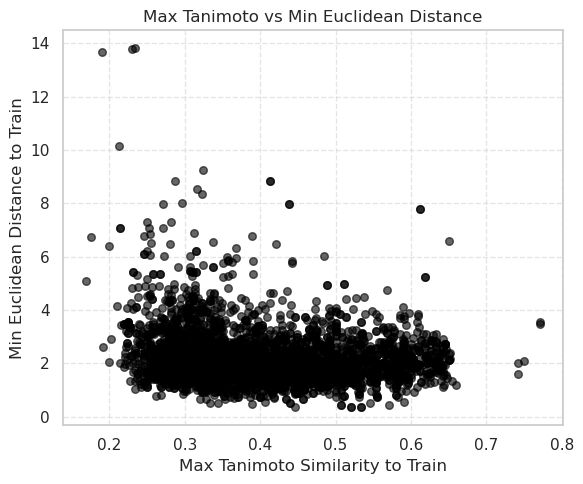

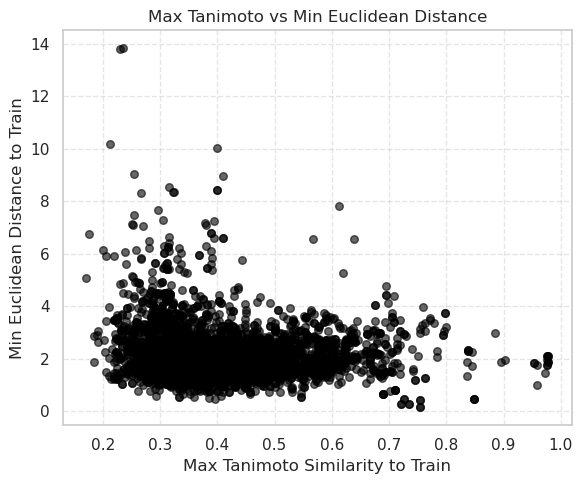

In [66]:
os.makedirs("nn_similarity_summaries", exist_ok=True)
for system in ["popc_chol-biogen", "pampa-biogen", "bbb-biogen"]:
    os.makedirs(f"nn_similarity_summaries/{system}", exist_ok=True)
    for split in ["butina", "scaffold"]:
        df = summarize_test_nn_similarity(
            prefix=f"../data-processed/{system}/P_app/{system}-P_app-including-protomers_lgfe",
            split_type=split,
            folds=folds,
            output_csv=f"nn_similarity_summaries/{system}/{system}_{split}_including-protomers.csv",
            independent_test_file=None,
            smiles_col="SMILES"
        )
        plot_similarity_vs_distance(df)


In [19]:
model_folders = ["../ml-modeling-P_app_lgfe_biogen_extended_with_protomers/evaluation/FCNN-1/error", 
                 "../ml-modeling-P_app_lgfe_biogen_extended_with_protomers/evaluation/LightGBM/error",
                 "../ml-modeling-P_app_lgfe_biogen_extended_with_protomers/evaluation/XGBoost/error"]
model_list = ["FCNN", "LightGBM", "XGBoost"]

        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 0.2]     24        0.461642  0.576412       0.071972
1    (0.2, 0.3]   4428        0.482800  0.749780       0.008622
2    (0.3, 0.4]  10268        0.473143  0.612821       0.003844
3    (0.4, 0.5]   7544        0.429879  0.558971       0.004114
4    (0.5, 0.6]   3640        0.419595  0.541696       0.005679
5    (0.6, 0.7]   1004        0.515196  0.613786       0.010534
6    (0.7, 0.8]     20        0.930697  1.130221       0.147113
        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 0.2]     24        0.308208  0.350307       0.034718
1    (0.2, 0.3]   4428        0.469492  0.597979       0.005566
2    (0.3, 0.4]  10268        0.477126  0.613599       0.003808
3    (0.4, 0.5]   7544        0.428351  0.557775       0.004113
4    (0.5, 0.6]   3640        0.399576  0.519574       0.005505
5    (0.6, 0.7]   1004        0.482216  0.578751       0.010105
6    (0.7, 0.8]     20        0.983930  

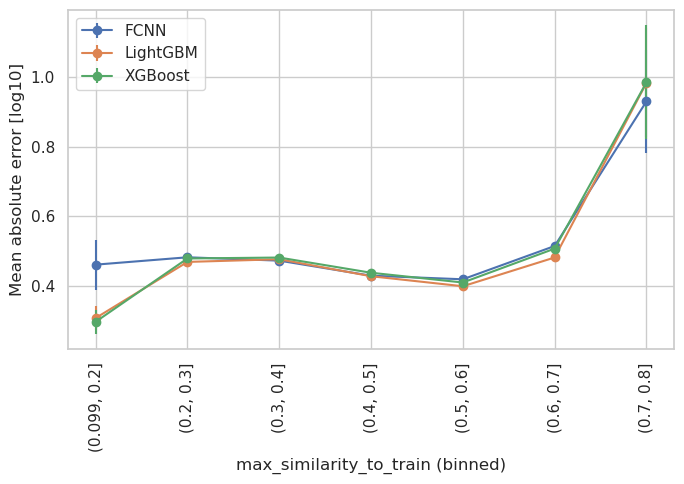

        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 0.2]     56        0.344420  0.396908       0.026598
1    (0.2, 0.3]   4144        0.475252  0.587136       0.005356
2    (0.3, 0.4]  10256        0.440269  0.983692       0.008687
3    (0.4, 0.5]   7232        0.417864  0.554107       0.004279
4    (0.5, 0.6]   3208        0.494768  0.616213       0.006486
5    (0.6, 0.7]   1380        0.510257  0.664005       0.011442
6    (0.7, 0.8]    456        0.502737  0.642070       0.018724
7    (0.8, 0.9]     92        0.411045  0.529904       0.035057
8    (0.9, 1.0]    100        0.445180  0.514809       0.025984
        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 0.2]     56        0.275139  0.330331       0.024649
1    (0.2, 0.3]   4144        0.488122  0.601351       0.005457
2    (0.3, 0.4]  10256        0.438316  0.567596       0.003561
3    (0.4, 0.5]   7232        0.421166  0.553241       0.004219
4    (0.5, 0.6]   3208        0.480013  

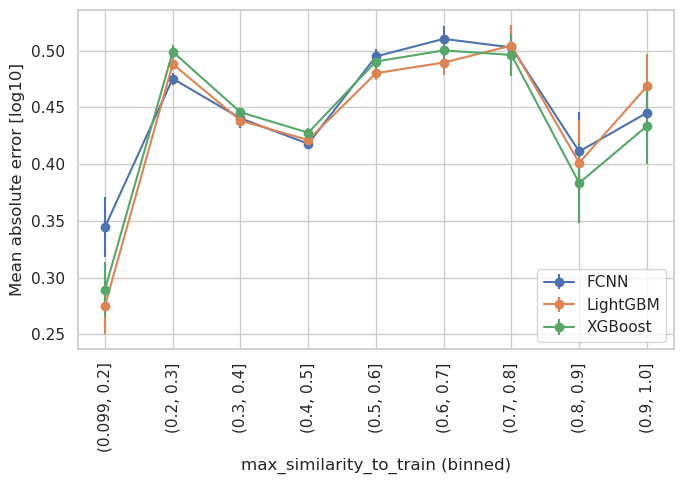

        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 0.2]     24        0.461642  0.576412       0.071972
1    (0.2, 0.3]   4428        0.482800  0.749780       0.008622
2    (0.3, 0.4]  10268        0.473143  0.612821       0.003844
3    (0.4, 0.5]   7544        0.429879  0.558971       0.004114
4    (0.5, 0.6]   3640        0.419595  0.541696       0.005679
5    (0.6, 0.7]   1004        0.515196  0.613786       0.010534
6    (0.7, 0.8]     20        0.930697  1.130221       0.147113
        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 0.2]     24        0.308208  0.350307       0.034718
1    (0.2, 0.3]   4428        0.469492  0.597979       0.005566
2    (0.3, 0.4]  10268        0.477126  0.613599       0.003808
3    (0.4, 0.5]   7544        0.428351  0.557775       0.004113
4    (0.5, 0.6]   3640        0.399576  0.519574       0.005505
5    (0.6, 0.7]   1004        0.482216  0.578751       0.010105
6    (0.7, 0.8]     20        0.983930  

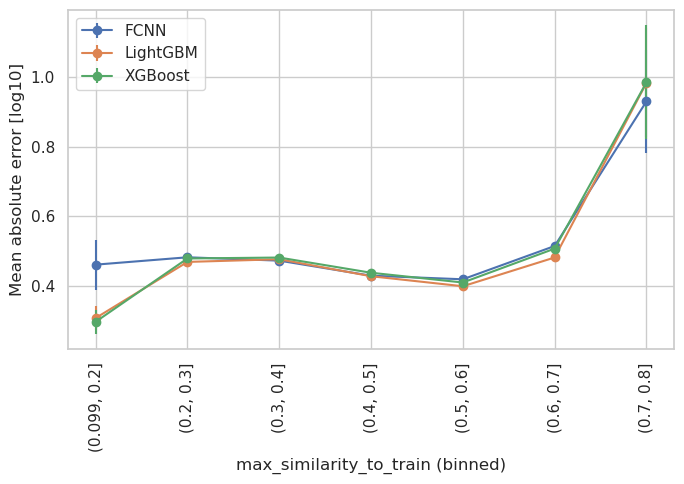

        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 0.2]     56        0.344420  0.396908       0.026598
1    (0.2, 0.3]   4144        0.475252  0.587136       0.005356
2    (0.3, 0.4]  10256        0.440269  0.983692       0.008687
3    (0.4, 0.5]   7232        0.417864  0.554107       0.004279
4    (0.5, 0.6]   3208        0.494768  0.616213       0.006486
5    (0.6, 0.7]   1380        0.510257  0.664005       0.011442
6    (0.7, 0.8]    456        0.502737  0.642070       0.018724
7    (0.8, 0.9]     92        0.411045  0.529904       0.035057
8    (0.9, 1.0]    100        0.445180  0.514809       0.025984
        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 0.2]     56        0.275139  0.330331       0.024649
1    (0.2, 0.3]   4144        0.488122  0.601351       0.005457
2    (0.3, 0.4]  10256        0.438316  0.567596       0.003561
3    (0.4, 0.5]   7232        0.421166  0.553241       0.004219
4    (0.5, 0.6]   3208        0.480013  

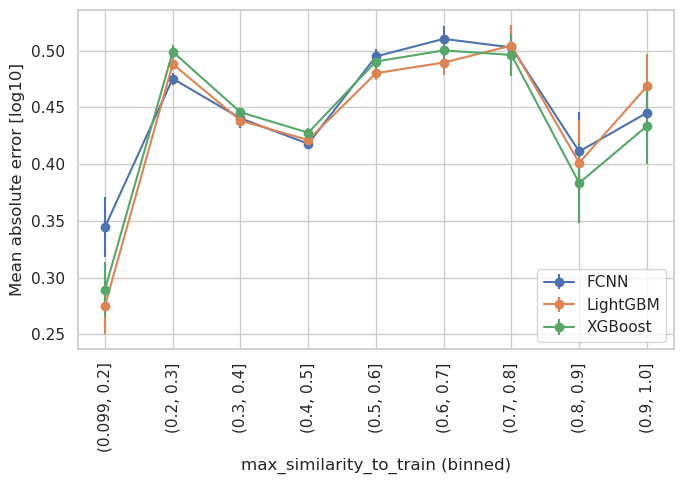

        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 0.2]     24        0.461642  0.576412       0.071972
1    (0.2, 0.3]   4428        0.482800  0.749780       0.008622
2    (0.3, 0.4]  10268        0.473143  0.612821       0.003844
3    (0.4, 0.5]   7544        0.429879  0.558971       0.004114
4    (0.5, 0.6]   3640        0.419595  0.541696       0.005679
5    (0.6, 0.7]   1004        0.515196  0.613786       0.010534
6    (0.7, 0.8]     20        0.930697  1.130221       0.147113
        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 0.2]     24        0.308208  0.350307       0.034718
1    (0.2, 0.3]   4428        0.469492  0.597979       0.005566
2    (0.3, 0.4]  10268        0.477126  0.613599       0.003808
3    (0.4, 0.5]   7544        0.428351  0.557775       0.004113
4    (0.5, 0.6]   3640        0.399576  0.519574       0.005505
5    (0.6, 0.7]   1004        0.482216  0.578751       0.010105
6    (0.7, 0.8]     20        0.983930  

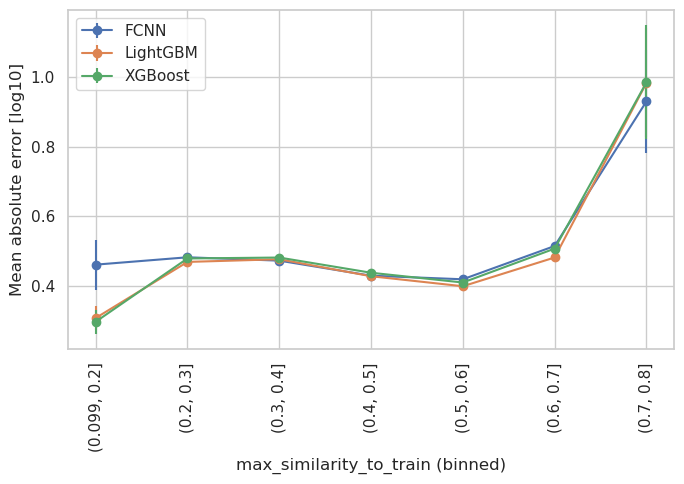

        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 0.2]     56        0.344420  0.396908       0.026598
1    (0.2, 0.3]   4144        0.475252  0.587136       0.005356
2    (0.3, 0.4]  10256        0.440269  0.983692       0.008687
3    (0.4, 0.5]   7232        0.417864  0.554107       0.004279
4    (0.5, 0.6]   3208        0.494768  0.616213       0.006486
5    (0.6, 0.7]   1380        0.510257  0.664005       0.011442
6    (0.7, 0.8]    456        0.502737  0.642070       0.018724
7    (0.8, 0.9]     92        0.411045  0.529904       0.035057
8    (0.9, 1.0]    100        0.445180  0.514809       0.025984
        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 0.2]     56        0.275139  0.330331       0.024649
1    (0.2, 0.3]   4144        0.488122  0.601351       0.005457
2    (0.3, 0.4]  10256        0.438316  0.567596       0.003561
3    (0.4, 0.5]   7232        0.421166  0.553241       0.004219
4    (0.5, 0.6]   3208        0.480013  

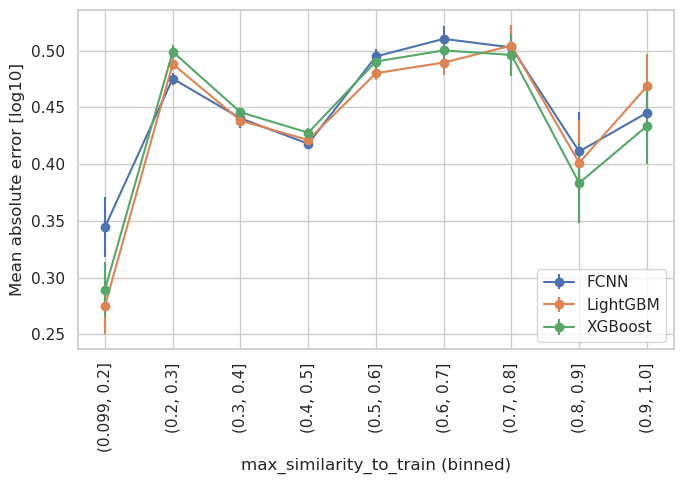

In [52]:
source = "P_app-including-protomers_lgfe"

for system in ["popc_chol-biogen", "pampa-biogen", "bbb-biogen"]:
    
    for split in ["butina", "scaffold"]:

        nn_similarity_csvs = [f"nn_similarity_summaries/{system}/{system}_{split}_including-protomers.csv",
                              f"nn_similarity_summaries/{system}/{system}_{split}_including-protomers.csv",
                              f"nn_similarity_summaries/{system}/{system}_{split}_including-protomers.csv"]
                              
        results = plot_similarity_vs_error(model_folders=model_folders, model_list=model_list, split=split, source=source, nn_similarity_csvs=nn_similarity_csvs, what2bin="max_similarity_to_train")

        plot_binned_curves(results, metric="mean_abs_error", what2bin="max_similarity_to_train")

        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 1.1]    956        0.318398  0.475273       0.011418
1    (1.1, 2.1]  15680        0.430261  0.607416       0.003424
2    (2.1, 3.1]   7460        0.506511  0.626534       0.004270
3    (3.1, 4.1]   1840        0.464644  0.601929       0.008923
4    (4.1, 5.1]    556        0.606547  0.748535       0.018619
5    (5.1, 6.1]    216        0.667156  0.751183       0.023544
6    (6.1, 7.1]     84        0.380258  0.500372       0.035699
7    (7.1, 8.1]     60        0.845576  0.972045       0.062419
8    (8.1, 9.1]     60        0.929655  1.056476       0.065339
        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 1.1]    956        0.317946  0.473908       0.011372
1    (1.1, 2.1]  15680        0.429203  0.559476       0.002866
2    (2.1, 3.1]   7460        0.493422  0.614492       0.004241
3    (3.1, 4.1]   1840        0.468203  0.605604       0.008957
4    (4.1, 5.1]    556        0.605088  

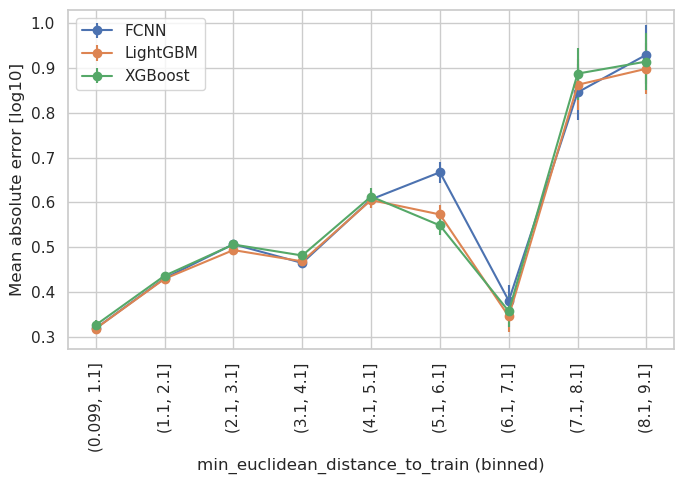

        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 1.1]    920        0.298838  0.392701       0.008404
1    (1.1, 2.1]  14948        0.409350  0.535459       0.002823
2    (2.1, 3.1]   7996        0.513503  0.644786       0.004361
3    (3.1, 4.1]   2000        0.451462  0.582983       0.008250
4    (4.1, 5.1]    600        0.693436  3.402763       0.136116
5    (5.1, 6.1]    268        0.650986  0.733073       0.020628
6    (6.1, 7.1]    136        0.638061  0.726010       0.029810
7    (7.1, 8.1]     12        0.384976  0.431447       0.058729
8    (8.1, 9.1]      8        1.125540  1.152221       0.093175
        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 1.1]    920        0.290200  0.388868       0.008539
1    (1.1, 2.1]  14948        0.415695  0.542210       0.002847
2    (2.1, 3.1]   7996        0.504701  0.631438       0.004244
3    (3.1, 4.1]   2000        0.459116  0.589905       0.008285
4    (4.1, 5.1]    600        0.597009  

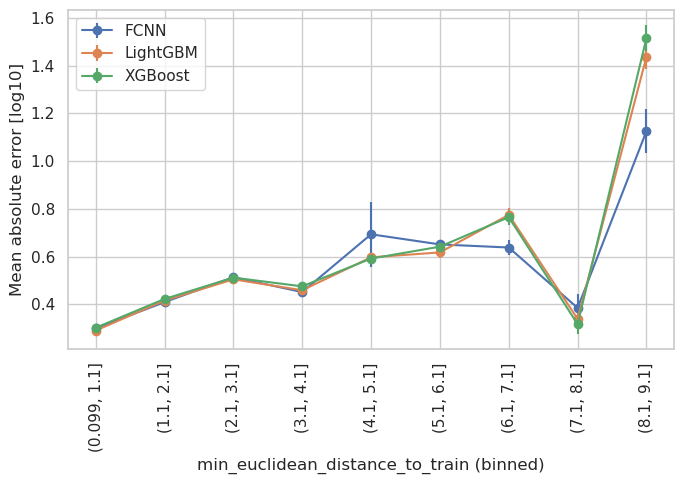

        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 1.1]   1712        0.313177  0.430558       0.007143
1    (1.1, 2.1]  16052        0.436547  0.565255       0.002834
2    (2.1, 3.1]   6676        0.498170  0.626021       0.004640
3    (3.1, 4.1]   1664        0.558223  0.699595       0.010341
4    (4.1, 5.1]    364        0.532686  0.647263       0.019299
5    (5.1, 6.1]    236        0.489788  0.612528       0.023995
6    (6.1, 7.1]    160        0.842308  0.962705       0.036970
7    (7.1, 8.1]     36        0.740790  0.785598       0.044206
8    (8.1, 9.1]      8        0.477388  0.637201       0.159519
        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 1.1]   1712        0.314207  0.432742       0.007194
1    (1.1, 2.1]  16052        0.437477  0.566407       0.002840
2    (2.1, 3.1]   6676        0.485285  0.614440       0.004613
3    (3.1, 4.1]   1664        0.548393  0.685363       0.010080
4    (4.1, 5.1]    364        0.495272  

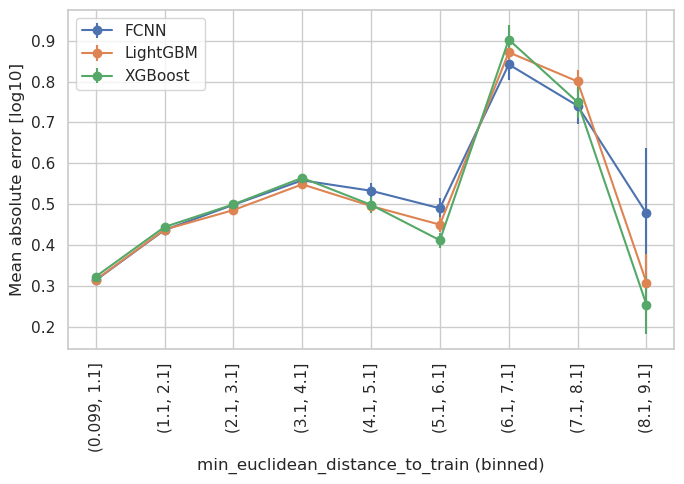

        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 1.1]   1700        0.306018  0.397356       0.006149
1    (1.1, 2.1]  15400        0.419559  0.548774       0.002851
2    (2.1, 3.1]   7352        0.519684  0.651093       0.004575
3    (3.1, 4.1]   1596        0.450901  0.564390       0.008499
4    (4.1, 5.1]    472        0.709690  3.818487       0.172881
5    (5.1, 6.1]    272        0.684842  0.768699       0.021208
6    (6.1, 7.1]     44        0.565382  0.695112       0.061668
7    (7.1, 8.1]     72        0.622880  0.692202       0.035833
8    (8.1, 9.1]      4        0.611346  0.675263       0.165566
        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 1.1]   1700        0.288882  0.381126       0.006031
1    (1.1, 2.1]  15400        0.425653  0.556486       0.002889
2    (2.1, 3.1]   7352        0.514984  0.638688       0.004406
3    (3.1, 4.1]   1596        0.444676  0.549606       0.008088
4    (4.1, 5.1]    472        0.574677  

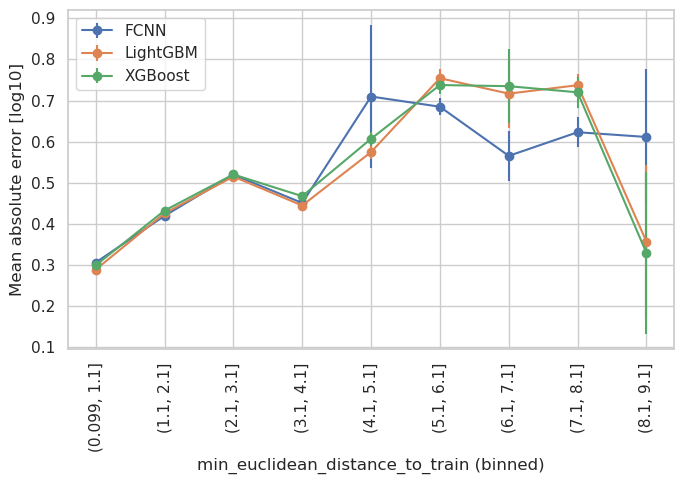

        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 1.1]   1232        0.315299  0.462129       0.009630
1    (1.1, 2.1]  14224        0.418655  0.594800       0.003543
2    (2.1, 3.1]   8104        0.515865  0.642466       0.004254
3    (3.1, 4.1]   2248        0.504134  0.646753       0.008547
4    (4.1, 5.1]    584        0.575879  0.729136       0.018522
5    (5.1, 6.1]    264        0.479237  0.605664       0.022837
6    (6.1, 7.1]    124        0.591713  0.707399       0.034955
7    (7.1, 8.1]     76        0.725615  0.877533       0.056985
8    (8.1, 9.1]     48        1.037225  1.121502       0.062216
        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 1.1]   1232        0.316181  0.463975       0.009678
1    (1.1, 2.1]  14224        0.422621  0.547563       0.002919
2    (2.1, 3.1]   8104        0.496661  0.625557       0.004225
3    (3.1, 4.1]   2248        0.495903  0.630337       0.008209
4    (4.1, 5.1]    584        0.575729  

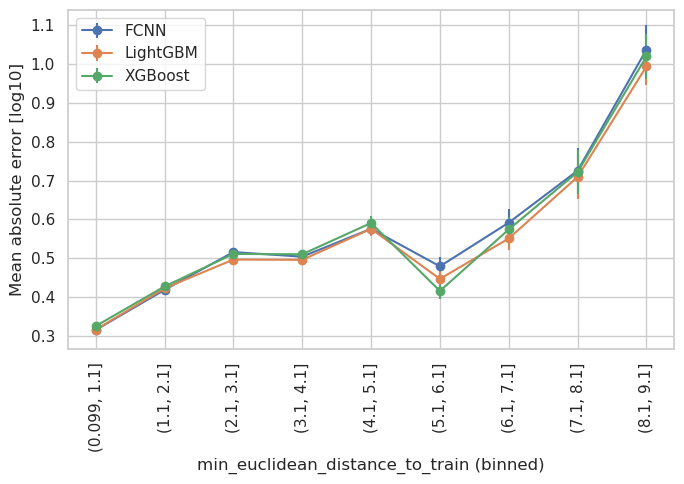

        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 1.1]   1320        0.277188  0.364010       0.006497
1    (1.1, 2.1]  13848        0.411209  0.540199       0.002977
2    (2.1, 3.1]   8276        0.519759  0.648223       0.004258
3    (3.1, 4.1]   2316        0.455209  0.573564       0.007252
4    (4.1, 5.1]    604        0.470926  0.602266       0.015289
5    (5.1, 6.1]    276        0.625616  0.704874       0.019582
6    (6.1, 7.1]    152        0.645312  0.772411       0.034544
7    (7.1, 8.1]     36        0.442851  0.555868       0.056788
8    (8.1, 9.1]     68        0.556920  0.663808       0.044130
        sim_bin      n  mean_abs_error      rmse  sem_abs_error
0  (0.099, 1.1]   1320        0.260611  0.352788       0.006547
1    (1.1, 2.1]  13848        0.417956  0.547655       0.003007
2    (2.1, 3.1]   8276        0.514430  0.637408       0.004137
3    (3.1, 4.1]   2316        0.454221  0.569750       0.007148
4    (4.1, 5.1]    604        0.490861  

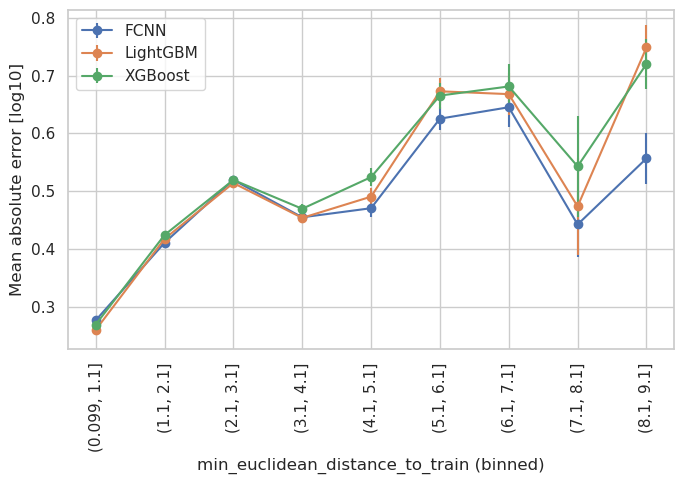

In [53]:
source = "P_app-including-protomers_lgfe"

for system in ["popc_chol-biogen", "pampa-biogen", "bbb-biogen"]:
    
    for split in ["butina", "scaffold"]:

        nn_similarity_csvs = [f"nn_similarity_summaries/{system}/{system}_{split}_including-protomers.csv",
                              f"nn_similarity_summaries/{system}/{system}_{split}_including-protomers.csv",
                              f"nn_similarity_summaries/{system}/{system}_{split}_including-protomers.csv"]
                              
        results = plot_similarity_vs_error(model_folders=model_folders, model_list=model_list, split=split, source=source, nn_similarity_csvs=nn_similarity_csvs, what2bin="min_euclidean_distance_to_train")
                      
        plot_binned_curves(results, metric="mean_abs_error", what2bin="min_euclidean_distance_to_train")

           sim_bin      n  mean_abs_error      rmse  sem_abs_error
0   (0.978, 0.979]      8        0.419944  0.519960       0.115885
1   (0.984, 0.985]     20        0.277070  0.331901       0.041921
2   (0.985, 0.986]      4        0.581070  0.675304       0.198657
3   (0.986, 0.987]      8        0.531168  0.577010       0.085190
4   (0.988, 0.989]      8        0.534573  0.644357       0.135977
5    (0.989, 0.99]      4        0.342566  0.347887       0.034995
6   (0.991, 0.992]     16        1.069929  1.106667       0.073013
7   (0.992, 0.993]     96        0.343103  0.366786       0.013303
8   (0.993, 0.994]    116        0.294095  0.370701       0.021044
9   (0.994, 0.995]    136        0.364835  0.466177       0.024977
10  (0.995, 0.996]    376        0.800771  0.987976       0.029882
11  (0.996, 0.997]    612        0.522933  0.656762       0.016075
12  (0.997, 0.998]   1860        0.444920  0.566411       0.008130
13  (0.998, 0.999]   9152        0.472935  0.605109       0.00

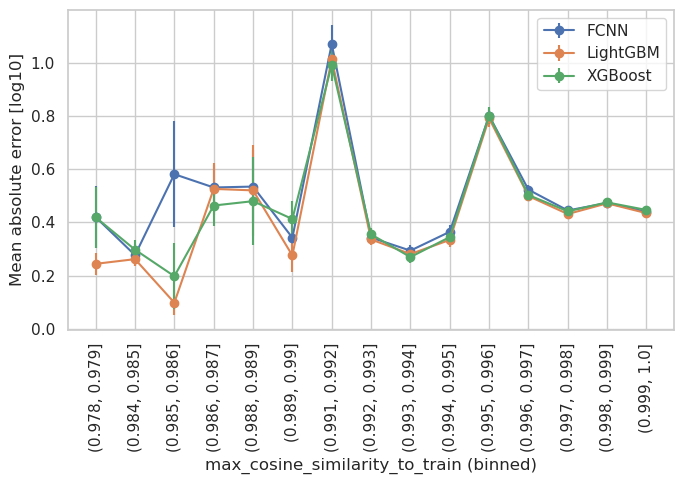

           sim_bin      n  mean_abs_error       rmse  sem_abs_error
0   (0.976, 0.977]      4        0.234092   0.255043       0.058447
1   (0.978, 0.979]      4        0.241421   0.282965       0.085216
2    (0.979, 0.98]      4        1.064047   1.086824       0.127789
3   (0.981, 0.982]      4        0.341965   0.396747       0.116144
4   (0.984, 0.985]     56        0.234286   0.290895       0.023250
5   (0.985, 0.986]      4        1.193629   1.245775       0.205916
6   (0.986, 0.987]     52        0.368799   0.400978       0.022038
7    (0.989, 0.99]      4        1.727513   1.732876       0.078645
8    (0.99, 0.991]     12        0.360527   0.403688       0.054759
9   (0.991, 0.992]     16        0.445045   0.561945       0.088588
10  (0.992, 0.993]     28        3.260335  15.452796       2.906947
11  (0.993, 0.994]     72        0.404855   0.500063       0.034835
12  (0.994, 0.995]    220        0.459730   0.579572       0.023848
13  (0.995, 0.996]    248        0.421821   0.59

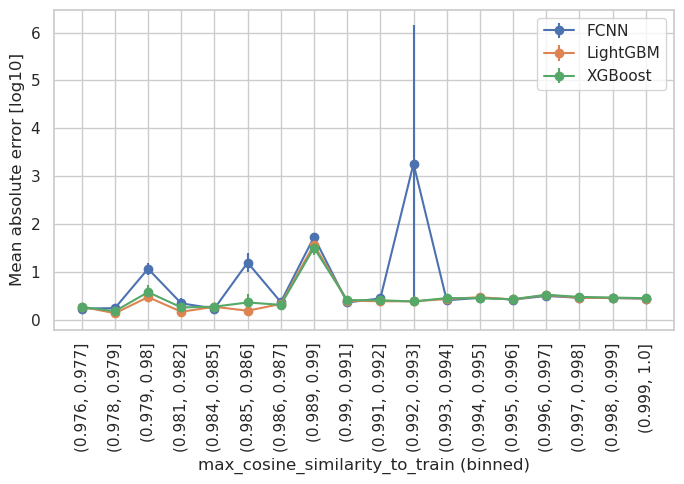

           sim_bin      n  mean_abs_error      rmse  sem_abs_error
0    (0.969, 0.97]     16        0.844268  0.853411       0.032169
1   (0.972, 0.973]      4        0.242676  0.256896       0.048661
2   (0.977, 0.978]      8        0.457266  0.537423       0.106725
3   (0.981, 0.982]      4        0.203208  0.264648       0.097886
4   (0.984, 0.985]      4        0.393731  0.437907       0.110662
5   (0.985, 0.986]      4        0.410274  0.452597       0.110332
6    (0.989, 0.99]      4        0.434814  0.470442       0.103686
7    (0.99, 0.991]     12        0.285463  0.323656       0.045989
8   (0.991, 0.992]     16        0.361510  0.455518       0.071558
9   (0.992, 0.993]      8        0.698560  0.720069       0.066024
10  (0.993, 0.994]     92        0.628583  0.761234       0.045011
11  (0.994, 0.995]     84        0.488984  0.709716       0.056461
12  (0.995, 0.996]    432        0.493994  0.657107       0.020872
13  (0.996, 0.997]    760        0.619203  0.782949       0.01

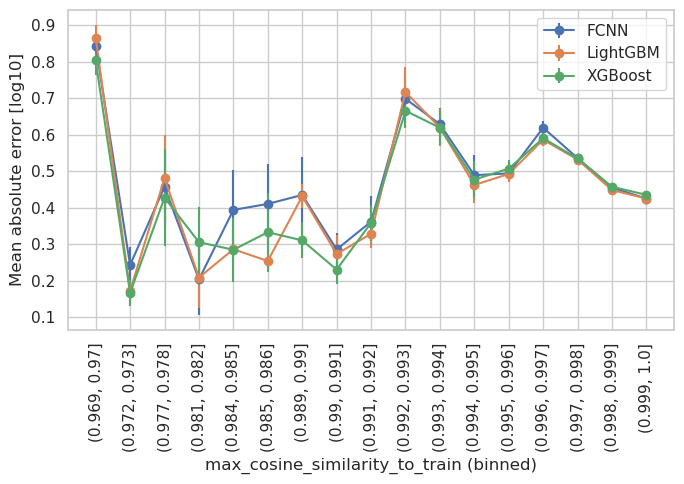

           sim_bin      n  mean_abs_error      rmse  sem_abs_error
0    (0.969, 0.97]     16        0.787733  0.800288       0.036458
1   (0.976, 0.977]      4        0.484795  0.498924       0.068067
2   (0.977, 0.978]     20        0.554081  0.609090       0.058031
3   (0.981, 0.982]      4        0.175663  0.198543       0.053422
4   (0.985, 0.986]      4        0.438503  0.449112       0.056027
5   (0.986, 0.987]      4        0.432566  0.470322       0.106597
6   (0.988, 0.989]      4        0.257013  0.264910       0.037065
7    (0.99, 0.991]     72        0.265881  0.300149       0.016529
8   (0.992, 0.993]     28        0.450733  0.510180       0.045996
9   (0.993, 0.994]    152        0.554398  0.634232       0.025069
10  (0.994, 0.995]    144        0.876084  6.824340       0.565958
11  (0.995, 0.996]    272        0.535818  0.675878       0.025025
12  (0.996, 0.997]    648        0.588574  0.753264       0.018481
13  (0.997, 0.998]   3096        0.500530  0.639301       0.00

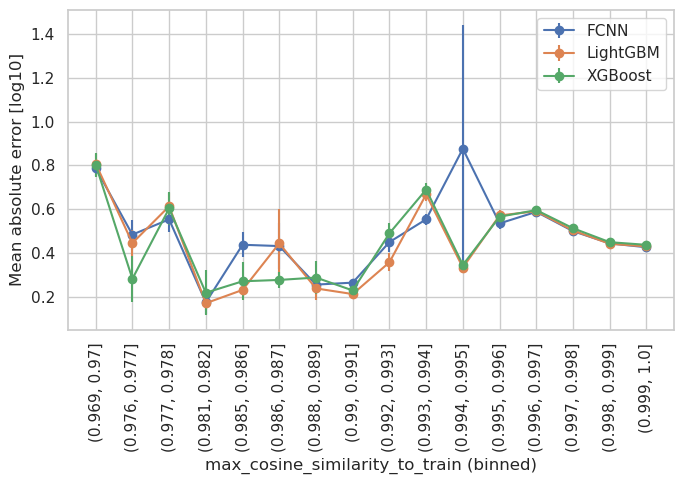

           sim_bin      n  mean_abs_error      rmse  sem_abs_error
0   (0.968, 0.969]      4        0.393731  0.437907       0.110662
1   (0.985, 0.986]     16        0.330485  0.356581       0.034573
2   (0.986, 0.987]      4        0.410274  0.452597       0.110332
3   (0.987, 0.988]      4        0.280933  0.284564       0.026161
4    (0.99, 0.991]     20        0.156344  0.199872       0.028567
5   (0.991, 0.992]     20        0.461778  0.484536       0.033667
6   (0.993, 0.994]     40        0.444407  0.526821       0.045303
7   (0.994, 0.995]     64        0.255036  0.315671       0.023437
8   (0.995, 0.996]    232        0.368249  0.460701       0.018214
9   (0.996, 0.997]    824        0.705876  0.886262       0.018681
10  (0.997, 0.998]   2008        0.492434  0.625003       0.008591
11  (0.998, 0.999]   9236        0.479283  0.609338       0.003915
12    (0.999, 1.0]  14456        0.427139  0.602372       0.003533
           sim_bin      n  mean_abs_error      rmse  sem_abs_e

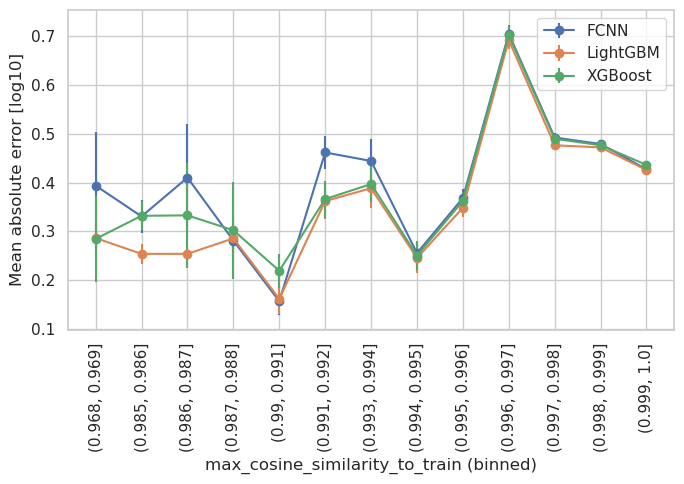

           sim_bin      n  mean_abs_error      rmse  sem_abs_error
0   (0.968, 0.969]      4        0.432566  0.470322       0.106597
1   (0.973, 0.974]      4        0.236317  0.313580       0.119005
2   (0.985, 0.986]      8        0.453068  0.463696       0.037309
3   (0.988, 0.989]     36        0.655905  0.740449       0.058077
4    (0.989, 0.99]     16        0.288139  0.318069       0.034780
5    (0.99, 0.991]      4        0.136697  0.154512       0.041586
6   (0.991, 0.992]     52        0.273501  0.311045       0.020744
7   (0.992, 0.993]      4        0.341033  0.418321       0.139868
8   (0.993, 0.994]     72        0.372527  0.481406       0.036187
9   (0.994, 0.995]     96        0.317432  0.400090       0.024986
10  (0.995, 0.996]    236        0.417441  0.534240       0.021749
11  (0.996, 0.997]    540        0.525855  0.662167       0.017333
12  (0.997, 0.998]   1808        0.499598  0.624941       0.008832
13  (0.998, 0.999]   9516        0.462983  0.600792       0.00

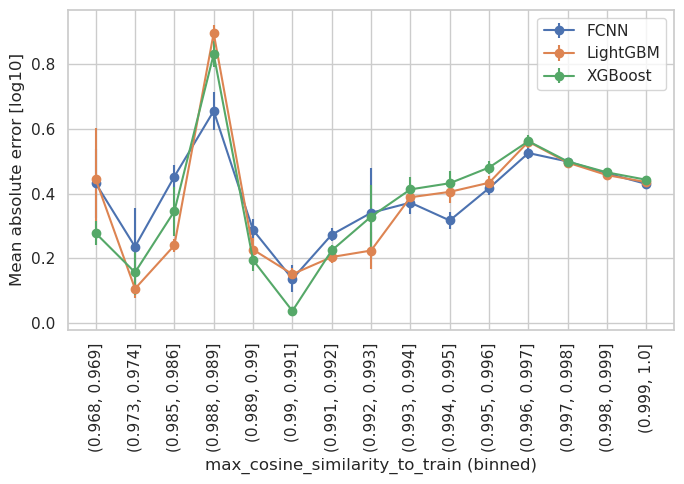

In [59]:
source = "P_app-including-protomers_lgfe"

for system in ["popc_chol-biogen", "pampa-biogen", "bbb-biogen"]:
    
    for split in ["butina", "scaffold"]:

        nn_similarity_csvs = [f"nn_similarity_summaries/{system}/{system}_{split}_including-protomers.csv",
                              f"nn_similarity_summaries/{system}/{system}_{split}_including-protomers.csv",
                              f"nn_similarity_summaries/{system}/{system}_{split}_including-protomers.csv"]
                              
        results = plot_similarity_vs_error(model_folders=model_folders, model_list=model_list, split=split, source=source, nn_similarity_csvs=nn_similarity_csvs, what2bin="max_cosine_similarity_to_train")
                      
        plot_binned_curves(results, metric="mean_abs_error", what2bin="max_cosine_similarity_to_train")

## Independent Data

### Small Molecules

popc-chol_P_app_including_protomers_lgfe-MDCK-Irvine.csv


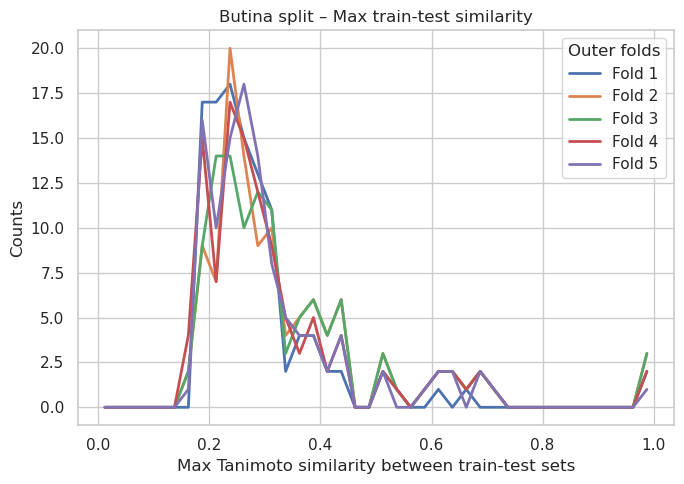

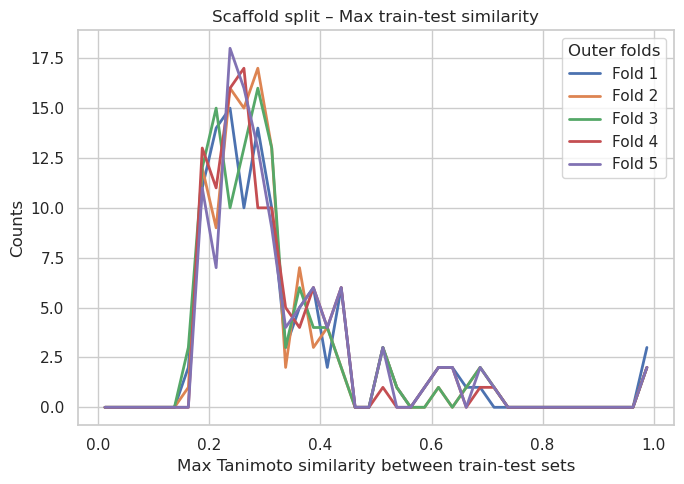

popc-chol_P_app_including_protomers_lgfe-MDCK-MDR1-Summerfield.csv


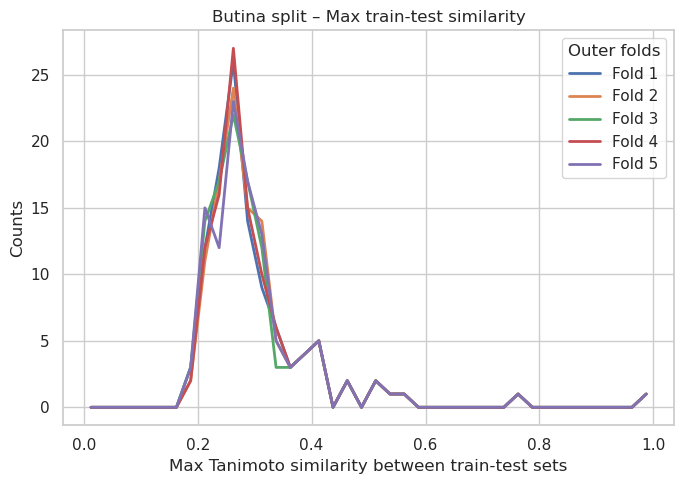

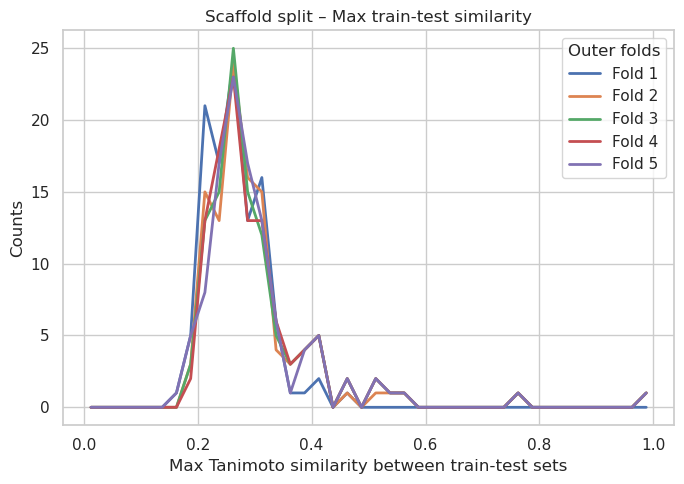

popc-chol_P_app_including_protomers_lgfe-MDCK-Hellinger.csv


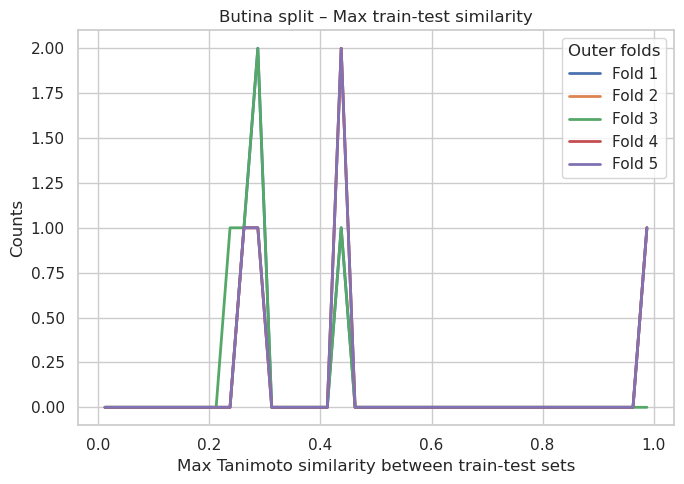

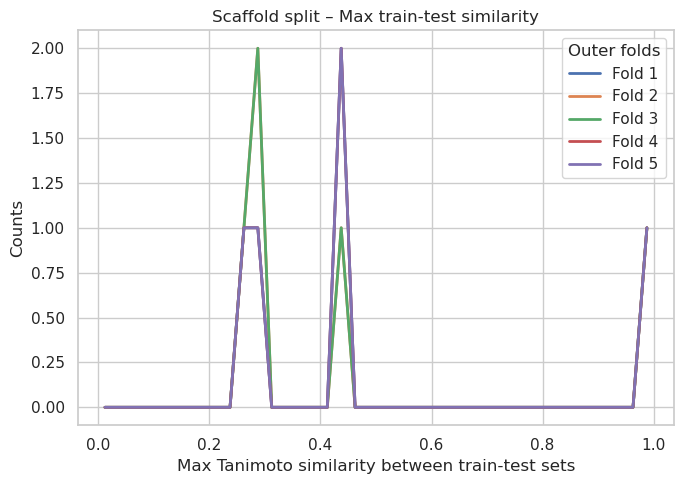

popc-chol_P_app_including_protomers_lgfe-cMdr1_KO_MDCK1-beran.csv


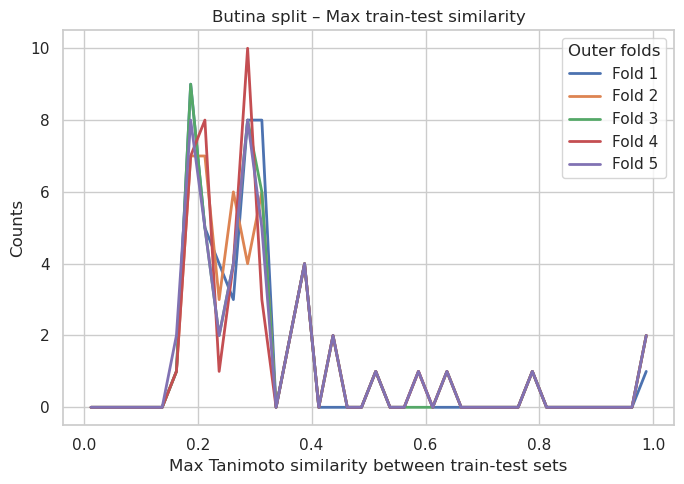

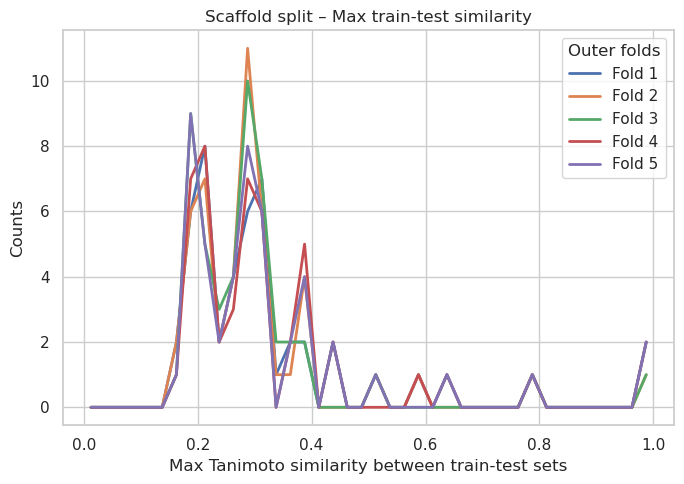

popc-chol_P_app_including_protomers_lgfe-MDCK-MDR1-Hellinger.csv


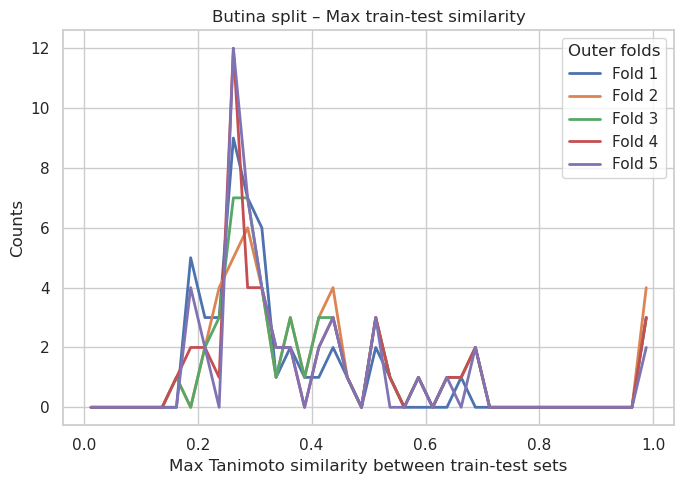

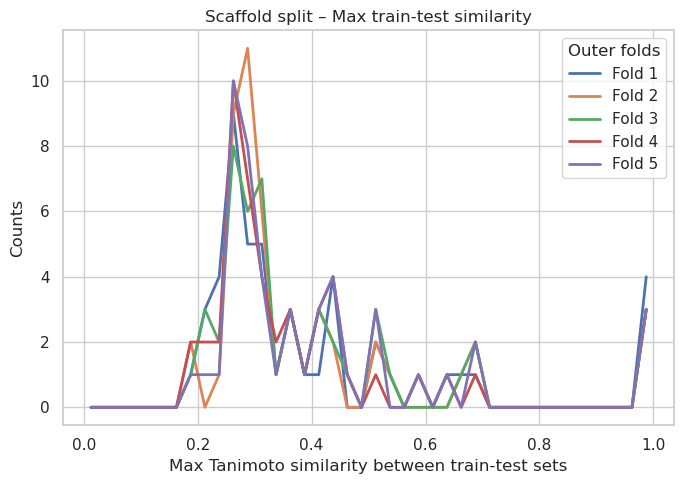

popc-chol_P_app_including_protomers_lgfe-MDCK-MDR1-QWang.csv


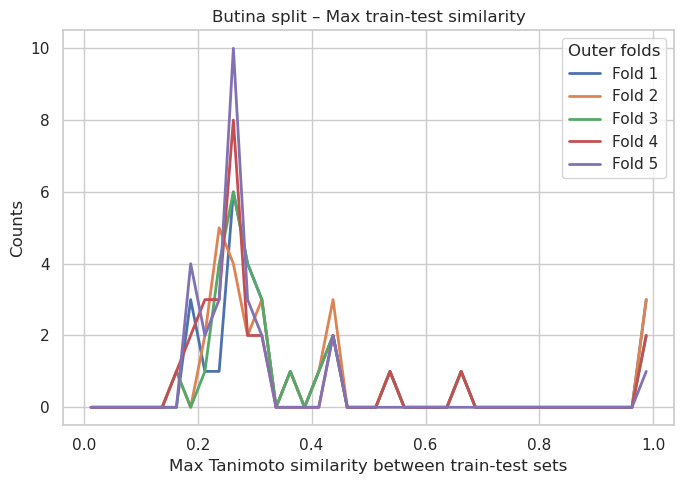

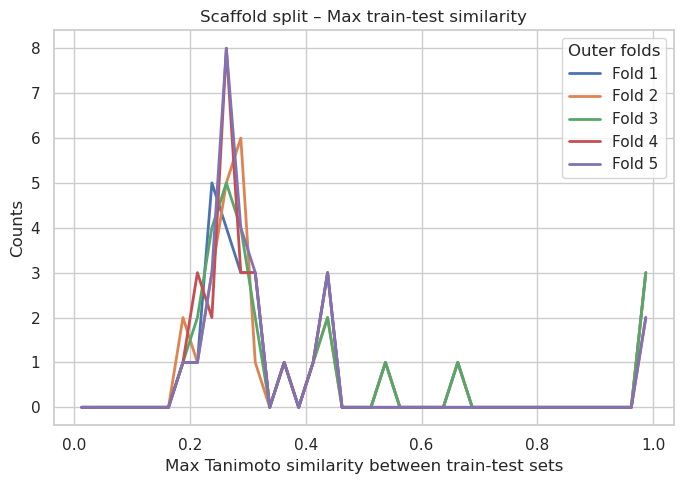

In [80]:
from pathlib import Path
for file in glob.glob("../data-processed/popc_chol-non-biogen/P_app/explicit_protomers/*.csv"):
    print (Path(file).name)
    for split in ["butina", "scaffold"]:
        plot_similarity_all_folds_by_split(
            prefix="../data-processed/popc_chol-biogen/P_app/popc_chol-biogen-P_app-including-protomers_lgfe",
            split_type=split,
            folds=folds,
            independent_test_file=file
        )

In [74]:
os.makedirs("nn_similarity_summaries", exist_ok=True)
for system in ["popc_chol", "pampa", "bbb"]:
    os.makedirs(f"nn_similarity_summaries/{system}-non-biogen", exist_ok=True)
    for source in ["cMdr1_KO_MDCK1-beran", "MDCK-Hellinger", "MDCK-Irvine", "MDCK-MDR1-Hellinger", "MDCK-MDR1-QWang", "MDCK-MDR1-Summerfield"]:
        os.makedirs(f"nn_similarity_summaries/{system}-non-biogen/{source}", exist_ok=True)
        file = glob.glob(f"../data-processed/{system}-non-biogen/P_app/explicit_protomers/*{source}*.csv")[0]
        for split in ["butina", "scaffold"]:
            df = summarize_test_nn_similarity(
                prefix=f"../data-processed/{system}-biogen/P_app/{system}-biogen-P_app-including-protomers_lgfe",
                split_type=split,
                folds=folds,
                output_csv=f"nn_similarity_summaries/{system}-non-biogen/{source}/{system}_{split}_including-protomers.csv",
                independent_test_file=file,
                smiles_col="SMILES"
            )
            # plot_similarity_vs_distance(df)

In [75]:
model_folders = ["../ml-modeling-P_app_lgfe_biogen_extended_with_protomers/evaluation/FCNN_independent_sm-1/error", 
                 "../ml-modeling-P_app_lgfe_biogen_extended_with_protomers/evaluation/LightGBM_independent_sm/error",
                 "../ml-modeling-P_app_lgfe_biogen_extended_with_protomers/evaluation/XGBoost_independent_sm/error"]
model_list = ["FCNN", "LightGBM", "XGBoost"]

popc_chol cMdr1_KO_MDCK1-beran butina


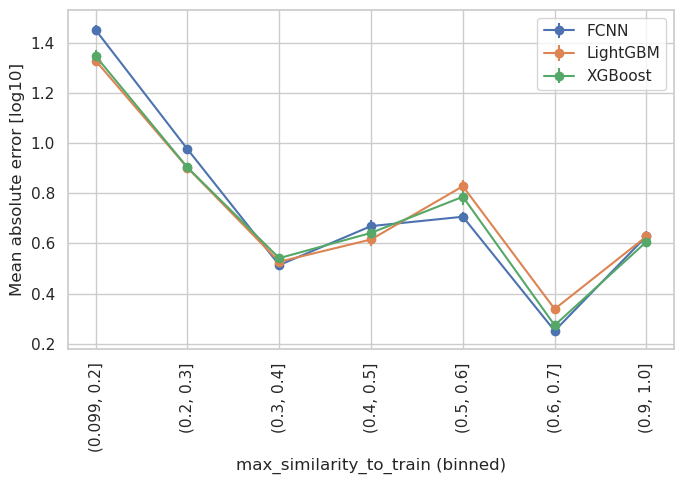

popc_chol cMdr1_KO_MDCK1-beran scaffold


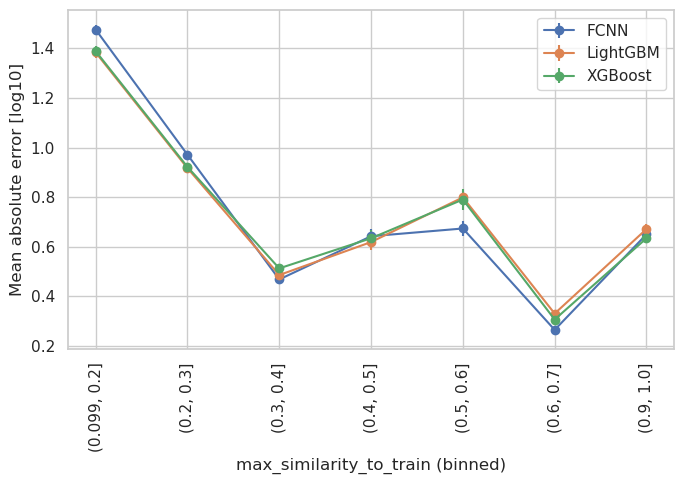

pampa cMdr1_KO_MDCK1-beran butina


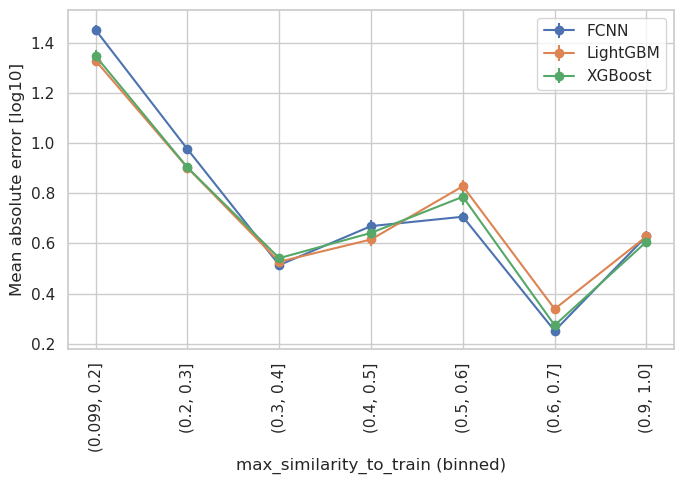

pampa cMdr1_KO_MDCK1-beran scaffold


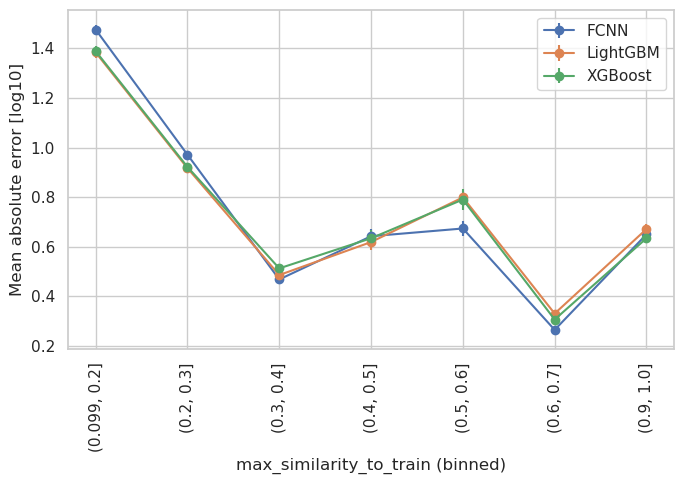

bbb cMdr1_KO_MDCK1-beran butina


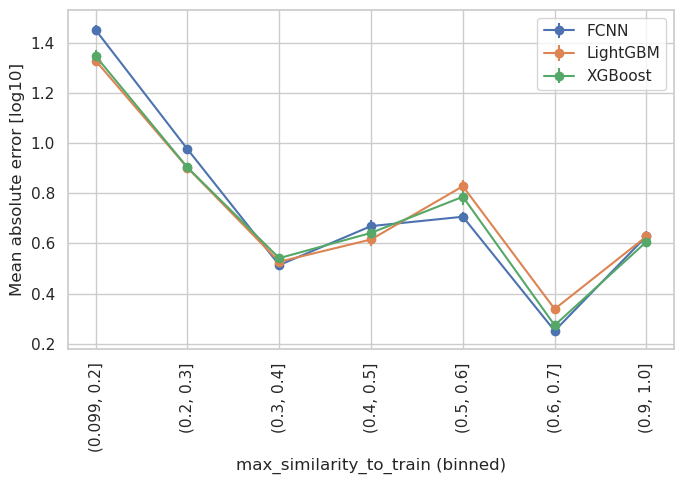

bbb cMdr1_KO_MDCK1-beran scaffold


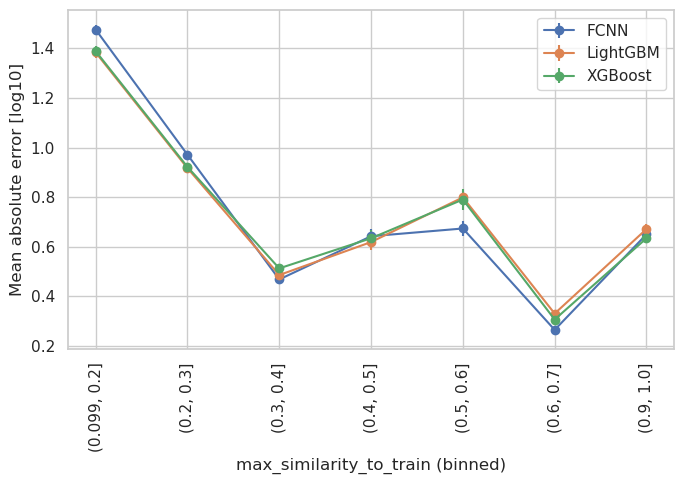

popc_chol MDCK-Hellinger butina


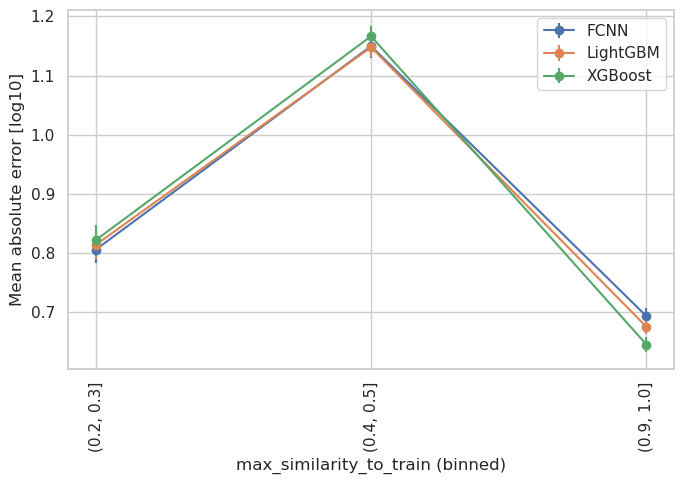

popc_chol MDCK-Hellinger scaffold


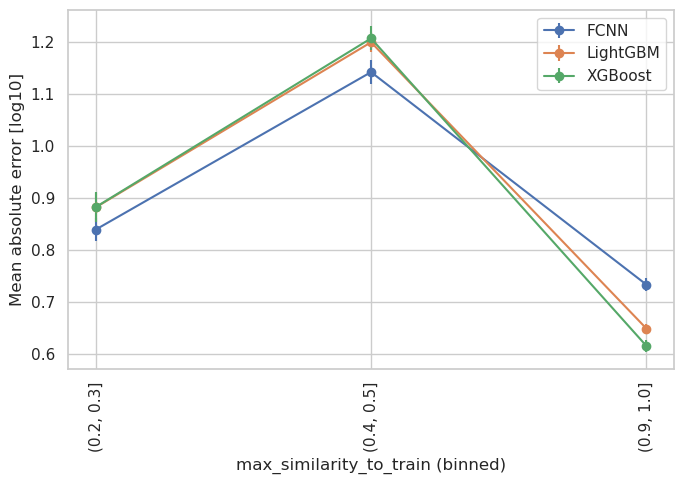

pampa MDCK-Hellinger butina


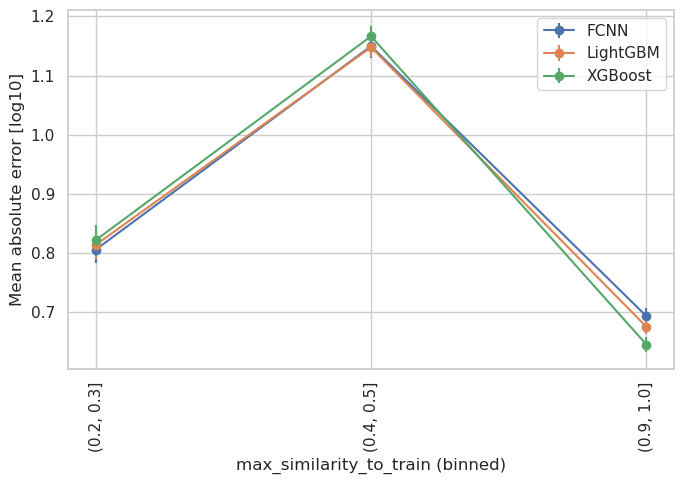

pampa MDCK-Hellinger scaffold


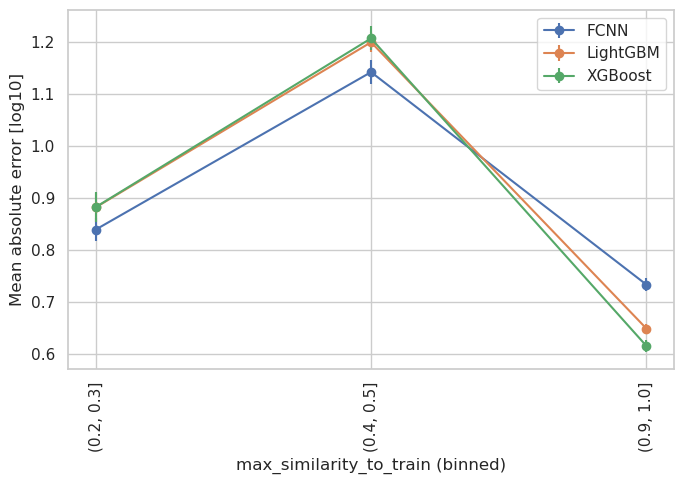

bbb MDCK-Hellinger butina


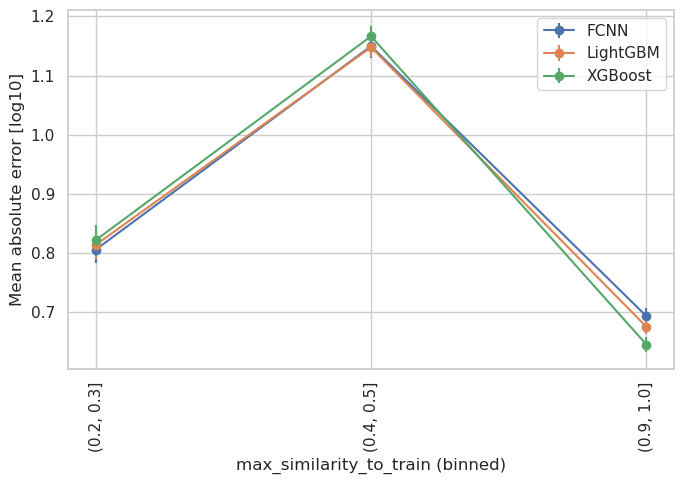

bbb MDCK-Hellinger scaffold


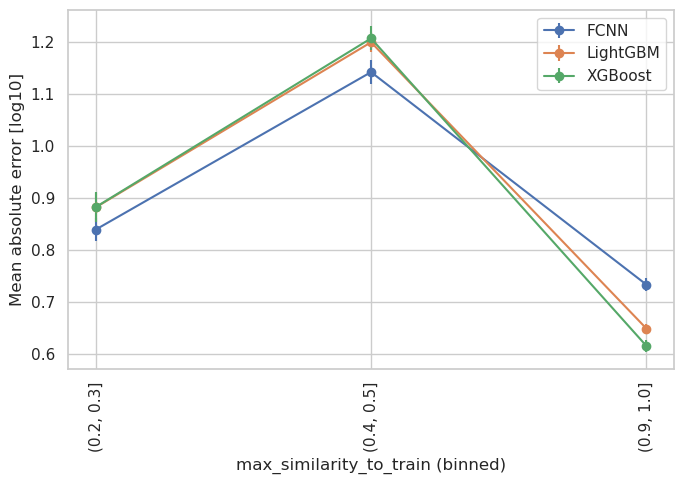

popc_chol MDCK-Irvine butina


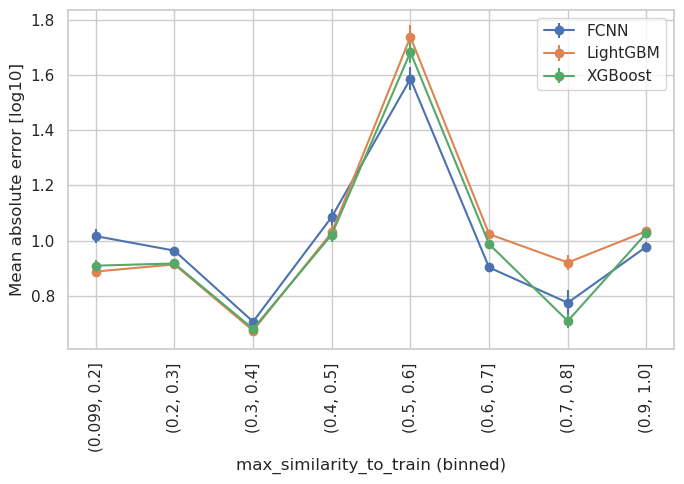

popc_chol MDCK-Irvine scaffold


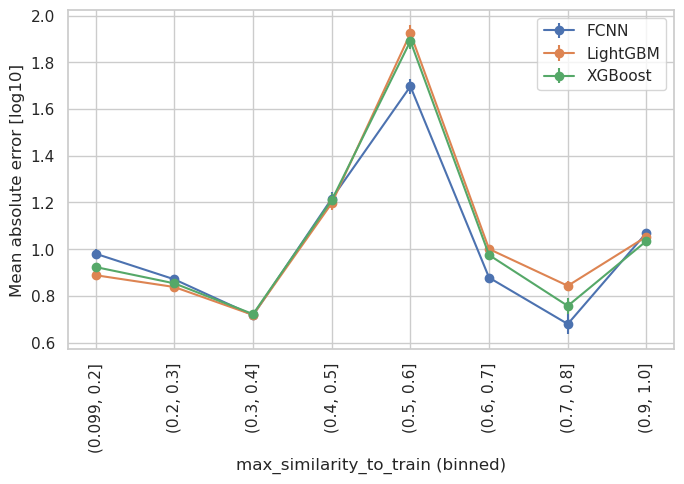

pampa MDCK-Irvine butina


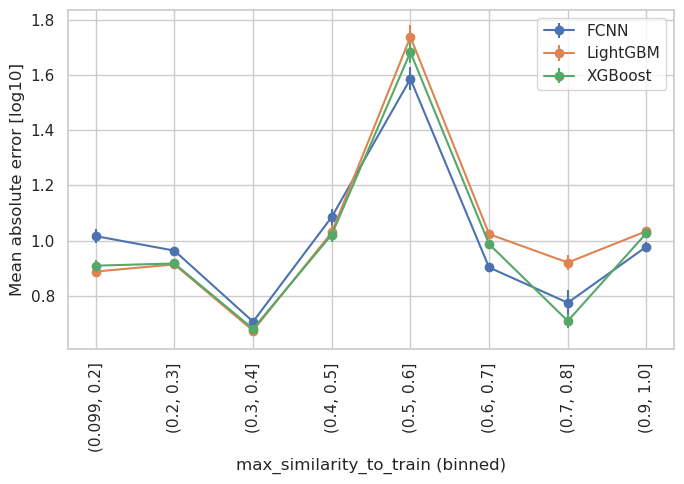

pampa MDCK-Irvine scaffold


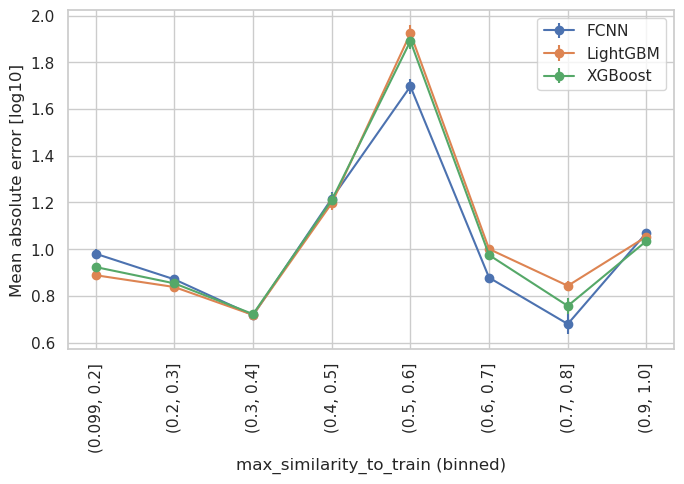

bbb MDCK-Irvine butina


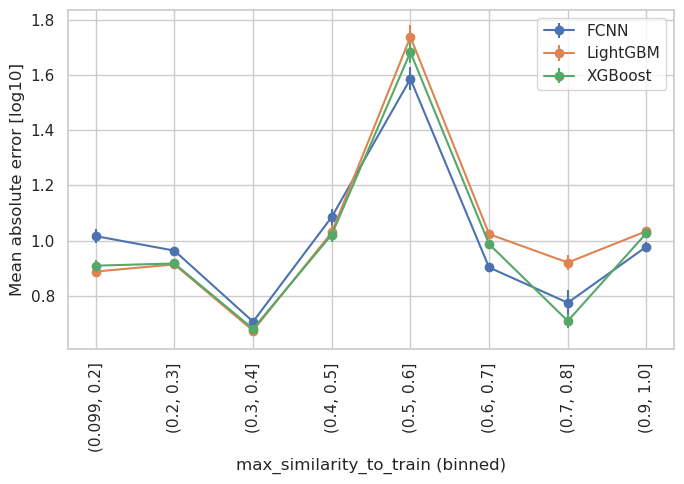

bbb MDCK-Irvine scaffold


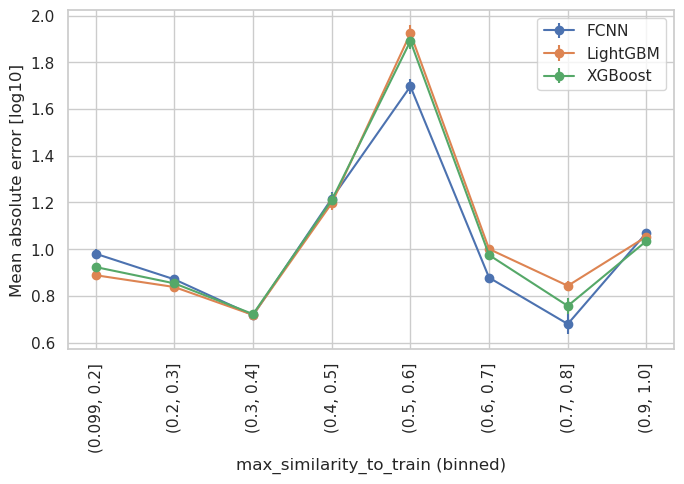

popc_chol MDCK-MDR1-Hellinger butina


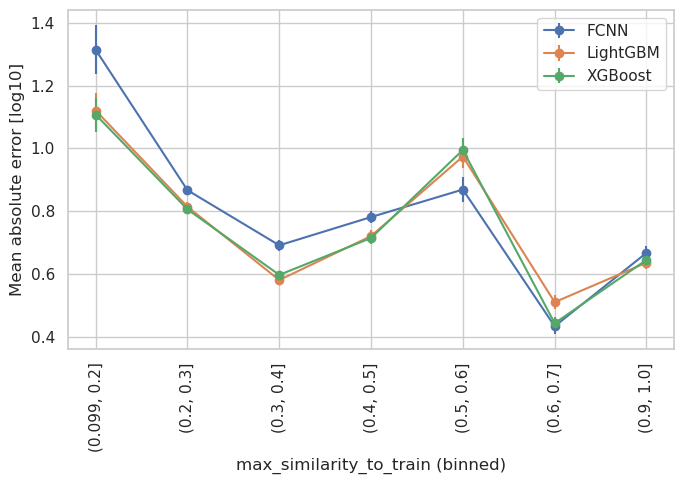

popc_chol MDCK-MDR1-Hellinger scaffold


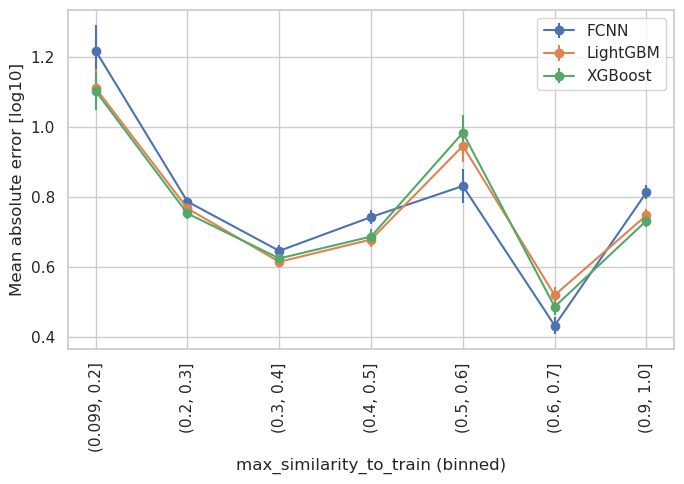

pampa MDCK-MDR1-Hellinger butina


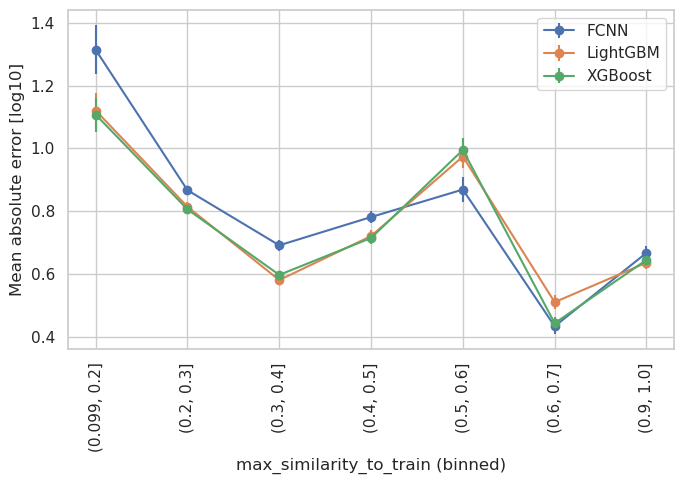

pampa MDCK-MDR1-Hellinger scaffold


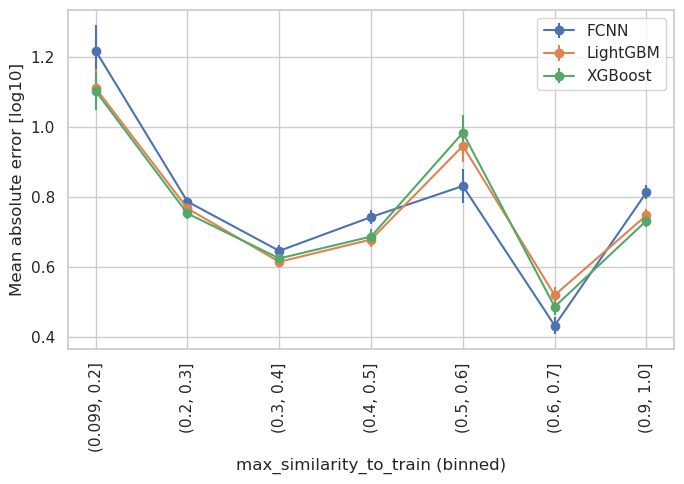

bbb MDCK-MDR1-Hellinger butina


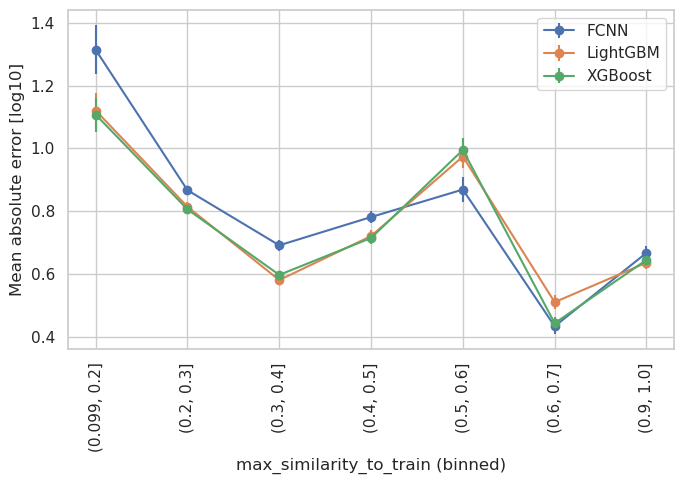

bbb MDCK-MDR1-Hellinger scaffold


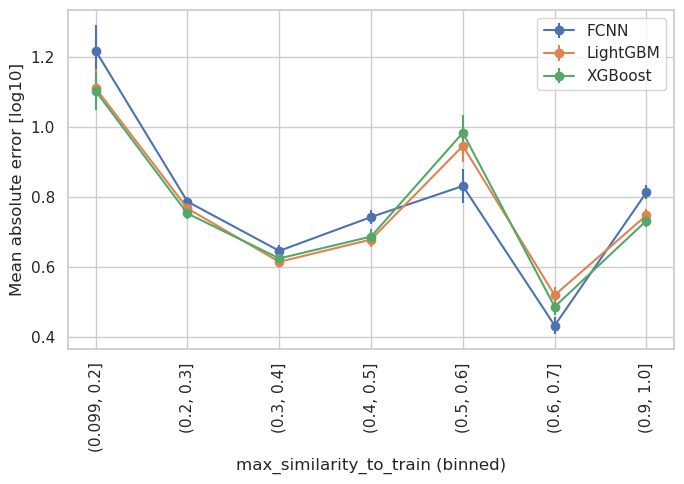

popc_chol MDCK-MDR1-QWang butina


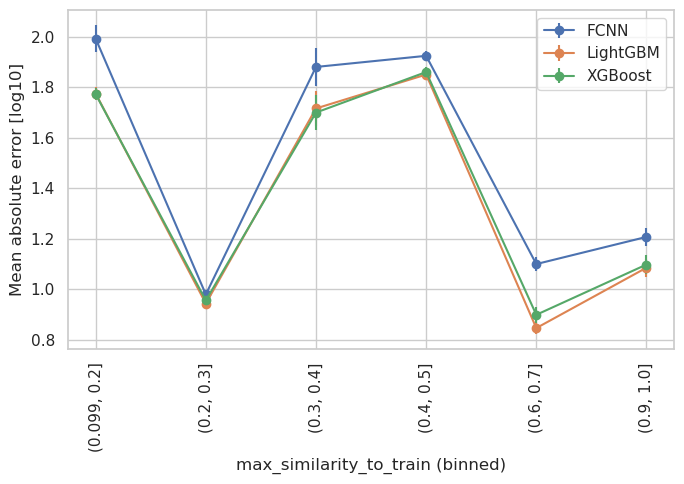

popc_chol MDCK-MDR1-QWang scaffold


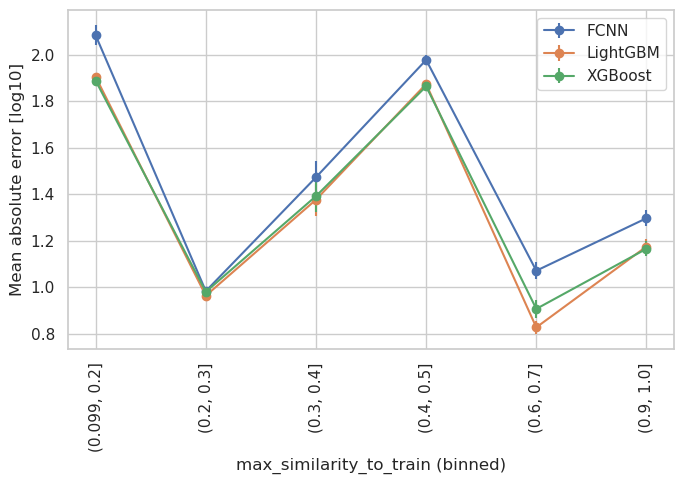

pampa MDCK-MDR1-QWang butina


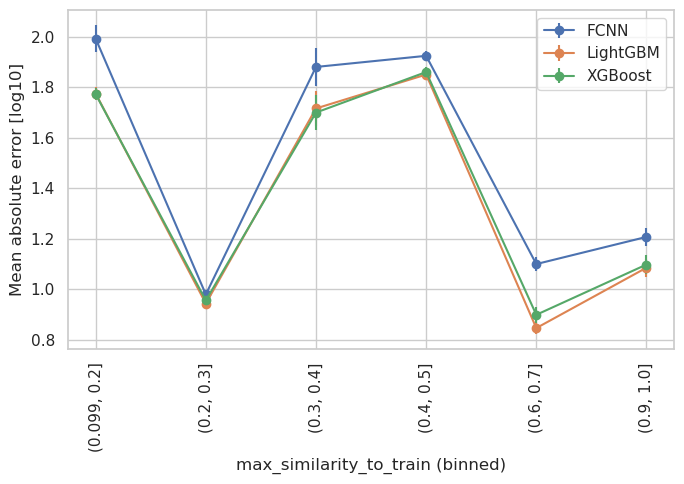

pampa MDCK-MDR1-QWang scaffold


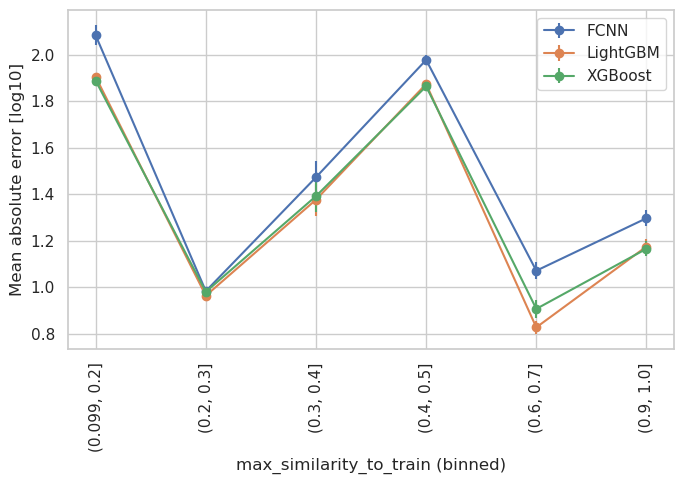

bbb MDCK-MDR1-QWang butina


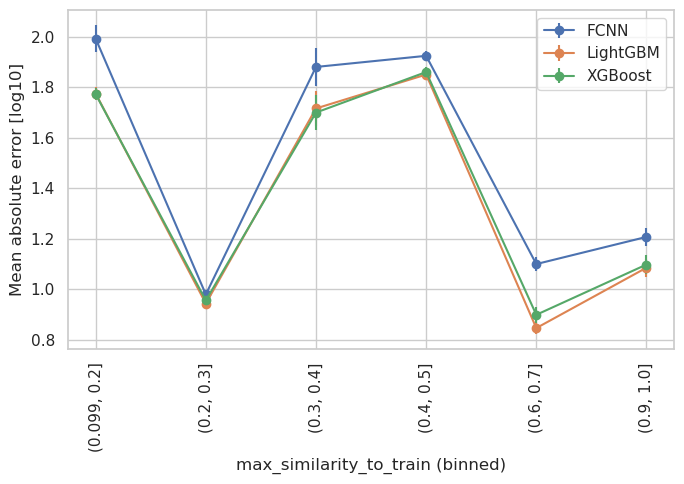

bbb MDCK-MDR1-QWang scaffold


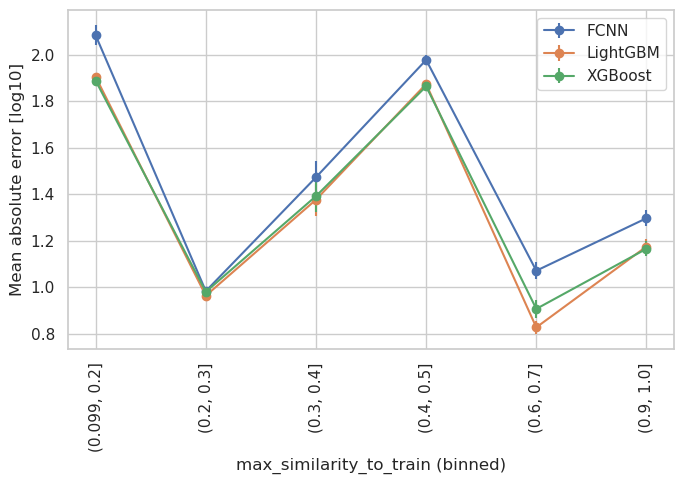

popc_chol MDCK-MDR1-Summerfield butina


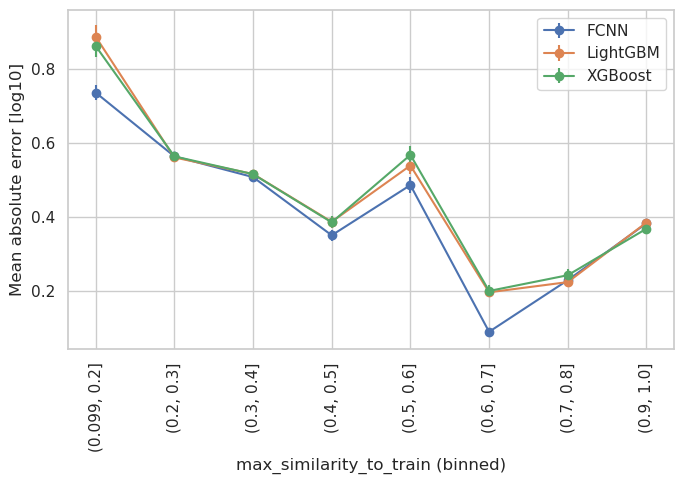

popc_chol MDCK-MDR1-Summerfield scaffold


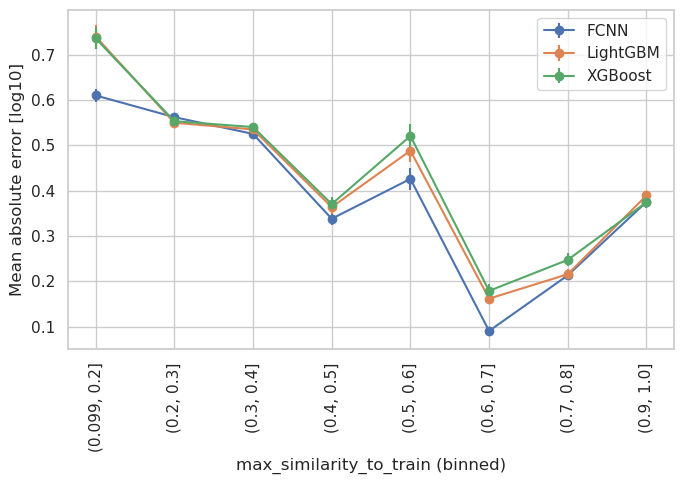

pampa MDCK-MDR1-Summerfield butina


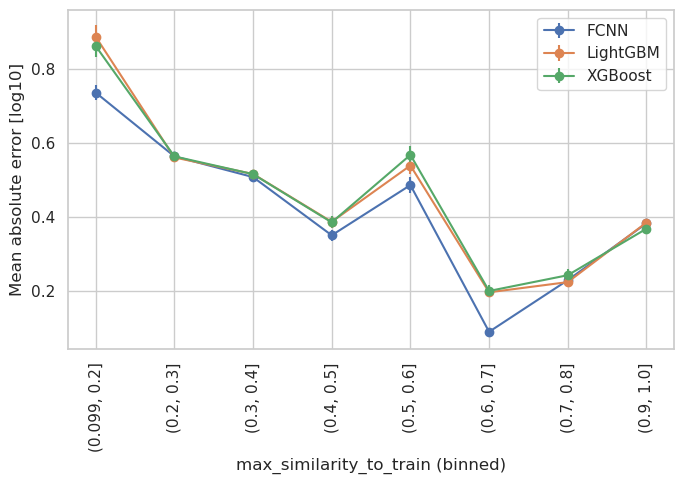

pampa MDCK-MDR1-Summerfield scaffold


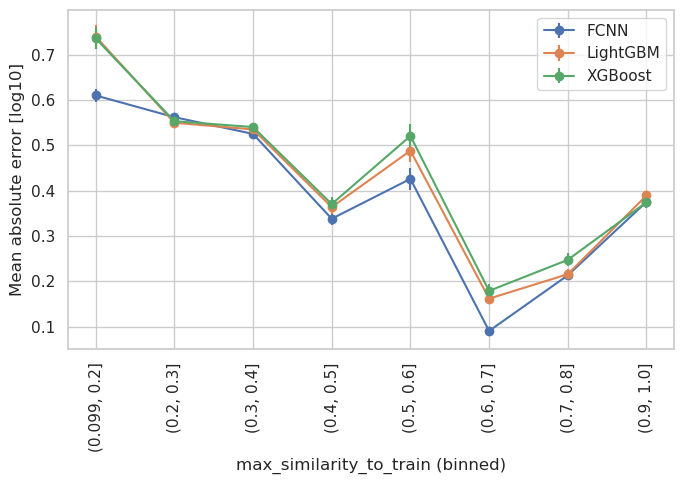

bbb MDCK-MDR1-Summerfield butina


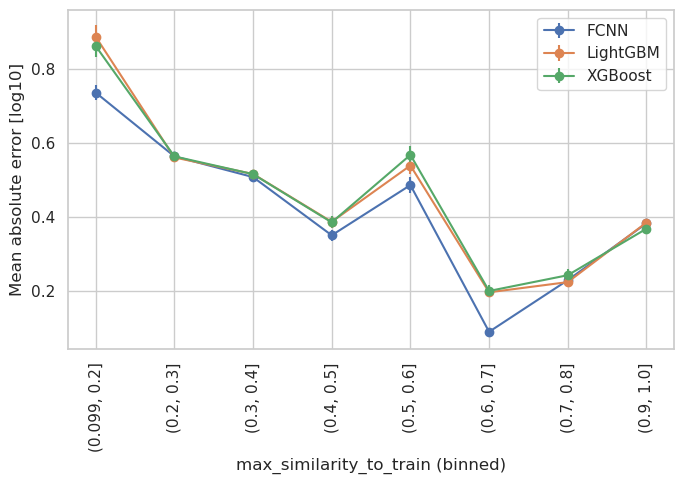

bbb MDCK-MDR1-Summerfield scaffold


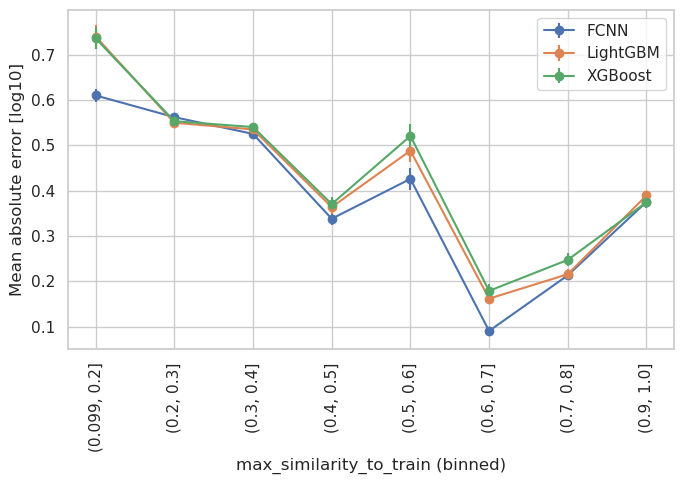

In [79]:

for source in ["cMdr1_KO_MDCK1-beran", "MDCK-Hellinger", "MDCK-Irvine", "MDCK-MDR1-Hellinger", "MDCK-MDR1-QWang", "MDCK-MDR1-Summerfield"]:

    for system in ["popc_chol", "pampa", "bbb"]:
        
        for split in ["butina", "scaffold"]:

            print (system, source, split)

            nn_similarity_csvs = [f"nn_similarity_summaries/{system}-non-biogen/{source}/{system}_{split}_including-protomers.csv",
                                f"nn_similarity_summaries/{system}-non-biogen/{source}/{system}_{split}_including-protomers.csv",
                                f"nn_similarity_summaries/{system}-non-biogen/{source}/{system}_{split}_including-protomers.csv"]
                                        
            results = plot_similarity_vs_error(model_folders=model_folders, model_list=model_list, split=split, source=source, nn_similarity_csvs=nn_similarity_csvs, what2bin="max_similarity_to_train")

            plot_binned_curves(results, metric="mean_abs_error", what2bin="max_similarity_to_train")

popc_chol cMdr1_KO_MDCK1-beran butina


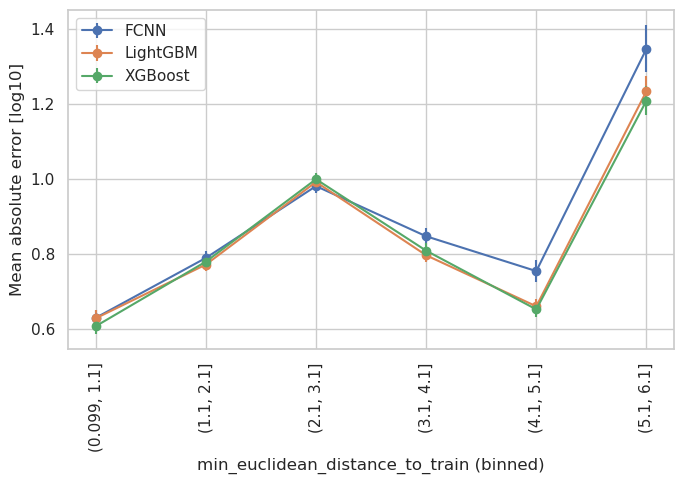

popc_chol cMdr1_KO_MDCK1-beran scaffold


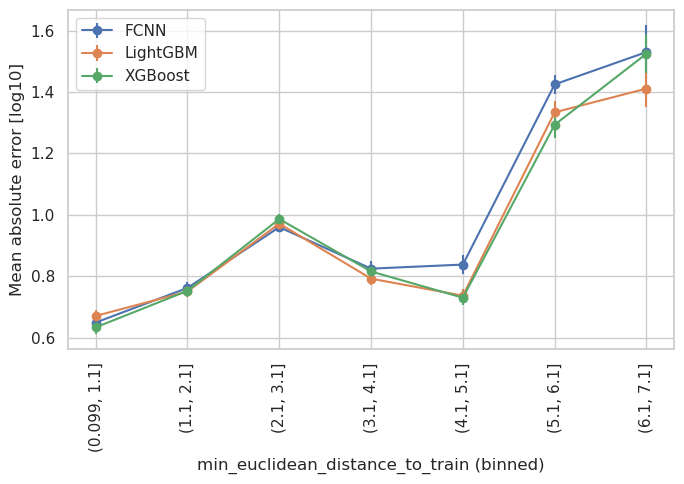

pampa cMdr1_KO_MDCK1-beran butina


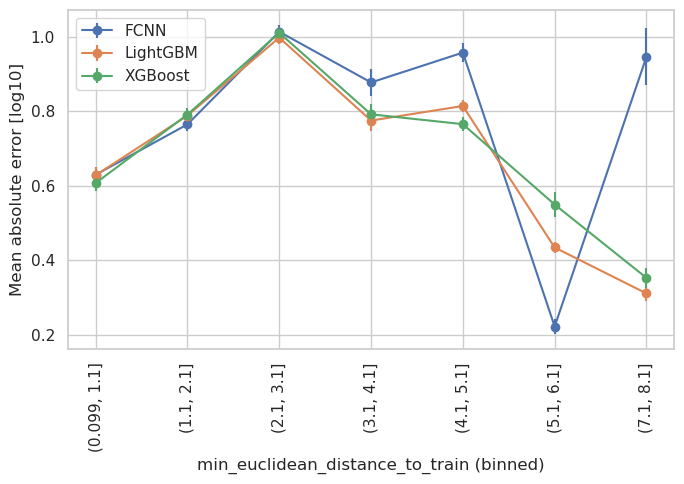

pampa cMdr1_KO_MDCK1-beran scaffold


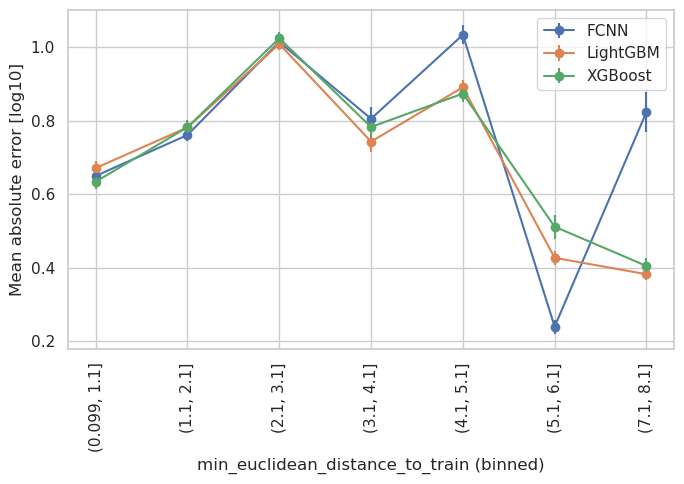

bbb cMdr1_KO_MDCK1-beran butina


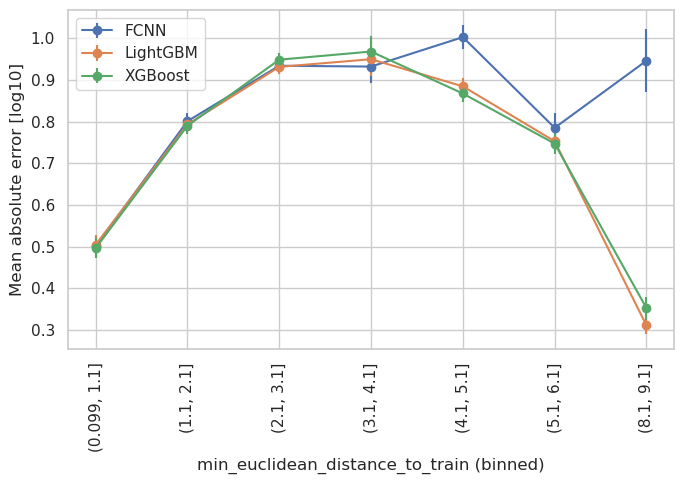

bbb cMdr1_KO_MDCK1-beran scaffold


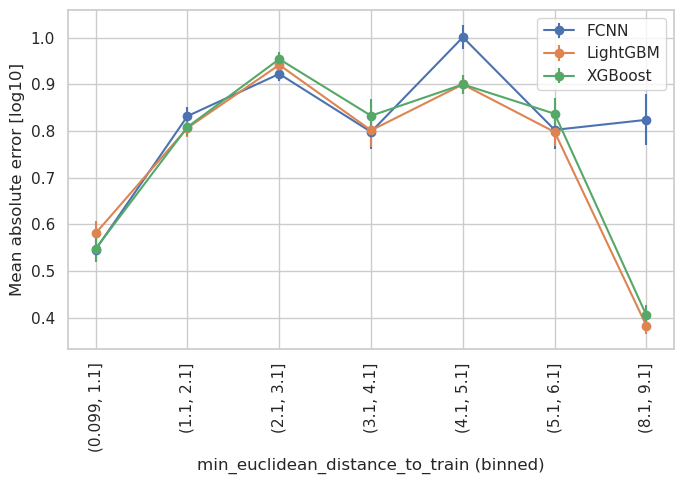

popc_chol MDCK-Hellinger butina


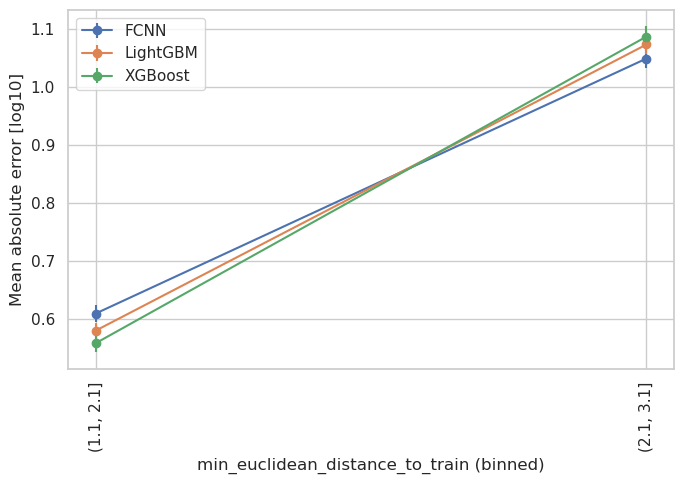

popc_chol MDCK-Hellinger scaffold


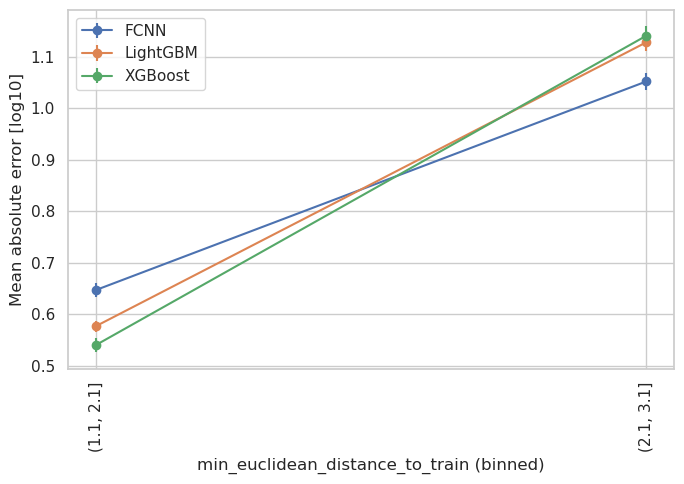

pampa MDCK-Hellinger butina


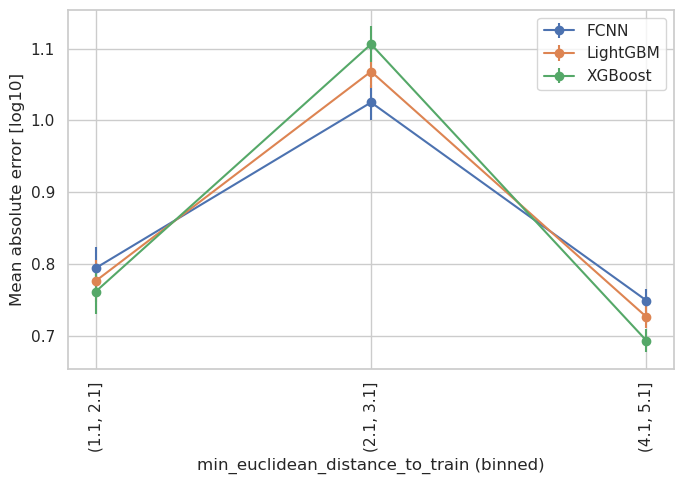

pampa MDCK-Hellinger scaffold


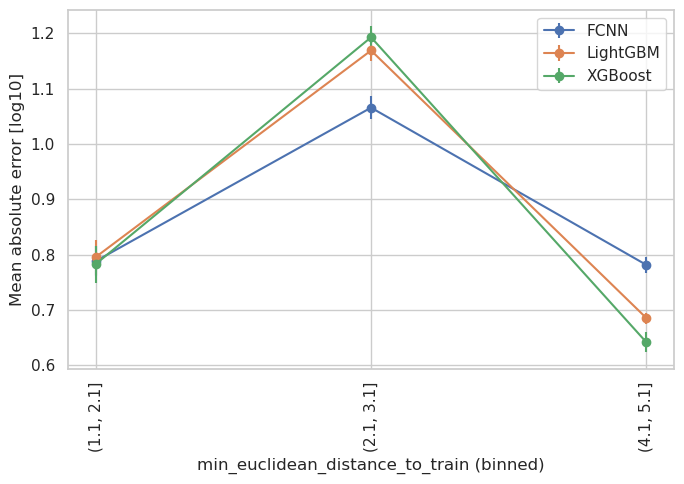

bbb MDCK-Hellinger butina


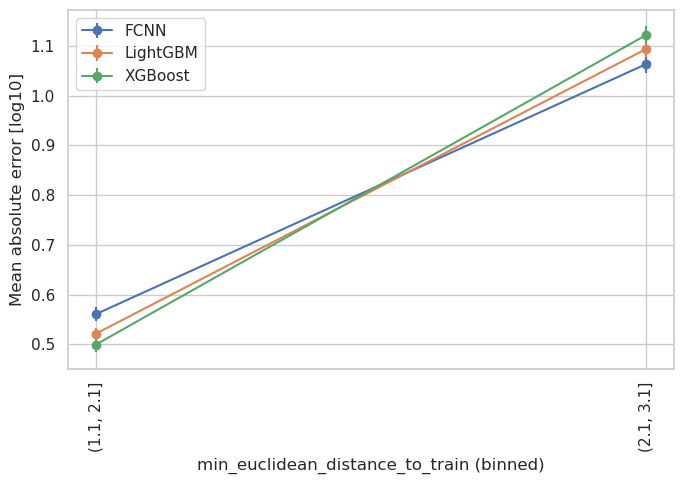

bbb MDCK-Hellinger scaffold


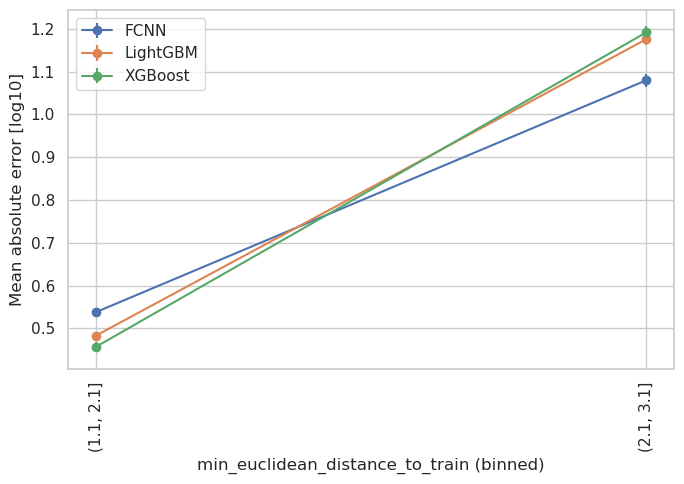

popc_chol MDCK-Irvine butina


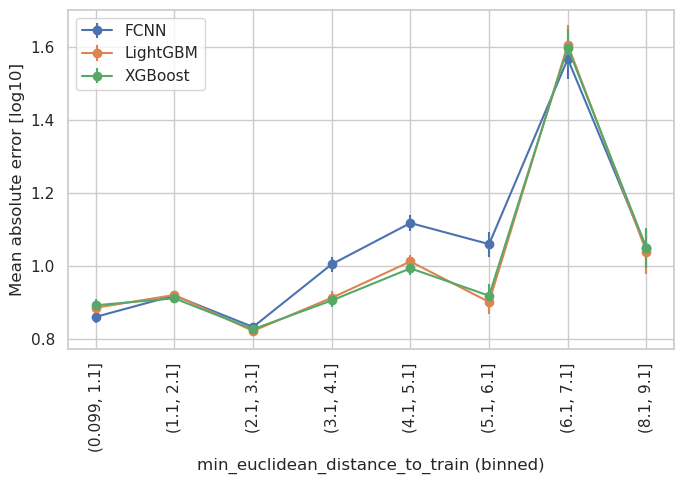

popc_chol MDCK-Irvine scaffold


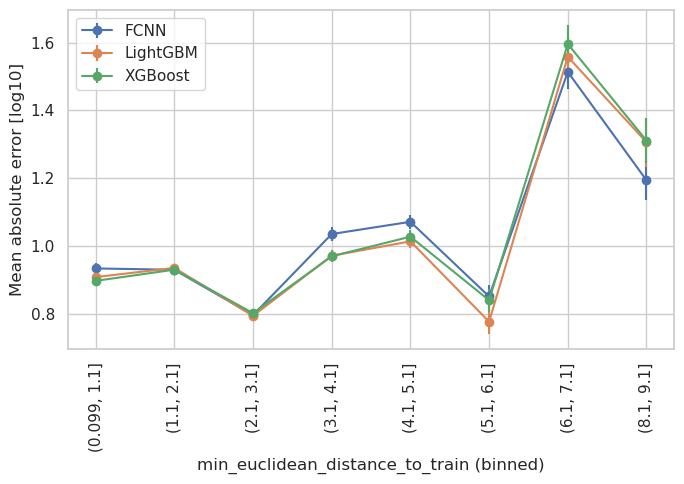

pampa MDCK-Irvine butina


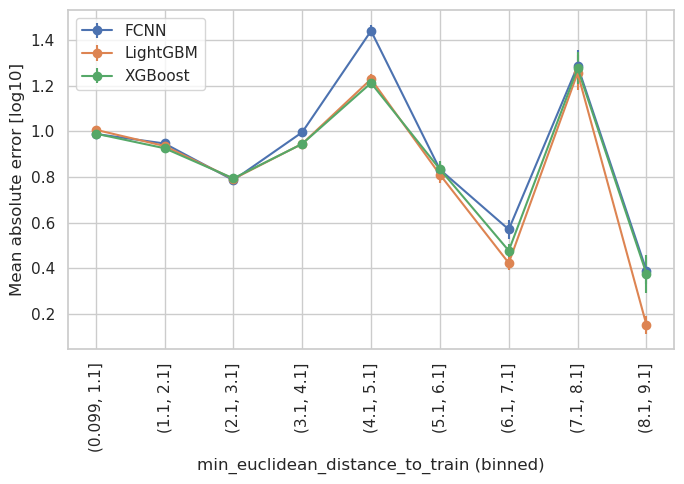

pampa MDCK-Irvine scaffold


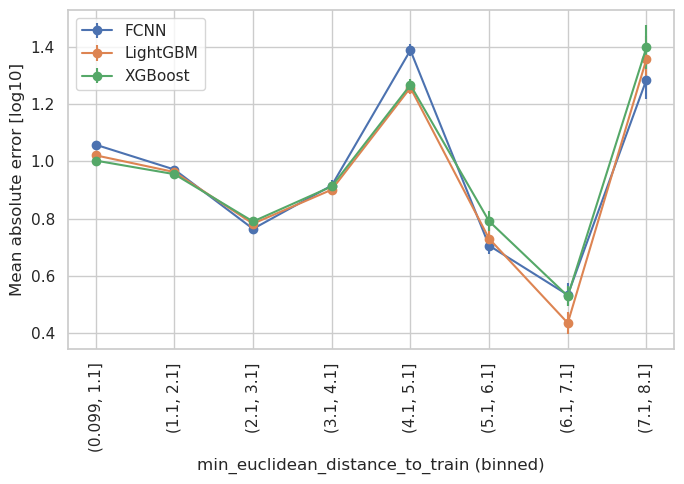

bbb MDCK-Irvine butina


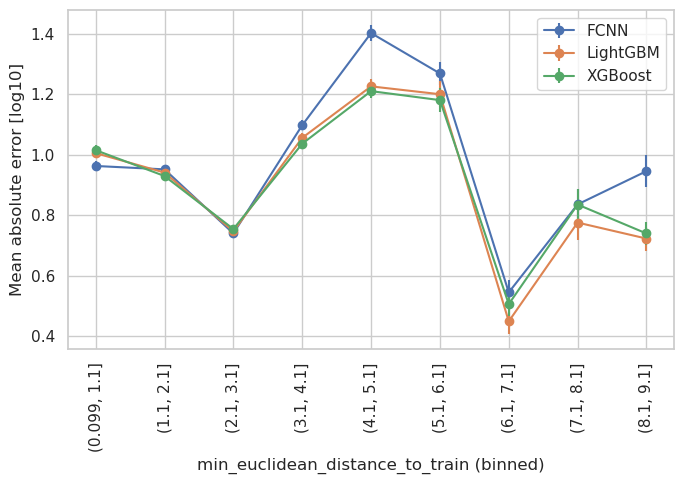

bbb MDCK-Irvine scaffold


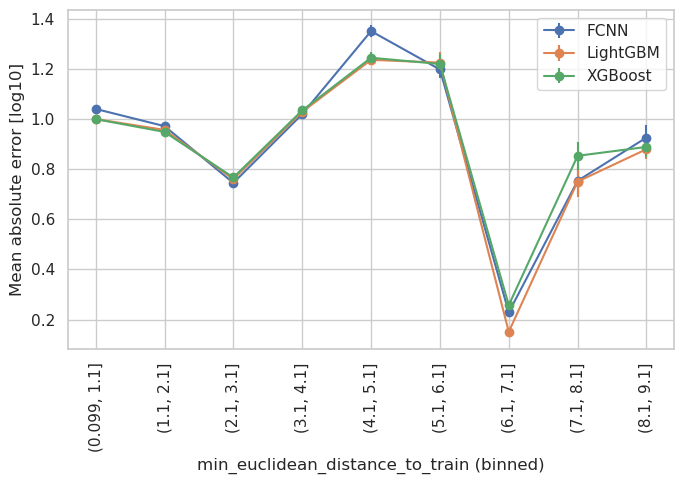

popc_chol MDCK-MDR1-Hellinger butina


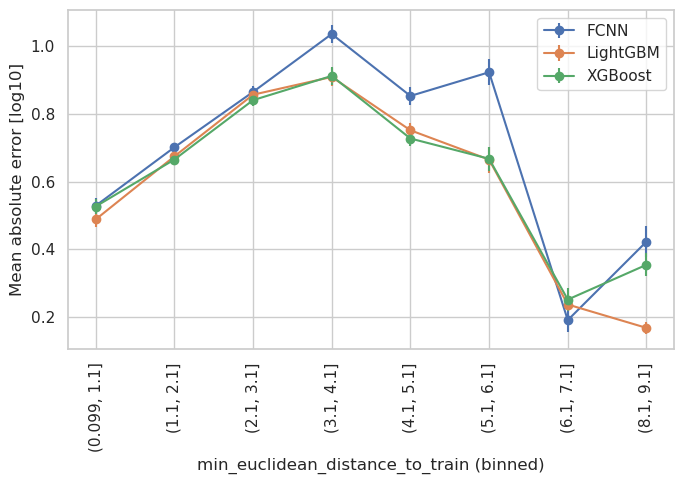

popc_chol MDCK-MDR1-Hellinger scaffold


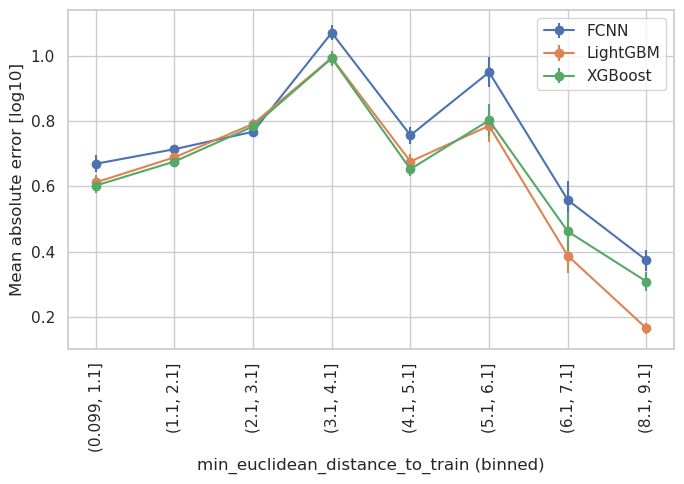

pampa MDCK-MDR1-Hellinger butina


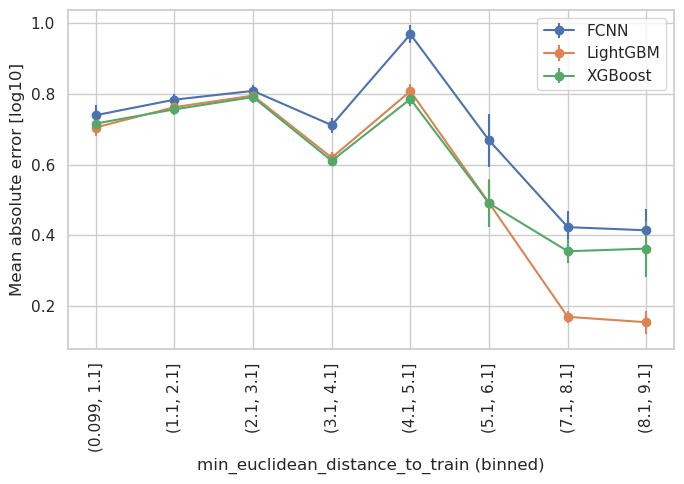

pampa MDCK-MDR1-Hellinger scaffold


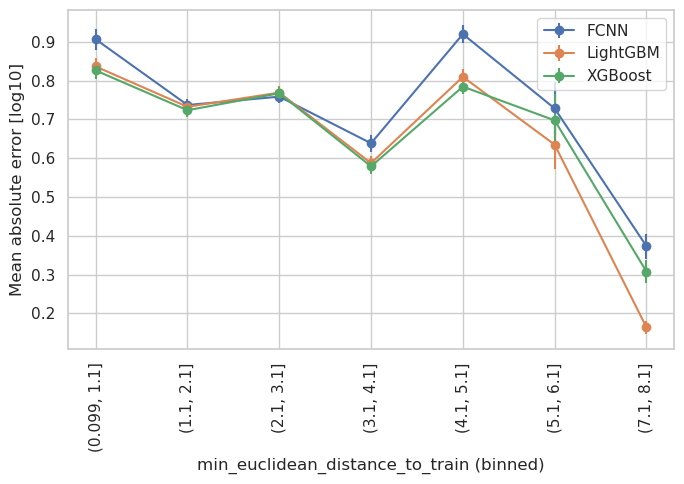

bbb MDCK-MDR1-Hellinger butina


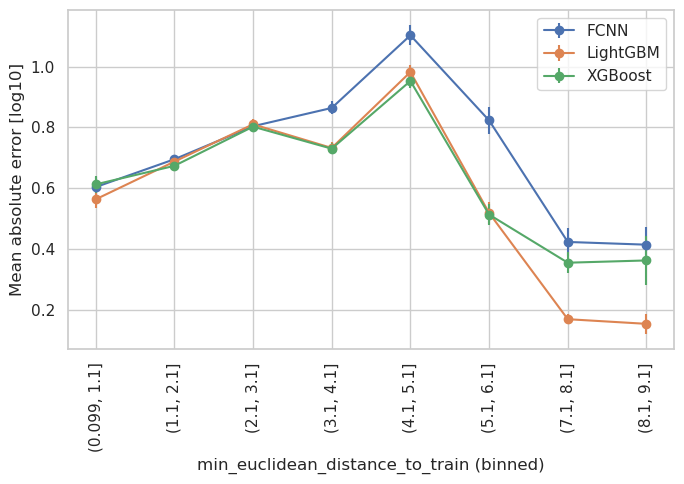

bbb MDCK-MDR1-Hellinger scaffold


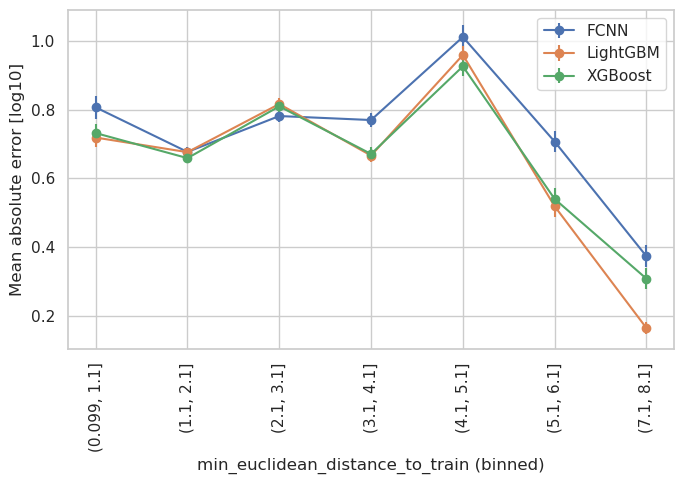

popc_chol MDCK-MDR1-QWang butina


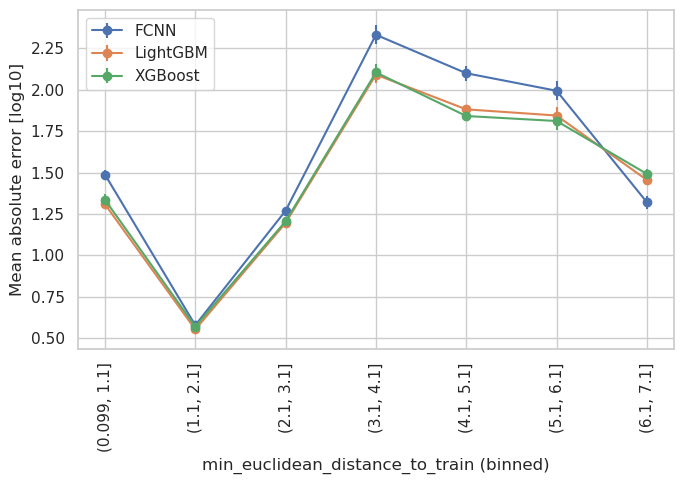

popc_chol MDCK-MDR1-QWang scaffold


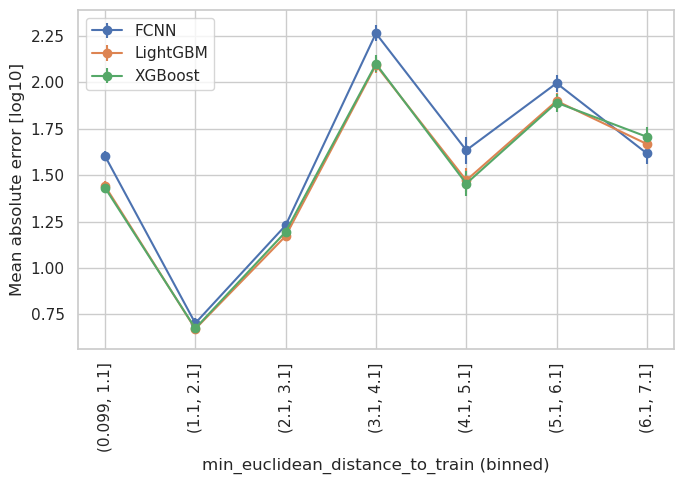

pampa MDCK-MDR1-QWang butina


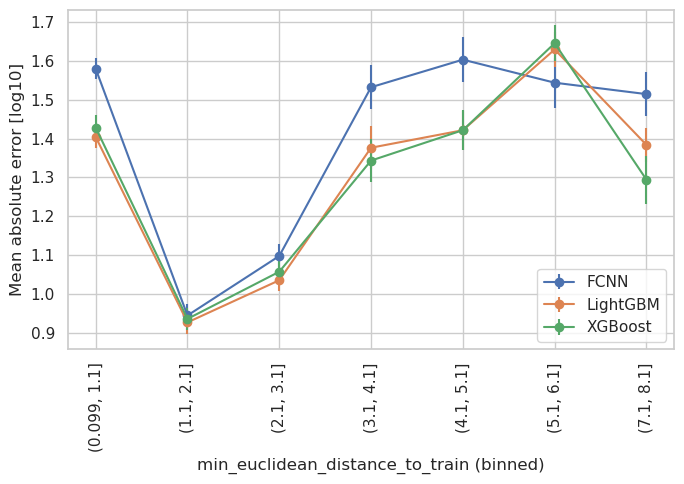

pampa MDCK-MDR1-QWang scaffold


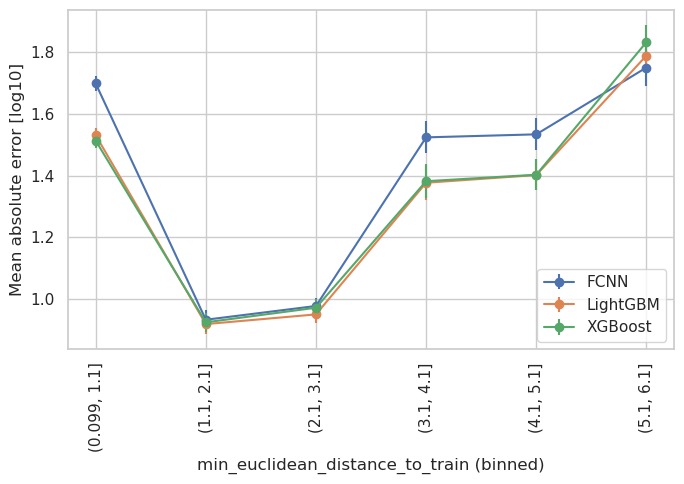

bbb MDCK-MDR1-QWang butina


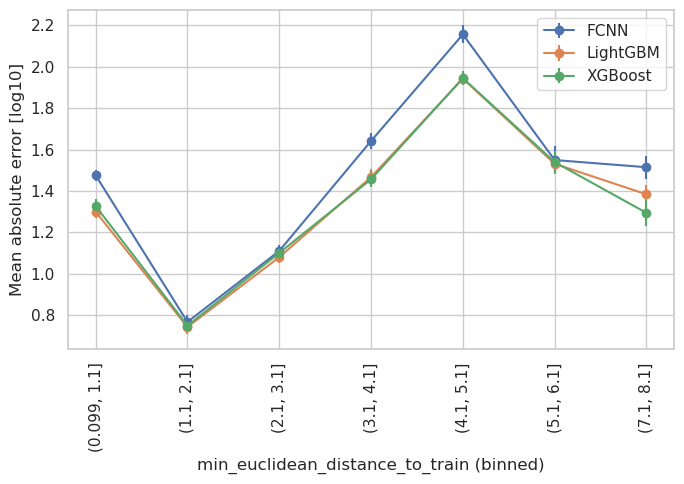

bbb MDCK-MDR1-QWang scaffold


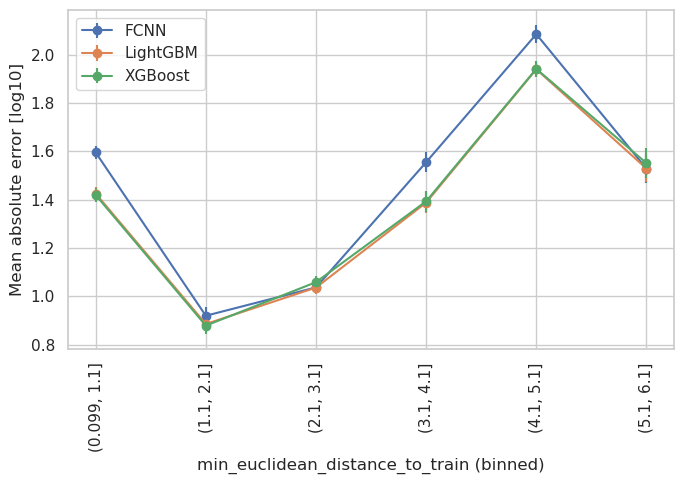

popc_chol MDCK-MDR1-Summerfield butina


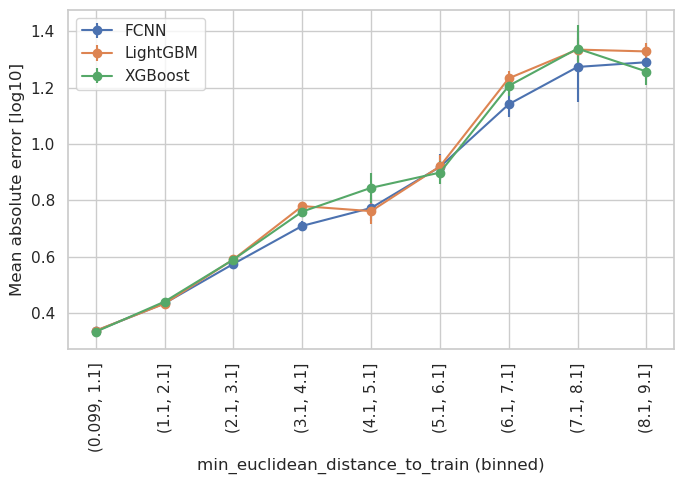

popc_chol MDCK-MDR1-Summerfield scaffold


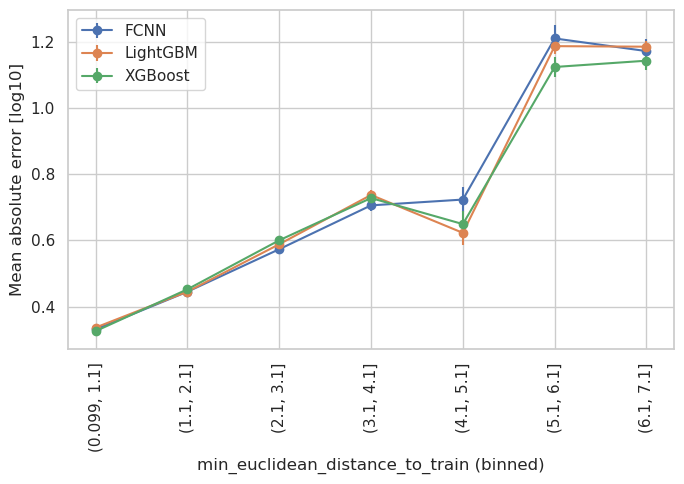

pampa MDCK-MDR1-Summerfield butina


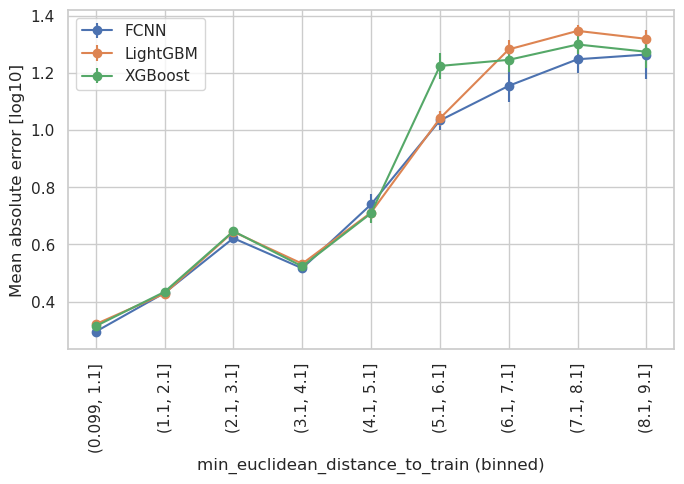

pampa MDCK-MDR1-Summerfield scaffold


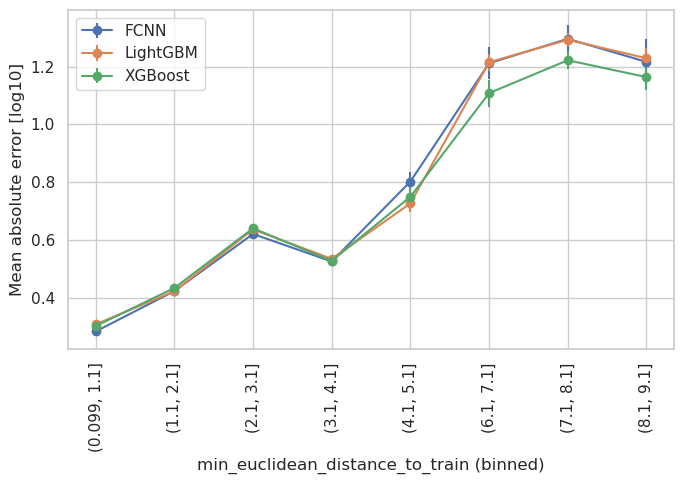

bbb MDCK-MDR1-Summerfield butina


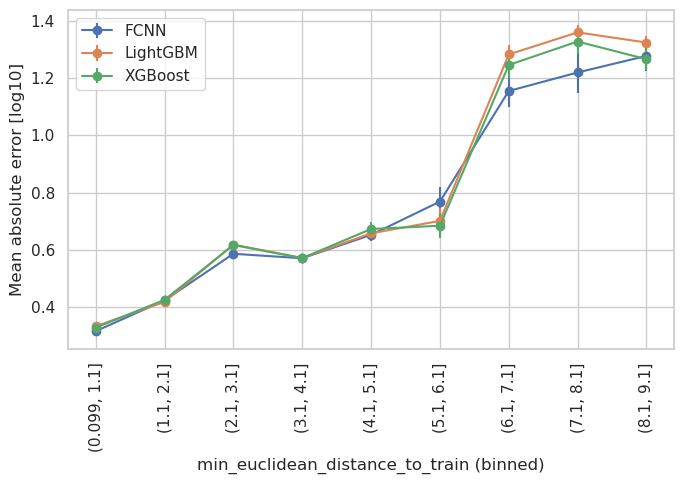

bbb MDCK-MDR1-Summerfield scaffold


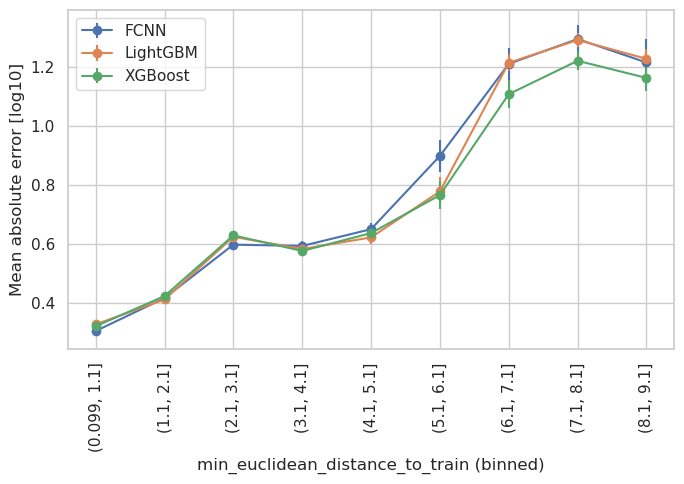

In [80]:
for source in ["cMdr1_KO_MDCK1-beran", "MDCK-Hellinger", "MDCK-Irvine", "MDCK-MDR1-Hellinger", "MDCK-MDR1-QWang", "MDCK-MDR1-Summerfield"]:

    for system in ["popc_chol", "pampa", "bbb"]:
        
        for split in ["butina", "scaffold"]:

            print (system, source, split)

            nn_similarity_csvs = [f"nn_similarity_summaries/{system}-non-biogen/{source}/{system}_{split}_including-protomers.csv",
                                f"nn_similarity_summaries/{system}-non-biogen/{source}/{system}_{split}_including-protomers.csv",
                                f"nn_similarity_summaries/{system}-non-biogen/{source}/{system}_{split}_including-protomers.csv"]
                                        
            results = plot_similarity_vs_error(model_folders=model_folders, model_list=model_list, split=split, source=source, nn_similarity_csvs=nn_similarity_csvs, what2bin="min_euclidean_distance_to_train")

            plot_binned_curves(results, metric="mean_abs_error", what2bin="min_euclidean_distance_to_train")

-------------------------------------------------

In [47]:
import itertools

def parse_experiment_source(fname):
    """
    Extract experiment and source from filename
    popc-chol_..._lgfe-EXPERIMENT-SOURCE.csv
    """
    stem = Path(fname).stem
    tag = stem.split("lgfe-")[1]
    experiment, source = tag.rsplit("-", 1)
    return experiment, source


def compute_pairwise_diffs(values):
    if len(values) < 2:
        return None
    diffs = [abs(a - b) for a, b in itertools.combinations(values, 2)]
    # return np.median(diffs)
    return np.max(diffs)


def analyze_experimental_consistency(csv_files):
    records = []

    for f in csv_files:
        df = pd.read_csv(f)
        exp, src = parse_experiment_source(f)

        df["experiment"] = exp
        df["source"] = src
        df["file"] = Path(f).name

        records.append(df)

    df_all = pd.concat(records, ignore_index=True)

    results = []

    for parent, g in df_all.groupby("Parent"):
        files = sorted(g["file"].unique())
        molecule = g["Molecule"].iloc[0]

        # ---- Case 1: same experiment, different sources ----
        same_exp_errors = []

        for exp, eg in g.groupby("experiment"):
            src_groups = eg.groupby("source")["log10_P_app"].median()
            err = compute_pairwise_diffs(src_groups.values)
            if err is not None:
                same_exp_errors.append(err)

        same_exp_err = np.median(same_exp_errors) if same_exp_errors else "NA"

        # ---- Case 2: different experiments ----
        exp_groups = g.groupby("experiment")["log10_P_app"].median()
        diff_exp_err = compute_pairwise_diffs(exp_groups.values)
        diff_exp_err = diff_exp_err if diff_exp_err is not None else "NA"

        results.append({
            "Molecule": molecule,
            "Parent": parent,
            "Same_Expt_Different_Source": same_exp_err,
            "Different_Expt": diff_exp_err,
            "included_in_files": ", ".join(files)
        })

    return pd.DataFrame(results)


In [48]:
csv_files = [
    "../data-processed/popc_chol-non-biogen/P_app/explicit_protomers/popc-chol_P_app_including_protomers_lgfe-cMdr1_KO_MDCK1-beran.csv",
    "../data-processed/popc_chol-non-biogen/P_app/explicit_protomers/popc-chol_P_app_including_protomers_lgfe-MDCK-MDR1-Hellinger.csv",
    "../data-processed/popc_chol-non-biogen/P_app/explicit_protomers/popc-chol_P_app_including_protomers_lgfe-MDCK-Hellinger.csv",
    "../data-processed/popc_chol-non-biogen/P_app/explicit_protomers/popc-chol_P_app_including_protomers_lgfe-MDCK-MDR1-QWang.csv",
    "../data-processed/popc_chol-non-biogen/P_app/explicit_protomers/popc-chol_P_app_including_protomers_lgfe-MDCK-Irvine.csv",
    "../data-processed/popc_chol-non-biogen/P_app/explicit_protomers/popc-chol_P_app_including_protomers_lgfe-MDCK-MDR1-Summerfield.csv",
]

consistency_df = analyze_experimental_consistency(csv_files)
consistency_df.to_csv("consistency_analysis.csv", index=False)



In [49]:
consistency_df

,Molecule,Parent,Same_Expt_Different_Source,Different_Expt,included_in_files
0,Acebutolol_2,Acebutolol,NA,NA,popc-chol_P_app_including_protomers_lgfe-MDCK-...
1,Acetaminophen_1,Acetaminophen,NA,0.56361,popc-chol_P_app_including_protomers_lgfe-MDCK-...
2,Acetylsalicylic_Acid_5,Acetylsalicylic_Acid,NA,NA,popc-chol_P_app_including_protomers_lgfe-MDCK-...
3,Acrivastine_8,Acrivastine,NA,NA,popc-chol_P_app_including_protomers_lgfe-MDCK-...
4,Acyclovir_9,Acyclovir,NA,NA,popc-chol_P_app_including_protomers_lgfe-MDCK-...
...,...,...,...,...,...
107,Voriconazole_46,Voriconazole,NA,NA,popc-chol_P_app_including_protomers_lgfe-cMdr1...
108,Voxelotor_47,Voxelotor,NA,NA,popc-chol_P_app_including_protomers_lgfe-cMdr1...
109,Warfarin_131,Warfarin,NA,0.022276,popc-chol_P_app_including_protomers_lgfe-MDCK-...
110,Zaleplon_132,Zaleplon,NA,NA,popc-chol_P_app_including_protomers_lgfe-MDCK-...


In [50]:
def make_tab_separated_table(files, output_file="molecule_table.csv"):
    """
    Build a tab-separated table of Parent molecules across multiple files.
    Only include molecules that appear in at least 2 files.
    
    """
    dfs = {}
    for f in files:
        df = pd.read_csv(f)
        dfs[f] = df[['Parent', 'log10_P_app']]

    # Count in how many files each molecule appears
    parent_counts = {}
    for df in dfs.values():
        for parent in df['Parent'].unique():
            parent_counts[parent] = parent_counts.get(parent, 0) + 1

    # Only keep molecules in at least 2 files
    mol_of_interest = [p for p, c in parent_counts.items() if c >= 2]

    # Build the table rows
    rows = []
    for parent in mol_of_interest:
        row = {'Parent': parent}
        for f, df in dfs.items():
            val = df.loc[df['Parent'] == parent, 'log10_P_app']
            row[Path(f).name] = str(val.values[0]) if not val.empty else ""
        rows.append(row)

    final_df = pd.DataFrame(rows)

    # Save as TSV
    final_df.to_csv(output_file, sep='\t', index=False)
    

In [51]:
make_tab_separated_table(csv_files)